# **Sincronize ADCP & MCTD DRIFT data and Calculate Variables**

<span style="color:red">This code was last tested on February 24, 2026, and is running without issues.</span>


**PURPOSE:** Open MCTD Data and ADCP data to sincronize them on the third step of the preprocessing. It calculates the main variables, plot them and also calculate minimum and maximum values of the variables to include in the paper discription of the results

__________________________________________________________________________________________  

**Input files:**  

ADCP_rdz.pkl  
MCTD_data_drift.pkl  
coords.pkl  
on path: = "/Users/deboragadelha/Jupyter/barros_et_al_2026/output_dir/processed_data"  

  

satelitemap.tiff  
on path: = "/Users/deboragadelha/Jupyter/barros_et_al_2026/input_dir/image_data/" 


**Output files:** 

matrix_alltogether.pkl  
matrix_calc_alltogether.pkl  
bathymetry.pkl  
Rotated_velocity.pkl  
on path: = "/Users/deboragadelha/Jupyter/barros_et_al_2026/output_dir/processed_data/"  


drift_sal_temp_rho_vs_distance.png  
drift_epsilonmean_vs_distance.png  
Drift_N_S_Ri_Az_calc_vs_distance.png  
on path: = "/Users/deboragadelha/Jupyter/barros_et_al_2026/output_dir/processed_image/

__________________________________________________________________________________________

In [1]:
import pickle
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.colors as mcolors
import numpy as np
from scipy.interpolate import griddata
import rasterio
from rasterio.plot import show 
from scipy.interpolate import interp1d
import os

# using the path to the tools folder:
path_to_tools = os.path.abspath(os.path.join('..', 'tools'))
sys.path.append(path_to_tools)

import vector_tools as vt

import cmocean

### Loading map to plot the casts:

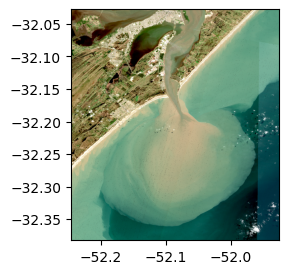

<Axes: >

In [2]:
#load the georeferenced map (tif) where you want to plot the casts:

map_path = "/Users/deboragadelha/Jupyter/barros_et_al_2026/input_dir/image_data/"
basemap = rasterio.open(map_path + 'satelitemap.tiff')

plt.figure(figsize=(3,3))
show(basemap)

### Loading previous preprocessed **MCTD** and **ADCP** data from Notebooks STEP1 and STEP2:

In [3]:
output_data = '../output_dir/processed_data/'
output_image = '../output_dir/processed_image/'

os.makedirs(output_data, exist_ok=True)
os.makedirs(output_image, exist_ok=True)

# ADCP

In [4]:
with open(output_data + 'ADCP_rdz.pkl','rb') as io:
    adcp = pickle.load(io)

adcp_hdr = adcp[0]
adcp_time = adcp[1]
adcp_lon = adcp[2]
adcp_lat = adcp[3]
adcp_depth = adcp[4]
adcp_levels = adcp[5]
adcp_rea = adcp[6]
adcp_u = adcp[7]
adcp_v = adcp[8]

# there is a flaw in the coordinates -- it is in a 'juction', when we finished the drift and start navigating to the area besides the jetties! Doesn´t make difference!
i = np.where(adcp_lat < -5000)[0]
adcp_lat[i] = (adcp_lat[i-1] + adcp_lat[i+1])/2
adcp_lon[i] = (adcp_lon[i-1] + adcp_lon[i+1])/2


adcp_time_n = mdates.date2num(adcp_time)

(np.float64(-52.1100605035),
 np.float64(-52.066746166499996),
 np.float64(-32.2386408335),
 np.float64(-32.1093724965))

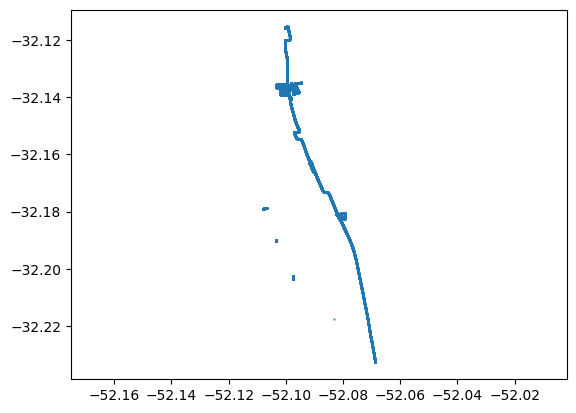

In [5]:
plt.plot(adcp_lon, adcp_lat, '.', ms=1)
plt.axis('equal')

# MicroCTD

In [6]:
with open(output_data + 'MCTD_data_drift.pkl', 'rb') as io:
    mctd = pickle.load(io)

#   0    1   2     3    4    5   6   7    8      9    10
# tempo, z, sal, temp, rho, e1, e2, ws, theta, jacT, jacC

In [7]:
mctd[0][0,0]

np.float64(19191.472973626307)

## Removing casts with wrong data (bad falling velocity):

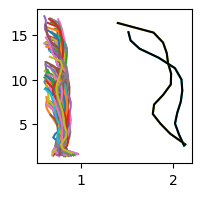

In [8]:
plt.figure(figsize=(2,2))
for i, arr in enumerate(mctd):
    plt.plot(arr[:,7], arr[:,1])
    if i in [8, 9]:
        plt.plot(arr[:,7], arr[:,1], 'k')

## <span style="color:red"> Run the next cell just once!!!!!! </span>

It will remove the bad data, but if you run it again will remove the next cats too.

In [9]:
mctd.pop(8)
mctd.pop(8)

array([[1.91914843e+04, 2.60628740e+00, 7.58472163e+00, 1.27774883e+01,
        1.00527680e+03, 1.13703188e-05, 2.32424489e-05, 2.11475630e+00,
        6.13927778e+01, 1.27774883e+01, 1.02007117e+01],
       [1.91914843e+04, 3.84739363e+00, 7.89796904e+00, 1.28022684e+01,
        1.00551488e+03, 2.67442167e-06, 7.32135746e-06, 2.05991796e+00,
        8.51213889e+01, 1.28022684e+01, 1.05139832e+01],
       [1.91914843e+04, 5.07031766e+00, 8.18082108e+00, 1.27932719e+01,
        1.00573424e+03, 5.70385827e-06, 8.93193196e-06, 2.01664432e+00,
        8.84083333e+01, 1.27932719e+01, 1.08705994e+01],
       [1.91914843e+04, 6.26482815e+00, 8.46594416e+00, 1.27801192e+01,
        1.00595594e+03, 8.55678487e-06, 7.86227725e-06, 2.04044701e+00,
        8.48044444e+01, 1.27801192e+01, 1.12464955e+01],
       [1.91914843e+04, 7.52260460e+00, 8.93584551e+00, 1.27694414e+01,
        1.00631969e+03, 2.76032761e-06, 3.86182051e-06, 2.07910376e+00,
        8.09102778e+01, 1.27694414e+01, 1.18212019e+

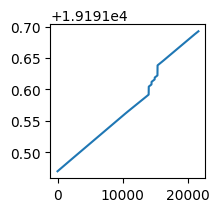

In [10]:
plt.figure(figsize=(2,2))
plt.plot(adcp_time_n)
for arr in mctd:
    plt.plot(arr[:,0])

# Distance

In [11]:
hdr = []
for arr in mctd:
    get_time = arr[0,0]
    lati = np.interp(get_time, adcp_time_n, adcp_lat)
    loni = np.interp(get_time, adcp_time_n, adcp_lon)
    depthi = np.interp(get_time, adcp_time_n, adcp_depth)
    hdr.append([get_time, loni, lati, depthi])

hdr = np.array(hdr)

dist = (np.diff(hdr[:,1])**2 + np.diff(hdr[:,2])**2)**.5 * 111.120
dist = np.cumsum(dist)
dist = np.insert(dist, 0, 0)

depth_drift = hdr[:,3]

In [12]:
print(hdr[0,1], hdr[0,2])
print(hdr[62,1], hdr[62,2])

-52.09895245938756 -32.11726638106521
-52.078365 -32.18846333


### Finding the point where the bar is!

<Axes: >

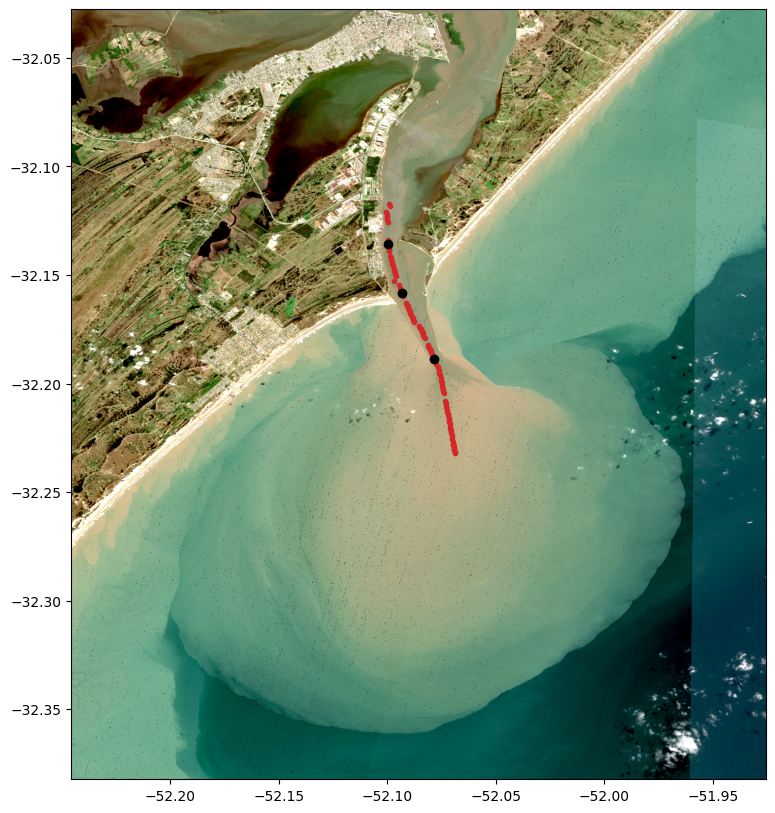

In [13]:
fig, axs = plt.subplots(figsize = (10,10)) #incrises the size but keep square shape 
axs.set_aspect('equal') #guarantee proportion 1x1 in lat/long
axs.plot(hdr[:,1], hdr[:,2], '.', color='tab:red')
axs.plot(hdr[10,1], hdr[10,2], 'ok') #constrained point 1 
axs.plot(hdr[30,1], hdr[30,2], 'ok') #beggining of breakwater
axs.plot(hdr[62,1], hdr[62,2], 'ok') #constrained point 2 (bar - conects lagoon with ocean) 

# plt.plot(adcp_lon, adcp_lat)
show(basemap, ax=axs)

# limits 'tecom'
# axs.set_xlim(-52.12, -52.06)
# axs.set_ylim(-32.16, -32.12)

# limits 'bar'
# axs.set_xlim(-52.10, -52.06)
# axs.set_ylim(-32.21, -32.17)

In [14]:
# Save the pickle on the right folder:
coords = np.column_stack((hdr[:,1], hdr[:,2]))

with open(os.path.join(output_data, 'coords.pkl'), 'wb') as io:
        pickle.dump(coords, io)


# Check the minimum water depth to use and reference for the vertical interpolation domain
What's the minimum MCTD level to be used in the interpolated domain? 

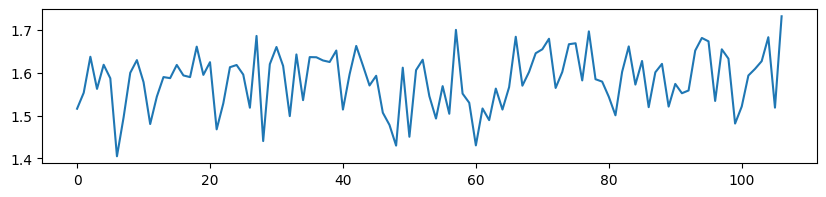

In [15]:
plt.figure(figsize=(10,2))
z0 = []
for arr in mctd:
    z0.append(arr[0,1])

plt.plot(z0)

In [16]:
z_min = np.max(z0) # minimun depth for the domain 

dt = 1/(24*3600) * 30

mtx_tj = np.zeros((1, 11))
m_sinc = []

mtx_tj_calc = np.zeros((1, 7))
for i, arr in enumerate(mctd):

    get_time = arr[0,0]

    idx = np.where( 
                    (adcp_time_n > get_time - dt)
                    &
                    (adcp_time_n < get_time + dt)
                  )[0]

    u = np.nanmean(adcp_u[idx, :], axis=0)
    v = np.nanmean(adcp_v[idx, :], axis=0)
    rea = np.nanmean(adcp_rea[idx, :], axis=0)
    depth = np.mean(adcp_depth[idx])

    zi = np.arange(z_min, np.max(arr[:,1]), 0.5)
    
    #   0    1   2     3    4    5   6   7    8      9    10
    # tempo, z, sal, temp, rho, e1, e2, ws, theta, jacT, jacC
    sal_i = np.interp(zi, arr[:,1], arr[:,2])
    temp_i = np.interp(zi, arr[:,1], arr[:,3])
    rho_i = np.interp(zi, arr[:,1], arr[:,4])
    e1_i = np.interp(zi, arr[:,1], arr[:,5])
    e2_i = np.interp(zi, arr[:,1], arr[:,6])
    ws_i = np.interp(zi, arr[:,1], arr[:,7])
    theta_i = np.interp(zi, arr[:,1], arr[:,8])
    u_i = np.interp(zi, adcp_levels, u)
    v_i = np.interp(zi, adcp_levels, v)
    rea_i = np.interp(zi, adcp_levels, rea)

    dist_i = np.linspace(dist[i], dist[i], len(sal_i))
    idx = np.linspace(i, i, len(sal_i))

    mtx = np.vstack((idx, dist_i, zi, sal_i, temp_i, rho_i, e1_i, e2_i, u_i, v_i, rea_i)).T

    m_sinc.append(mtx)
    mtx_tj = np.vstack((mtx_tj, mtx))

    ####################### CALCULATIONS...
    dist_i2 = dist_i[1:]
    zi2 = (zi[1:] + zi[:-1])/2
    dz = np.diff(zi)
    drho = np.diff(rho_i)
    g = 9.8
    rho0 = 1025

    vel_i = (u_i**2 + v_i**2)**.5
    du = np.diff(vel_i)

    # Richardson Nunber
    N2 = g/rho0*(drho/dz)
    S2 = (du/dz)**2
    Ri = N2/S2

    # Richarson flux 
    Rif = (1 - np.exp(-7*Ri))*.25

    # Mixing efficienty
    MixEf = Rif / (1 - Rif)

    # Eddy viscosity
    e_m = (e1_i + e2_i)/2
    e_m2 = (e_m[1:] + e_m[:-1])/2
    Az = MixEf * e_m2 / S2

    mtx_calc = np.vstack((dist_i2, zi2, N2, S2, Ri, e_m2, Az)).T
    mtx_tj_calc = np.vstack((mtx_tj_calc, mtx_calc))


mtx_tj = mtx_tj[1:, :]
mtx_tj_calc = mtx_tj_calc[1:,:]

/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_83378/2280733957.py:19: RuntimeWarning: Mean of empty slice
  u = np.nanmean(adcp_u[idx, :], axis=0)
/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_83378/2280733957.py:20: RuntimeWarning: Mean of empty slice
  v = np.nanmean(adcp_v[idx, :], axis=0)
/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_83378/2280733957.py:21: RuntimeWarning: Mean of empty slice
  rea = np.nanmean(adcp_rea[idx, :], axis=0)


In [17]:
# Save the pickle on the right folder:
with open(os.path.join(output_data, 'matrix_alltogether.pkl'), 'wb') as io:
        pickle.dump(mtx_tj, io)

# Save the pickle on the right folder:
with open(os.path.join(output_data, 'matrix_calc_alltogether.pkl'), 'wb') as io:
        pickle.dump(mtx_tj_calc, io)

In [18]:
vel = (mtx_tj[:,8]**2 + mtx_tj[:,9]**2)**.5

In [19]:
depth

np.float64(12.673271604938273)

## Defining function to plot bathymnetry and vertical reference lines

In [20]:
def plot_sets(ax):
    ax.plot(dist, -depth_drift, 'k') # ploting the bathymetry contour
    ax.axvline(dist[62], color='k', ls=':', lw=2) # ploting vertical dotted lines in the reference points (casts)
    ax.axvline(dist[10], color='k', ls=':', lw=2)
    ax.set_xlabel('Distance (km)')
    ax.set_ylabel('Depth (m)')
    #plt.colorbar(cb)

In [21]:
bathymetry = [dist, depth_drift]
# Save the pickle on the right folder:
with open(os.path.join(output_data, 'bathymetry.pkl'), 'wb') as io:
        pickle.dump(bathymetry, io)



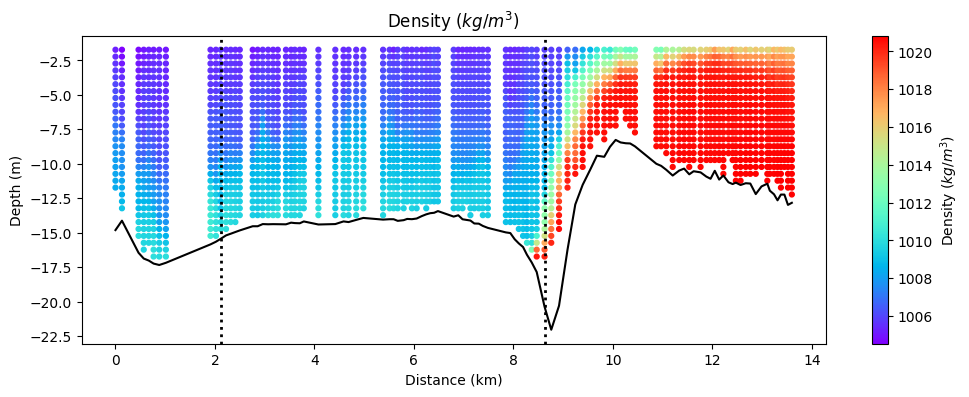

In [22]:
fig, ax = plt.subplots(figsize=(12, 4))
cb = ax.scatter(mtx_tj[:, 1], -mtx_tj[:, 2], s=12, c=mtx_tj[:, 5], cmap='rainbow')
plot_sets(ax)
ax.set_title('Density $(kg/m^3)$')

# --- To add the pycnocline  ---
#ax.scatter(distancias, -smoothed_depths,
           #color='k', s=30, marker='o', label='Pycnocline')

#ax.legend()
plt.colorbar(cb, ax=ax, label="Density $(kg/m^3)$")
plt.show()

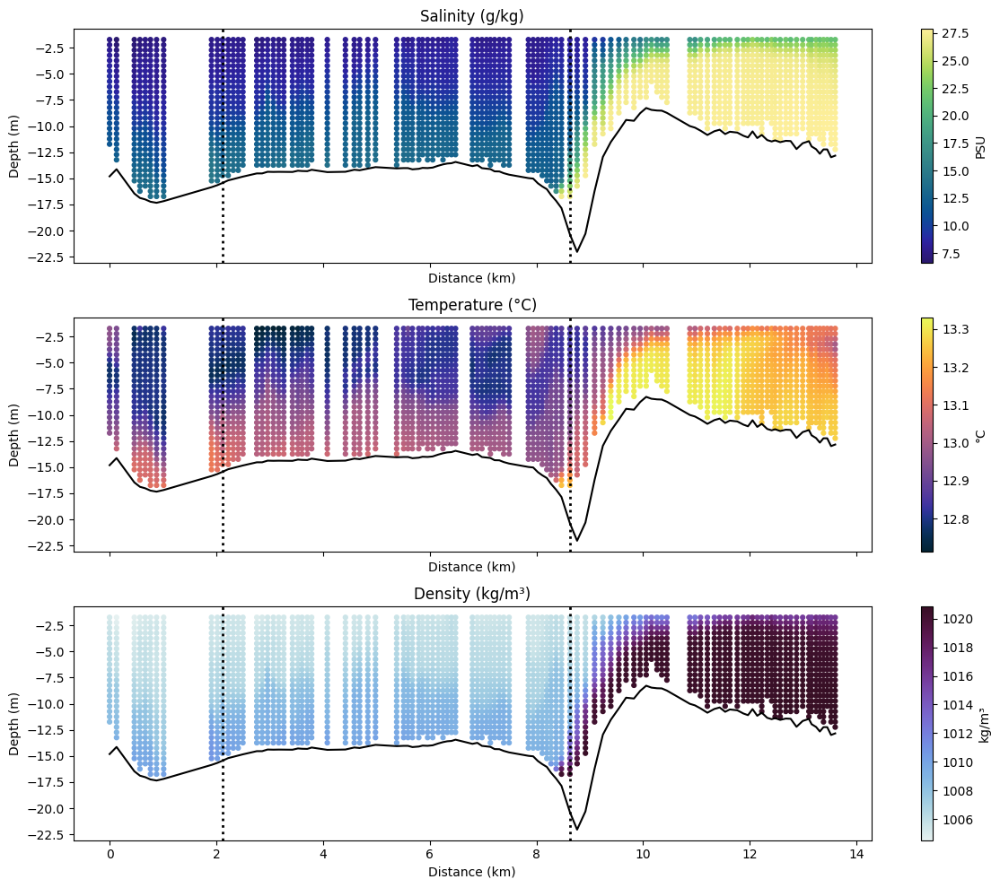

In [23]:
# --- CODE TO PLOT SALINITY, TEMPERATURE AND DENSITY and #add pycnocline ---

fig, axs = plt.subplots(3, 1, figsize=(12, 10), sharex=True)

# === SALINITY ===
cb = axs[0].scatter(mtx_tj[:,1], -mtx_tj[:,2], s=12, c=mtx_tj[:,3], cmap=cmocean.cm.haline)
#axs[0].scatter(distancias, -smoothed_depths, color='k', s=30, marker='o', label='pycnocline') # to add the pycnocline
plot_sets(axs[0])
axs[0].set_title('Salinity (g/kg)')
axs[0].set_ylabel('Depth (m)')
#axs[0].legend()
fig.colorbar(cb, ax=axs[0], label='PSU')

# === TEMPERATURE ===
cb = axs[1].scatter(mtx_tj[:,1], -mtx_tj[:,2], s=12, c=mtx_tj[:,4], cmap=cmocean.cm.thermal)
#axs[1].scatter(distancias, -smoothed_depths, color='k', s=30, marker='o', label='pycnocline') # to add the pycnocline
plot_sets(axs[1])
axs[1].set_title('Temperature (°C)')
axs[1].set_ylabel('Depth (m)')
#axs[1].legend()
fig.colorbar(cb, ax=axs[1], label='°C')

# === DENSITY ===
cb = axs[2].scatter(mtx_tj[:,1], -mtx_tj[:,2], s=12, c=mtx_tj[:,5], cmap=cmocean.cm.dense)
#axs[2].scatter(distancias, -smoothed_depths, color='k', s=30, marker='o', label='pycnocline') # to add the pycnocline
plot_sets(axs[2])
axs[2].set_title('Density (kg/m³)')
axs[2].set_ylabel('Depth (m)')
axs[2].set_xlabel('Distance (km)')
#axs[2].legend()
fig.colorbar(cb, ax=axs[2], label='kg/m³')

plt.tight_layout()
plt.savefig(os.path.join(output_image,'drift_sal_temp_rho_vs_distance.png'), dpi=300, bbox_inches='tight')
plt.show()

## Rotating the velocity:

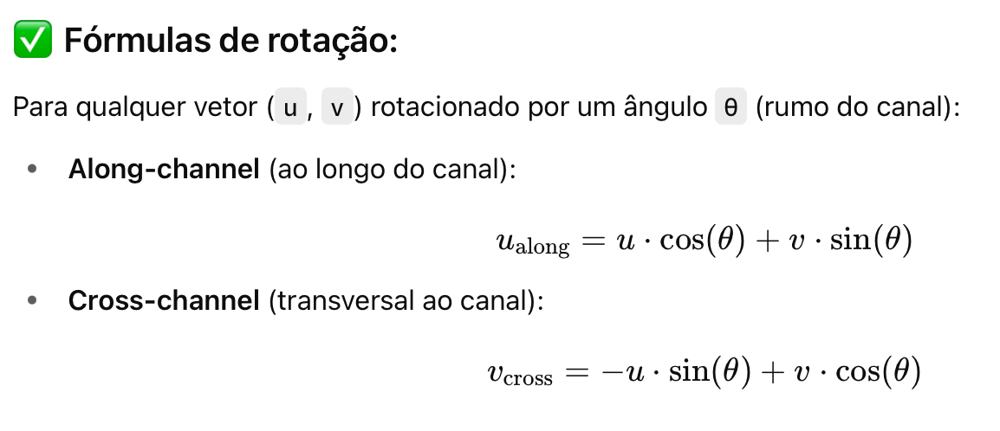

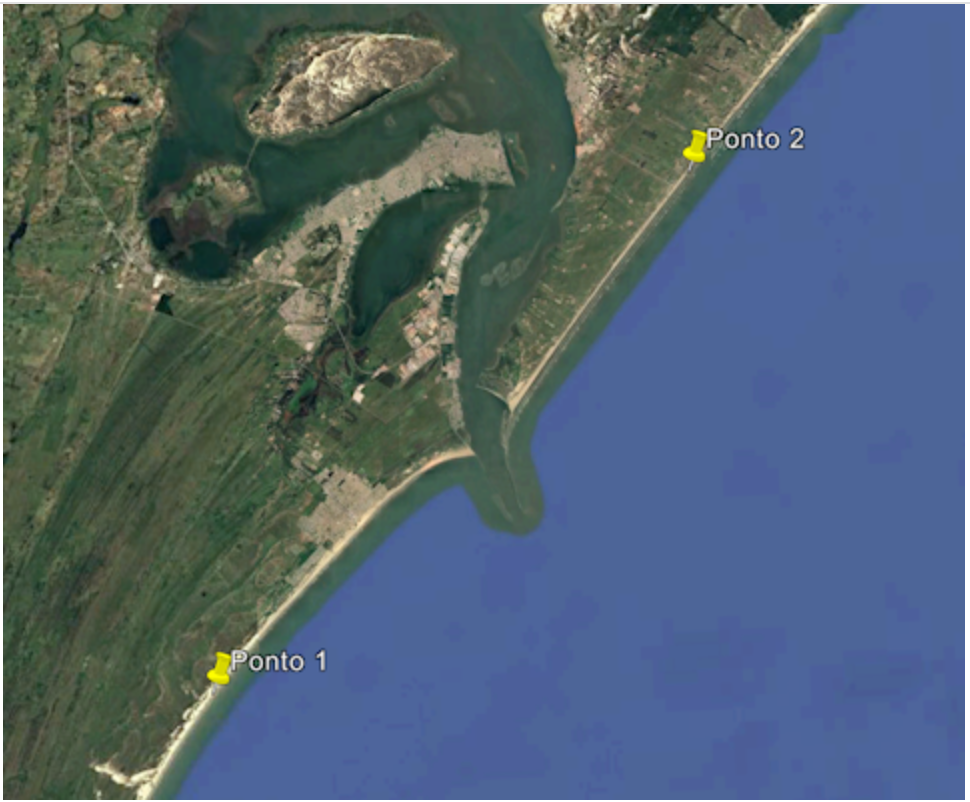

### Choosing cordinates to split the drift data to rotate velocity

In [24]:
# coast line orientation, according to Google Earth
lcy1, lcx1 = -32.263665,  -52.238579
lcy2, lcx2 = -32.065169,  -52.000130

lcdy = lcy2 - lcy1
lcdx = lcx2 - lcx1

theta_lc = 90 - np.arctan(lcdy/lcdx) * 180/np.pi
print(f'{theta_lc:.1f}')

50.2


In [25]:

lon = hdr[:,1]
lat = hdr[:,2]

px1, py1 = lon[10], lat[10]
px2, py2 = lon[30], lat[30]
px3, py3 = lon[62], lat[62]


(np.float64(-52.101970413000004),
 np.float64(-52.067274587),
 np.float64(-32.23783293444674),
 np.float64(-32.111525116618466))

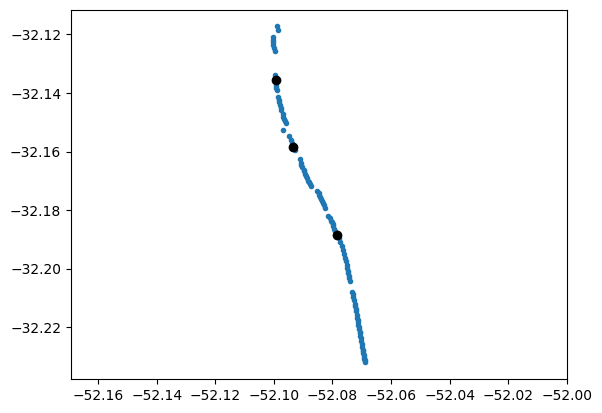

In [26]:
plt.plot(lon, lat, '.')
plt.plot(px1, py1, 'ko')
plt.plot(px2, py2, 'ko')
plt.plot(px3, py3, 'ko')
plt.axis('equal')

In [27]:
theta1 = np.arctan((py2 - py1)/(px2 - px1)) * 180/np.pi +90
theta2 = np.arctan((py3 - py2)/(px3 - px2)) * 180/np.pi +90

print(f'{theta1:.0f}')
print(f'{theta2:.0f}')

15
26


U and V are still geographic coordenates (zonal/meridional) and I want to obtain u_along, which means the along channel-velocity.

So the channel axis must be separated in 4 sections:
  

**SECTION 1 (index from 0 to 10): direction of the channel = 0° (north → south)**  
**SECTION 2 (index from 10 to 30): direction of the channel + theta1 = 15°**  
**SECTION 3 (index from 30 to 62): direction of the channel + theta2 = 26°**  
**SECTION 4 (index from 62 until the end): direction of the channel + theta_lc = 50.2°**

In [28]:
u = mtx_tj[:, 8]
v = mtx_tj[:, 9]
idx = mtx_tj[:, 0]
x = mtx_tj[:,1]
z = mtx_tj [:,2]

ur = np.copy(u)
vr = np.copy(v)

In [29]:
idx_1 = np.where((idx >= 10) & (idx < 30))[0]
idx_2 = np.where((idx >= 30) & (idx < 62))[0]
idx_3 = np.where(idx >= 62)[0]

ur[idx_1], vr[idx_1] = vt.vector_rotation(u[idx_1], v[idx_1], theta1)
ur[idx_2], vr[idx_2] = vt.vector_rotation(u[idx_2], v[idx_2], theta2)
ur[idx_3], vr[idx_3] = vt.vector_rotation(u[idx_3], v[idx_3], 30)

Here we check the rotation efect over the sectors of rotation:


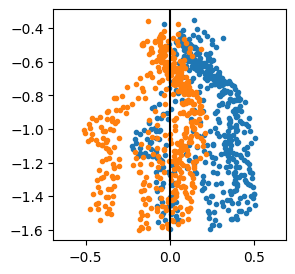

In [30]:
plt.figure(figsize=(3,3))
plt.plot(u[idx_1], v[idx_1], '.')
plt.plot(ur[idx_1], vr[idx_1], '.')
plt.axis('equal')
plt.axvline(0, color='k')
plt.show()

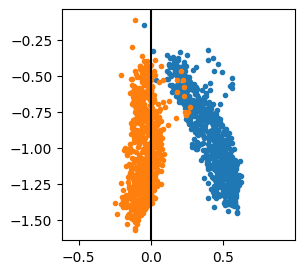

In [31]:
plt.figure(figsize=(3,3))
plt.plot(u[idx_2], v[idx_2], '.')
plt.plot(ur[idx_2], vr[idx_2], '.')
plt.axis('equal')
plt.axvline(0, color='k')
plt.show()

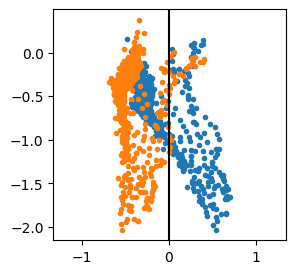

In [32]:
plt.figure(figsize=(3,3))
plt.plot(u[idx_3], v[idx_3], '.')
plt.plot(ur[idx_3], vr[idx_3], '.')
plt.axis('equal')
plt.axvline(0, color='k')
plt.show()

### Ploting without rotation

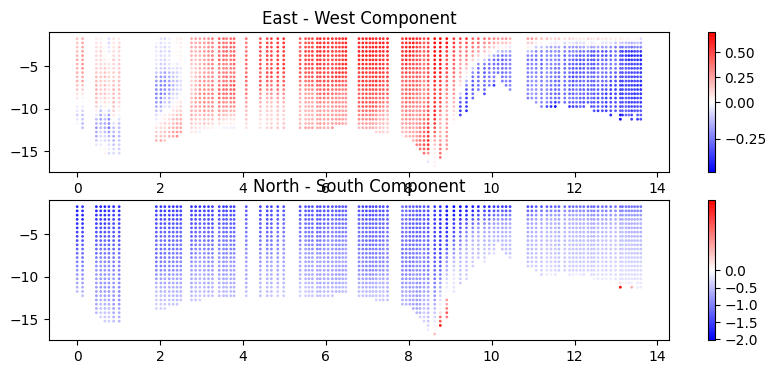

In [33]:
fig, axs = plt.subplots(2, figsize=(10,4))

norm_u = mcolors.TwoSlopeNorm(vmin=np.nanmin(u), vmax=np.nanmax(u), vcenter=0)
norm_v = mcolors.TwoSlopeNorm(vmin=np.nanmin(v), vmax=np.nanmax(v), vcenter=0)

cb1 = axs[0].scatter(x, -z, 1, c=u, cmap='bwr', norm=norm_u)
cb2 = axs[1].scatter(x, -z, 1, c=v, cmap='bwr', norm=norm_v)

axs[0].set_title('East - West Component')
axs[1].set_title('North - South Component')

fig.colorbar(cb1)
fig.colorbar(cb2)

### Ploting with rotation

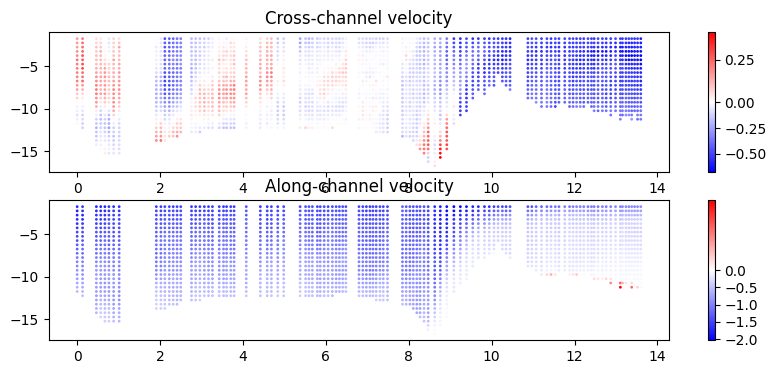

In [34]:
fig, axs = plt.subplots(2, figsize=(10,4))

norm_u = mcolors.TwoSlopeNorm(vmin=np.nanmin(ur), vmax=np.nanmax(ur), vcenter=0)
norm_v = mcolors.TwoSlopeNorm(vmin=np.nanmin(vr), vmax=np.nanmax(vr), vcenter=0)

cb1 = axs[0].scatter(x, -z, 1, c=ur, cmap='bwr', norm=norm_u)
cb2 = axs[1].scatter(x, -z, 1, c=vr, cmap='bwr', norm=norm_v)

axs[0].set_title('Cross-channel velocity')
axs[1].set_title('Along-channel velocity')

fig.colorbar(cb1)
fig.colorbar(cb2)

In [35]:
junta_veloc = [x, z, vr, ur]
#junta_veloc_along = [x, z, vr]

# Save the pickle on the right folder:
with open(os.path.join(output_data, 'Rotated_velocity.pkl'), 'wb') as io:
        pickle.dump(junta_veloc , io)

#with open(os.path.join(output_data, 'Corrente_longitudina.pkl'), 'wb') as io:
#        pickle.dump(junta_veloc , io)

# Save the pickle on the right folder:
#with open(os.path.join(output_dir, 'picnoclina_debora.pkl'), 'wb') as io:
 #       pickle.dump(smoothed_depths, io)

## Ploting the calculated variables:

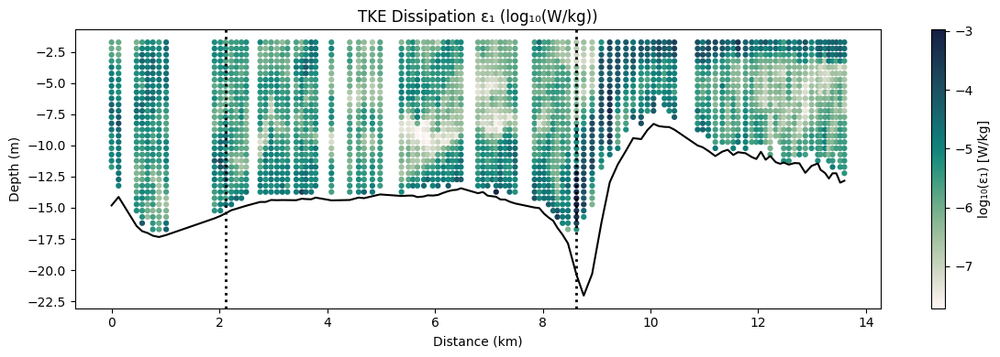

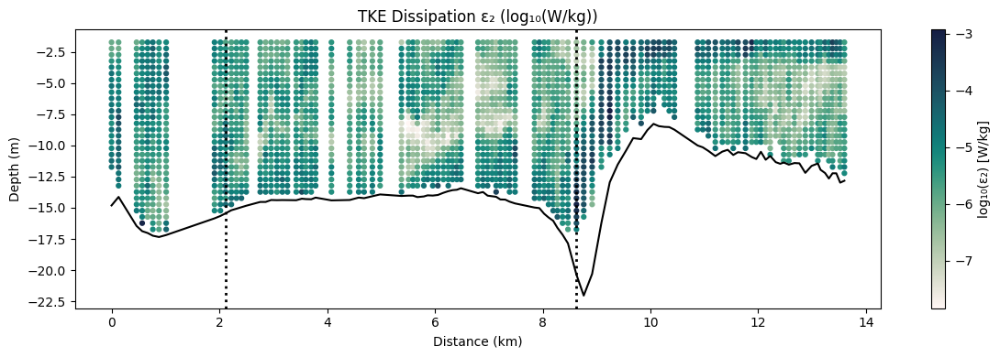

In [36]:
# === Dissipation ε₁ ===
fig, ax = plt.subplots(figsize=(12, 4))
cb = ax.scatter(mtx_tj[:,1], -mtx_tj[:,2], s=12, 
                c=np.log10(mtx_tj[:,6]), cmap=cmocean.cm.tempo)

plot_sets(ax)  # não deve conter plt.colorbar()
ax.set_title('TKE Dissipation ε₁ (log₁₀(W/kg))')
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Depth (m)')

cbar = fig.colorbar(cb, ax=ax)
cbar.set_label('log₁₀(ε₁) [W/kg]')

plt.tight_layout()
#plt.savefig(os.path.join(output_image,'drift_epsilon1_vs_distance.png'), dpi=300, bbox_inches='tight')
plt.show()

# === Dissipation ε₂ ===
fig, ax = plt.subplots(figsize=(12, 4))
cb = ax.scatter(mtx_tj[:,1], -mtx_tj[:,2], s=12, 
                c=np.log10(mtx_tj[:,7]), cmap=cmocean.cm.tempo)

plot_sets(ax)
ax.set_title('TKE Dissipation ε₂ (log₁₀(W/kg))')
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Depth (m)')

cbar = fig.colorbar(cb, ax=ax)
cbar.set_label('log₁₀(ε₂) [W/kg]')

plt.tight_layout()
#plt.savefig(os.path.join(output_image,'drift_epsilon2_vs_distance.png'), dpi=300, bbox_inches='tight')
plt.show()


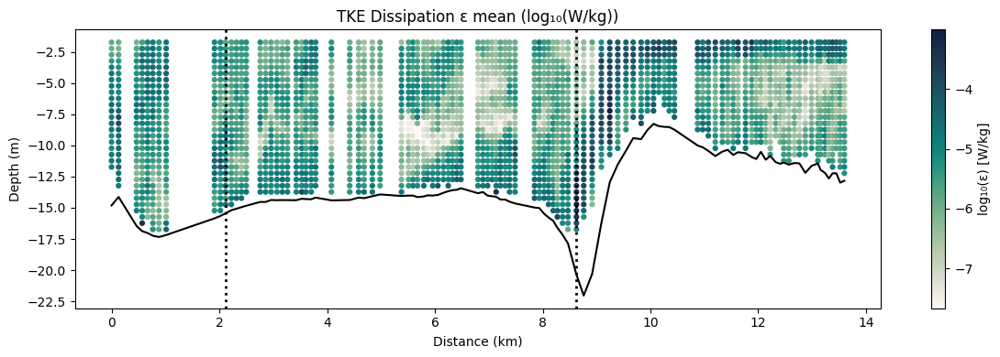

In [37]:
epsilon = (mtx_tj[:,6] + mtx_tj[:,7]) / 2

fig, ax = plt.subplots(figsize=(12, 4))
cb = ax.scatter(mtx_tj[:,1], -mtx_tj[:,2], s=12, 
                c=np.log10(epsilon), cmap=cmocean.cm.tempo)

# Adding pycnocline to the plot:
#ax.scatter(distancias, -smoothed_depths, color='k', s=30, marker='.', label='Picnoclina')


plot_sets(ax)
ax.set_title('TKE Dissipation ε mean (log₁₀(W/kg))')
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Depth (m)')

cbar = fig.colorbar(cb, ax=ax)
cbar.set_label('log₁₀(ε) [W/kg]')

plt.tight_layout()
plt.savefig(os.path.join(output_image,'drift_epsilonmean_vs_distance.png'), dpi=300, bbox_inches='tight')
plt.show()


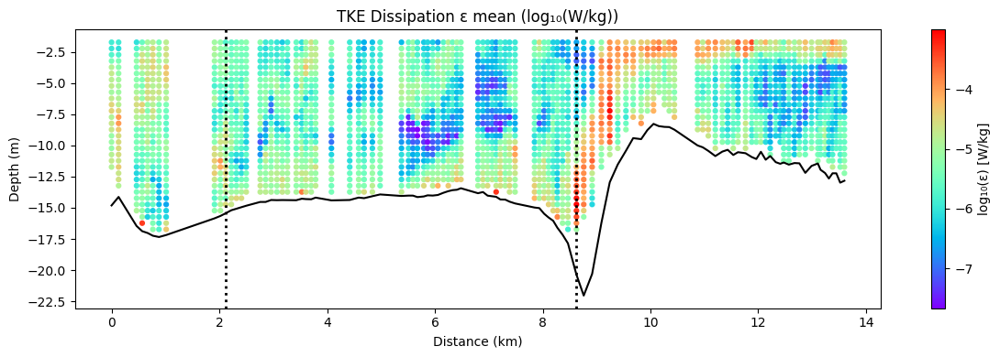

In [38]:
# Highlighting the effects with rainbow view
epsilon = (mtx_tj[:,6] + mtx_tj[:,7]) / 2

fig, ax = plt.subplots(figsize=(12, 4))
cb = ax.scatter(mtx_tj[:,1], -mtx_tj[:,2], s=12, 
                c=np.log10(epsilon), cmap='rainbow')

plot_sets(ax)
ax.set_title('TKE Dissipation ε mean (log₁₀(W/kg))')
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Depth (m)')

cbar = fig.colorbar(cb, ax=ax)
cbar.set_label('log₁₀(ε) [W/kg]')

plt.tight_layout()
#plt.savefig(os.path.join(output_image,'drift_epsilonmean_vs_distance_rainbow.png'), dpi=300, bbox_inches='tight')
plt.show()


/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_83378/3252235063.py:5: RuntimeWarning: invalid value encountered in log10
  c=np.log10(mtx_tj_calc[:,2]), cmap=cmocean.cm.thermal)
/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_83378/3252235063.py:24: RuntimeWarning: invalid value encountered in log10
  c=np.log10(mtx_tj_calc[:,4]/0.25), cmap='bwr', norm=norm)
/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_83378/3252235063.py:32: RuntimeWarning: invalid value encountered in log10
  c=np.log10(mtx_tj_calc[:,6]), cmap=cmocean.cm.amp)


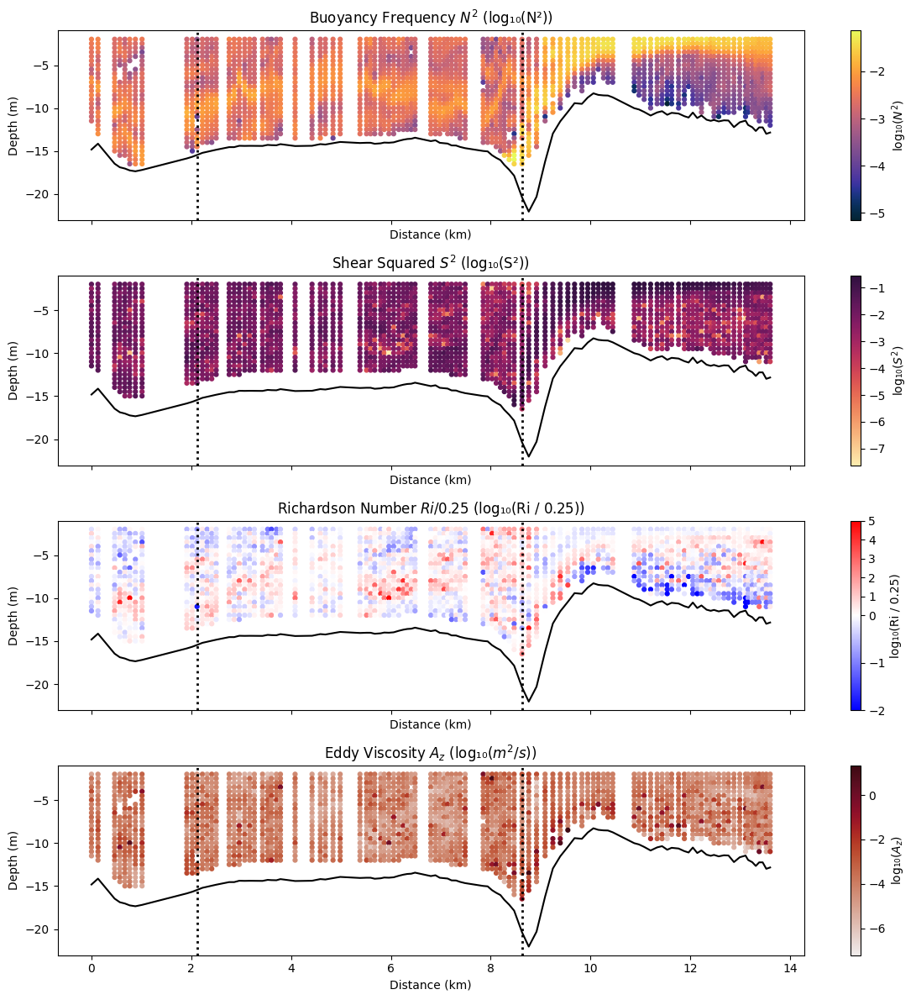

In [39]:

fig, axs = plt.subplots(4, 1, figsize=(12, 12), sharex=True)

# === Buoyancy Frequency (N²) ===
cb = axs[0].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12,
                    c=np.log10(mtx_tj_calc[:,2]), cmap=cmocean.cm.thermal)
plot_sets(axs[0])
axs[0].set_title('Buoyancy Frequency $N^2$ (log₁₀(N²))')
axs[0].set_ylabel('Depth (m)')
fig.colorbar(cb, ax=axs[0], label='log₁₀($N^2$)')

# === Squared Shear (S²) ===
cb = axs[1].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12,
                    c=np.log10(mtx_tj_calc[:,3]), cmap=cmocean.cm.matter)
plot_sets(axs[1])
axs[1].set_title('Shear Squared $S^2$ (log₁₀(S²))')
axs[1].set_ylabel('Depth (m)')
fig.colorbar(cb, ax=axs[1], label='log₁₀($S^2$)')

# === Ri / 0.25 ===
vmin = -2
vmax = 5
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
cb = axs[2].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12,
                    c=np.log10(mtx_tj_calc[:,4]/0.25), cmap='bwr', norm=norm)
plot_sets(axs[2])
axs[2].set_title('Richardson Number $Ri/0.25$ (log₁₀(Ri / 0.25))')
axs[2].set_ylabel('Depth (m)')
fig.colorbar(cb, ax=axs[2], label='log₁₀(Ri / 0.25)')

# === Eddy Viscosity (A_z) ===
cb = axs[3].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12,
                    c=np.log10(mtx_tj_calc[:,6]), cmap=cmocean.cm.amp)
plot_sets(axs[3])
axs[3].set_title('Eddy Viscosity $A_z$ (log₁₀($m^2/s$))')
axs[3].set_ylabel('Depth (m)')
axs[3].set_xlabel('Distance (km)')
fig.colorbar(cb, ax=axs[3], label='log₁₀($A_z$)')

plt.tight_layout()
plt.savefig(os.path.join(output_image,'Drift_N_S_Ri_Az_calc_vs_distance.png'), dpi=300, bbox_inches='tight')
plt.show()


## Calculating Maximum and Minimun values of the variables: 

In [40]:
# Create a dictionary to make the loop easier: 
variables = {
    "Salinity": mtx_tj[:,3],
    "Temperature": mtx_tj[:,4],
    "Density": mtx_tj[:,5],
    "TKE": epsilon,
    "N2": mtx_tj_calc[:,2],
    "S2": mtx_tj_calc[:,3],
    "Ri": mtx_tj_calc[:,4],
    "Az": mtx_tj_calc[:,6],
    "Cross-channel velocity": ur,
    "Along-channel velocity": vr,
}

# Loop to print min and max of each variable:
for name, data in variables.items():
    max_value = max(data)
    min_value = min(data)
    mean_value = np.nanmean(data) # Calculate mean value, ignoring NaNs 
    print(f"{name} -> Mean: {mean_value:.3f}, Maximum: {max_value:.3f}, Minimum: {min_value:.3f}")


Salinity -> Mean: 15.120, Maximum: 27.868, Minimum: 6.644
Temperature -> Mean: 12.993, Maximum: 13.330, Minimum: 12.713
Density -> Mean: 1011.049, Maximum: 1020.826, Minimum: 1004.529
TKE -> Mean: 0.000, Maximum: 0.001, Minimum: 0.000
N2 -> Mean: 0.005, Maximum: 0.073, Minimum: -0.002
S2 -> Mean: 0.019, Maximum: 0.285, Minimum: 0.000
Ri -> Mean: 95.049, Maximum: 121735.652, Minimum: -0.336
Az -> Mean: 0.034, Maximum: 21.284, Minimum: -0.154
Cross-channel velocity -> Mean: -0.173, Maximum: 0.410, Minimum: -0.681
Along-channel velocity -> Mean: -0.831, Maximum: 0.378, Minimum: -2.033


### Calculating Maximum and Minimun **INSIDE X OUTSIDE Estuary**:

In [43]:
print ("Variables INSIDE estuary (Upstream):")
print (" ")
for name, data in variables.items():
    print(f"{name} -> Mean: {np.nanmean(data[:63]):.3f}, Max: {max(data[:63]):.3f}, Min: {min(data[:63]):.3f}")

print (" ")
print ("______________________________________________")
print (" ")

print ("Variables OUTSIDE estuary (Downstream):")
print (" ")
for name, data in variables.items():
    print(f"{name} -> Mean: {np.nanmean(data[63:]):.3f}, Max: {max(data[63:]):.3f}, Min: {min(data[63:]):.3f}")


Variables INSIDE estuary (Upstream):
 
Salinity -> Mean: 9.234, Max: 12.654, Min: 6.644
Temperature -> Mean: 12.863, Max: 13.056, Min: 12.751
Density -> Mean: 1006.536, Max: 1009.140, Min: 1004.529
TKE -> Mean: 0.000, Max: 0.000, Min: 0.000
N2 -> Mean: 0.004, Max: 0.011, Min: 0.001
S2 -> Mean: 0.017, Max: 0.051, Min: 0.000
Ri -> Mean: 0.679, Max: 14.328, Min: 0.040
Az -> Mean: 0.001, Max: 0.010, Min: 0.000
Cross-channel velocity -> Mean: 0.122, Max: 0.290, Min: -0.129
Along-channel velocity -> Mean: -1.208, Max: -0.495, Min: -1.775
 
______________________________________________
 
Variables OUTSIDE estuary (Downstream):
 
Salinity -> Mean: 15.279, Max: 27.868, Min: 7.110
Temperature -> Mean: 12.996, Max: 13.330, Min: 12.713
Density -> Mean: 1011.171, Max: 1020.826, Min: 1004.919
TKE -> Mean: 0.000, Max: 0.001, Min: 0.000
N2 -> Mean: 0.005, Max: 0.073, Min: -0.002
S2 -> Mean: 0.019, Max: 0.285, Min: 0.000
Ri -> Mean: 97.839, Max: 121735.652, Min: -0.336
Az -> Mean: 0.035, Max: 21.284, 

<span style="color:red">This code was last tested on February 24, 2026, and is running without issues.</span>


## END OF CODE

In [56]:
# Selecting variables up to cast 62 (índex included) for INSIDE data and
# Selecting variables from cast 63 (including 63) for OUTSIDE data

# Variables in
variable1i = mtx_tj[:63,3]    # salinity
variable2i = mtx_tj[:63,4]    # temperature
variable3i = mtx_tj[:63,5]    # density

# Variables out
variable1o = mtx_tj[63:,3]    # salinity
variable2o = mtx_tj[63:,4]    # temperature
variable3o = mtx_tj[63:,5]    # density

# Create a dictionary to make the loop easier: 
variablesin= {
    "Salinity(in)": variable1i,
    "Temperature(in)": variable2i,
    "Density(in)": variable3i,
    "Along-channel velocity(in)": vr[:63],
    "Cross-channel velocity(in)": ur[:63],
}

    
variablesout= {
    "Salinity(out)": variable1o,
    "Temperature(out)": variable2o,
    "Density(out)": variable3o
}

print ("Variables INSIDE estuary (Upstream):")
for name, data in variablesin.items():
    print(f"{name} -> Mean: {np.nanmean(data):.3f}, Max: {max(data):.3f}, Min: {min(data):.3f}")

print (" ")
print ("Variables OUTSIDE estuary (Downstream):")
for name, data in variablesout.items():
    print(f"{name} -> Mean: {np.nanmean(data):.3f}, Max: {max(data):.3f}, Min: {min(data):.3f}")


Variables INSIDE estuary:
Salinity(in) -> Mean: 9.234, Max: 12.654, Min: 6.644
Temperature(in) -> Mean: 12.863, Max: 13.056, Min: 12.751
Density(in) -> Mean: 1006.536, Max: 1009.140, Min: 1004.529
Along-channel velocity(in) -> Mean: -0.820, Max: 0.378, Min: -2.033
Cross-channel velocity(in) -> Mean: -0.181, Max: 0.410, Min: -0.681
 
Variables OUTSIDE estuary:
Salinity(out) -> Mean: 15.279, Max: 27.868, Min: 7.110
Temperature(out) -> Mean: 12.996, Max: 13.330, Min: 12.713
Density(out) -> Mean: 1011.171, Max: 1020.826, Min: 1004.919


In [59]:
# Variáveis
variavel6 = epsilon    # ε ou TKE
variavel7 = (mtx_tj_calc[:,2])    # N2
variavel8 = (mtx_tj_calc[:,3])   # S2
variavel9 = (mtx_tj_calc[:,4])    # Ri
variavel10 = (mtx_tj_calc[:,6])    # TKE

# Cria um dicionário para facilitar o loop
variaveis = {
    "TKE": variavel6,
    "N2": variavel7,
    "S2": variavel8,
    "Ri": variavel9,
    "Az": variavel10,
}

# Loop para imprimir min e max de cada uma
for nome, dados in variaveis.items():
    valor_max = max(dados)
    valor_min = min(dados)
    print(f"{nome} -> Máximo: {valor_max:.3f}, Mínimo: {valor_min:.3f}")


NameError: name 'epsilon' is not defined

In [58]:
### pedindo valores com logaritmo como resposta::

# Variáveis
variavel6  = epsilon              # ε ou TKE
variavel7  = mtx_tj_calc[:,2]     # N²
variavel8  = mtx_tj_calc[:,3]     # S²
variavel9  = mtx_tj_calc[:,4]     # Ri
variavel10 = mtx_tj_calc[:,6]     # Az

variaveis = {
    "TKE": variavel6,
    "N2": variavel7,
    "S2": variavel8,
    "Ri": variavel9,
    "Az": variavel10,
}

for nome, dados in variaveis.items():
    arr = np.asarray(dados, dtype=float)

    # mantém só valores positivos e finitos
    arr_pos = arr[np.isfinite(arr) & (arr > 0)]

    if arr_pos.size > 0:
        valor_mean = np.nanmean(arr_pos)
        valor_max = np.max(arr_pos)
        valor_min = np.min(arr_pos)
        print(f"{nome} -> log10(Mean): {np.log10(valor_mean):.3f}, log10(Máx): {np.log10(valor_max):.3f}, log10(Mín): {np.log10(valor_min):.3f}")
    else:
        print(f"{nome} -> sem valores positivos para calcular log10")

#Média: {np.nanmean(dados):.3f},Máximo: {valor_max:.3f}, Mínimo: {valor_min:.3f}")


TKE -> log10(Mean): -4.837, log10(Máx): -3.003, log10(Mín): -7.667
N2 -> log10(Mean): -2.298, log10(Máx): -1.136, log10(Mín): -5.156
S2 -> log10(Mean): -1.725, log10(Máx): -0.546, log10(Mín): -7.622
Ri -> log10(Mean): 1.982, log10(Máx): 5.085, log10(Mín): -3.063
Az -> log10(Mean): -1.463, log10(Máx): 1.328, log10(Mín): -7.214


Calculo maximo e minimo outras variaveis **dentro de barra**:

In [59]:
# Variáveis
variavel6 = epsilon [:63]   # # ε ou TKE
variavel7 = (mtx_tj_calc[:63,2])    # N2
variavel8 = (mtx_tj_calc[:63,3])   # S2
variavel9 = (mtx_tj_calc[:63,4])    # Ri
variavel10 = (mtx_tj_calc[:63,6])    # Az

# Cria um dicionário para facilitar o loop
variaveis = {
    "TKE": variavel6,
    "N2": variavel7,
    "S2": variavel8,
    "Ri": variavel9,
    "Az": variavel10,
}

# Loop para imprimir min e max de cada uma
for nome, dados in variaveis.items():
    valor_max = max(dados)
    valor_min = min(dados)
    print(f"{nome} -> Máximo: {valor_max:.3f}, Mínimo: {valor_min:.3f}")


TKE -> Máximo: 0.000, Mínimo: 0.000
N2 -> Máximo: 0.011, Mínimo: 0.001
S2 -> Máximo: 0.051, Mínimo: 0.000
Ri -> Máximo: 14.328, Mínimo: 0.040
Az -> Máximo: 0.010, Mínimo: 0.000


In [60]:
# Variáveis
variavel6 = epsilon [:63]   # # ε ou TKE
variavel7 = (mtx_tj_calc[:63,2])    # N2
variavel8 = (mtx_tj_calc[:63,3])   # S2
variavel9 = (mtx_tj_calc[:63,4])    # Ri
variavel10 = (mtx_tj_calc[:63,6])    # Az

# Cria um dicionário para facilitar o loop
variaveis = {
    "TKE": variavel6,
    "N2": variavel7,
    "S2": variavel8,
    "Ri": variavel9,
    "Az": variavel10,
}

# Loop para imprimir min e max de cada uma
for nome, dados in variaveis.items():
    arr = np.asarray(dados, dtype=float)

    # mantém só valores positivos e finitos
    arr_pos = arr[np.isfinite(arr) & (arr > 0)]

    if arr_pos.size > 0:
        valor_mean = np.nanmean(arr_pos)
        valor_max = np.max(arr_pos)
        valor_min = np.min(arr_pos)
        print(f"{nome} -> log10(Mean): {np.log10(valor_mean):.3f}, log10(Máx): {np.log10(valor_max):.3f}, log10(Mín): {np.log10(valor_min):.3f}")
    else:
        print(f"{nome} -> sem valores positivos para calcular log10")


TKE -> log10(Mean): -4.775, log10(Máx): -3.974, log10(Mín): -6.064
N2 -> log10(Mean): -2.453, log10(Máx): -1.955, log10(Mín): -3.054
S2 -> log10(Mean): -1.760, log10(Máx): -1.292, log10(Mín): -3.759
Ri -> log10(Mean): -0.168, log10(Máx): 1.156, log10(Mín): -1.397
Az -> log10(Mean): -3.249, log10(Máx): -1.992, log10(Mín): -5.119


Calculo maximo e minimo outras variaveis **fora de barra**:

In [61]:
# Variáveis
variavel6 = epsilon [63:]   # # ε ou TKE
variavel7 = (mtx_tj_calc[63:,2])    # N2
variavel8 = (mtx_tj_calc[63:,3])   # S2
variavel9 = (mtx_tj_calc[63:,4])    # Ri
variavel10 = (mtx_tj_calc[63:,6])    # Az

# Cria um dicionário para facilitar o loop
variaveis = {
    "TKE": variavel6,
    "N2": variavel7,
    "S2": variavel8,
    "Ri": variavel9,
    "Az": variavel10,
}

# Loop para imprimir min e max de cada uma
for nome, dados in variaveis.items():
    arr = np.asarray(dados, dtype=float)

    # mantém só valores positivos e finitos
    arr_pos = arr[np.isfinite(arr) & (arr > 0)]

    if arr_pos.size > 0:
        valor_mean = np.nanmean(arr_pos)
        valor_max = np.max(arr_pos)
        valor_min = np.min(arr_pos)
        print(f"{nome} -> log10(Mean): {np.log10(valor_mean):.3f}, log10(Máx): {np.log10(valor_max):.3f}, log10(Mín): {np.log10(valor_min):.3f}")
    else:
        print(f"{nome} -> sem valores positivos para calcular log10")


TKE -> log10(Mean): -4.839, log10(Máx): -3.003, log10(Mín): -7.667
N2 -> log10(Mean): -2.294, log10(Máx): -1.136, log10(Mín): -5.156
S2 -> log10(Mean): -1.724, log10(Máx): -0.546, log10(Mín): -7.622
Ri -> log10(Mean): 1.995, log10(Máx): 5.085, log10(Mín): -3.063
Az -> log10(Mean): -1.451, log10(Máx): 1.328, log10(Mín): -7.214


## END OF CODE

### pedindo valores com logaritmo como resposta::

# Variáveis
variavel6  = epsilon [63:]            # ε ou TKE
variavel7  = mtx_tj_calc[63:,2]     # N²
variavel8  = mtx_tj_calc[63:,3]     # S²
variavel9  = mtx_tj_calc[63:,4]     # Ri
variavel10 = mtx_tj_calc[63:,6]     # Az

variaveis = {
    "TKE": variavel6,
    "N2": variavel7,
    "S2": variavel8,
    "Ri": variavel9,
    "Az": variavel10,
}

for nome, dados in variaveis.items():
    arr = np.asarray(dados, dtype=float)

    # mantém só valores positivos e finitos
    arr_pos = arr[np.isfinite(arr) & (arr > 0)]

    if arr_pos.size > 0:
        valor_max = np.max(arr_pos)
        valor_min = np.min(arr_pos)
        print(f"{nome} -> log10(Máx): {np.log10(valor_max):.3f}, log10(Mín): {np.log10(valor_min):.3f}")
    else:
        print(f"{nome} -> sem valores positivos para calcular log10")

/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_28956/3828979622.py:6: RuntimeWarning: invalid value encountered in log10
  c=np.log10(mtx_tj_calc[:,2]), cmap=cmocean.cm.thermal)
/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_28956/3828979622.py:29: RuntimeWarning: invalid value encountered in log10
  c=np.log10(mtx_tj_calc[:,4]/0.25), cmap='bwr', norm=norm)
/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_28956/3828979622.py:39: RuntimeWarning: invalid value encountered in log10
  c=np.log10(mtx_tj_calc[:,6]), cmap='rainbow')


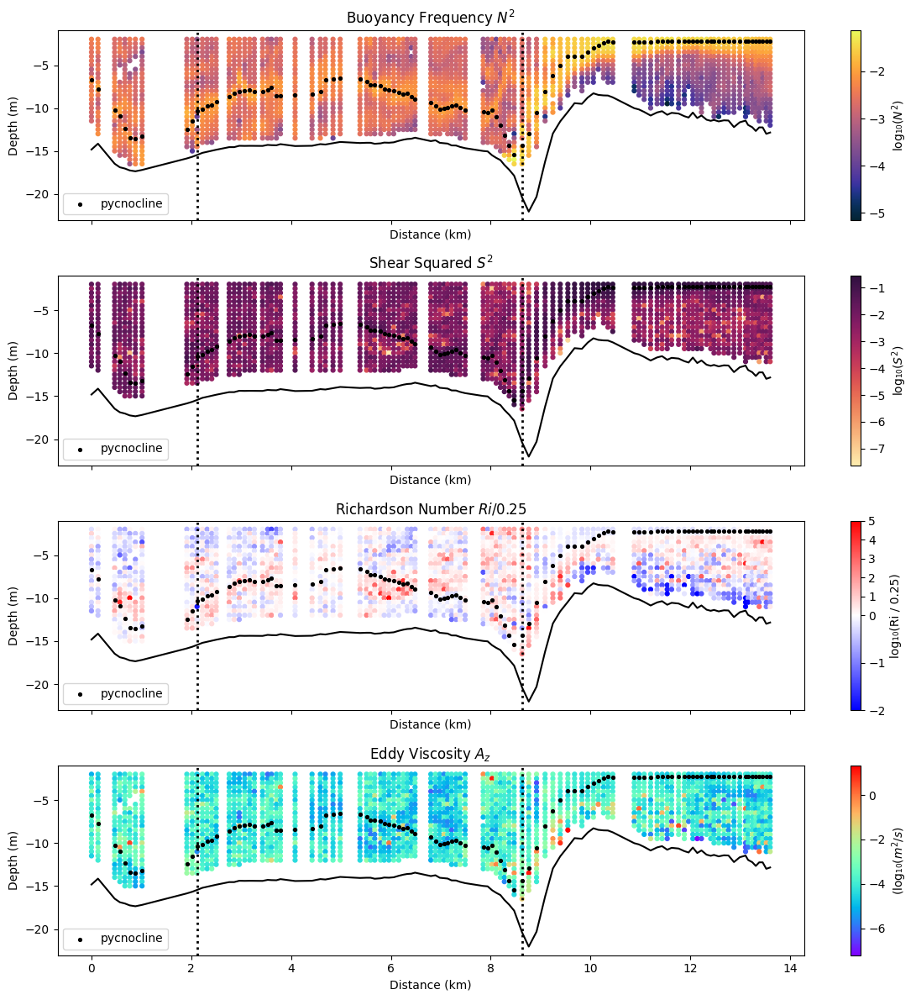

In [62]:

# --- SEU CÓDIGO ORIGINAL MODIFICADO PARA INCLUIR A PICNOCLINA ---
fig, axs = plt.subplots(4, 1, figsize=(12, 12), sharex=True)

# === Buoyancy Frequency (N²) ===
cb = axs[0].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12,
                     c=np.log10(mtx_tj_calc[:,2]), cmap=cmocean.cm.thermal)
axs[0].scatter(distancias, -smoothed_depths, color='k', s=30, marker='.', label='pycnocline') # Adicionando a picnoclina
plot_sets(axs[0])
axs[0].set_title('Buoyancy Frequency $N^2$')
axs[0].set_ylabel('Depth (m)')
axs[0].legend()
fig.colorbar(cb, ax=axs[0], label='log₁₀($N^2$)')

# === Squared Shear (S²) ===
cb = axs[1].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12,
                     c=np.log10(mtx_tj_calc[:,3]), cmap=cmocean.cm.matter)
axs[1].scatter(distancias, -smoothed_depths, color='k', s=30, marker='.', label='pycnocline') # Adicionando a picnoclina
plot_sets(axs[1])
axs[1].set_title('Shear Squared $S^2$')
axs[1].set_ylabel('Depth (m)')
axs[1].legend()
fig.colorbar(cb, ax=axs[1], label='log₁₀($S^2$)')

# === Ri / 0.25 ===
vmin = -2
vmax = 5
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
cb = axs[2].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12,
                     c=np.log10(mtx_tj_calc[:,4]/0.25), cmap='bwr', norm=norm)
axs[2].scatter(distancias, -smoothed_depths, color='k', s=30, marker='.', label='pycnocline') # Adicionando a picnoclina
plot_sets(axs[2])
axs[2].set_title('Richardson Number $Ri/0.25$')
axs[2].set_ylabel('Depth (m)')
axs[2].legend()
fig.colorbar(cb, ax=axs[2], label='log₁₀(Ri / 0.25)')

# === Eddy Viscosity (A_z) ===
cb = axs[3].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12,
                     c=np.log10(mtx_tj_calc[:,6]), cmap='rainbow')
axs[3].scatter(distancias, -smoothed_depths, color='k', s=30, marker='.', label='pycnocline') # Adicionando a picnoclina
plot_sets(axs[3])
axs[3].set_title('Eddy Viscosity $A_z$')
axs[3].set_ylabel('Depth (m)')
axs[3].set_xlabel('Distance (km)')
axs[3].legend()
fig.colorbar(cb, ax=axs[3], label='(log₁₀($m^2/s$)')

plt.tight_layout()
plt.savefig("/Users/deboragadelha/Jupyter/campo_18julho2022_paper/figuras/Drift_newcolor_N_S_Ri_Az_calc_vs_distance2.png", dpi=300)
plt.show()

/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_28956/2762481938.py:12: RuntimeWarning: invalid value encountered in log10
  c=np.log10(mtx_tj_calc[:,2]), cmap=cmocean.cm.thermal)
/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_28956/2762481938.py:45: RuntimeWarning: invalid value encountered in log10
  c=np.log10(mtx_tj_calc[:,4]/0.25), cmap='bwr', norm=norm)
/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_28956/2762481938.py:56: RuntimeWarning: invalid value encountered in log10
  c=np.log10(mtx_tj_calc[:,6]), cmap='rainbow')


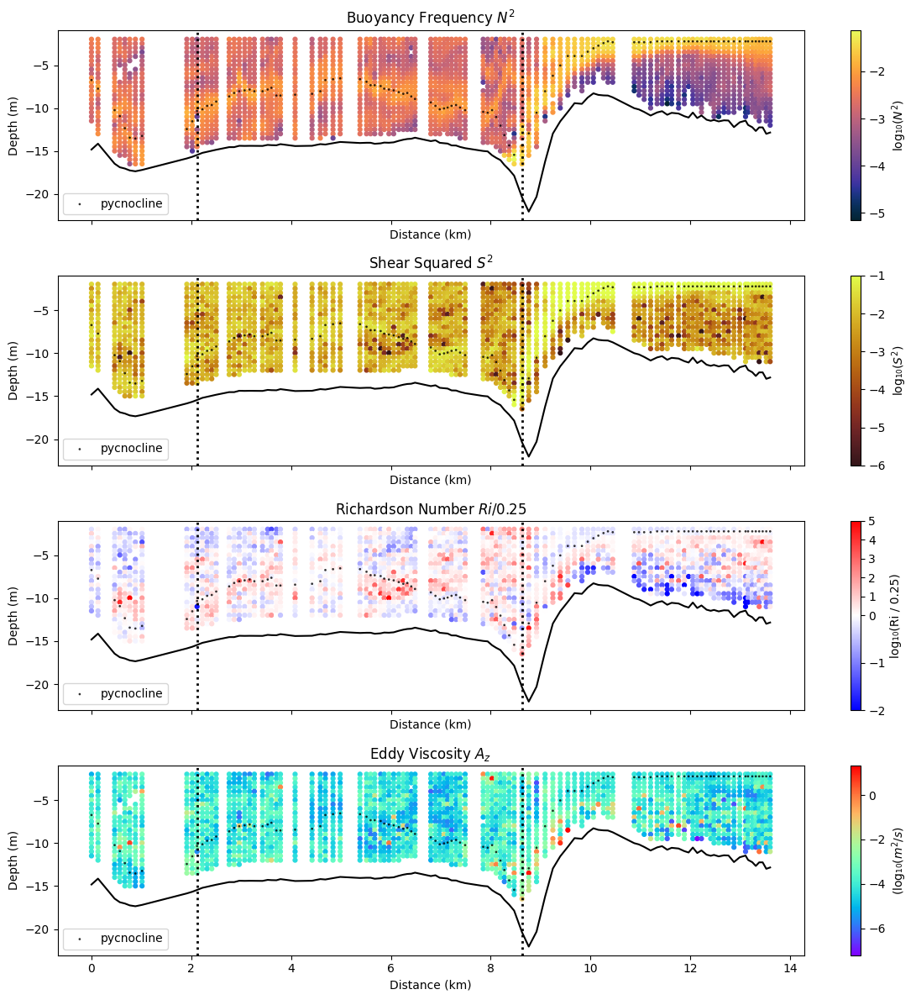

In [63]:

# --- PARÂMETROS PARA A PICNOCLINA MAIS DELICADA ---
picnoclina_s = 15
picnoclina_marker = '.'
picnoclina_alpha = 0.8
picnoclina_edgecolors = 'none'

# --- SEU CÓDIGO ORIGINAL MODIFICADO PARA INCLUIR A PICNOCLINA E AJUSTES DE COR ---
fig, axs = plt.subplots(4, 1, figsize=(12, 12), sharex=True)

# === Buoyancy Frequency (N²) === (sem alterações de cor)
cb = axs[0].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12,
                     c=np.log10(mtx_tj_calc[:,2]), cmap=cmocean.cm.thermal)
axs[0].scatter(distancias, -smoothed_depths, color='k', s=picnoclina_s, marker=picnoclina_marker,
               alpha=picnoclina_alpha, edgecolors=picnoclina_edgecolors, label='pycnocline')
plot_sets(axs[0])
axs[0].set_title('Buoyancy Frequency $N^2$')
axs[0].set_ylabel('Depth (m)')
axs[0].legend()
fig.colorbar(cb, ax=axs[0], label='log₁₀($N^2$)')

# === Squared Shear (S²) === AJUSTES AQUI
# Ajuste de vmin e vmax para "zoom" na parte mais clara/amarelada do colormap
# Experimente com diferentes valores para ver o que funciona melhor para seus dados.
# Você pode inspecionar os valores de np.log10(mtx_tj_calc[:,3]) para ter uma ideia.
shear_vmin = -6 # Exemplo: ajuste o limite inferior para ignorar valores muito baixos e escuros
shear_vmax = -1 # Exemplo: ajuste o limite superior para não saturar muito
shear_cmap = cmocean.cm.solar # Ou cmocean.cm.thermal, ou 'YlOrRd', 'Oranges'

cb = axs[1].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12,
                     c=np.log10(mtx_tj_calc[:,3]), cmap=shear_cmap,
                     vmin=shear_vmin, vmax=shear_vmax) # Aplicando os ajustes
axs[1].scatter(distancias, -smoothed_depths, color='k', s=picnoclina_s, marker=picnoclina_marker,
               alpha=picnoclina_alpha, edgecolors=picnoclina_edgecolors, label='pycnocline')
plot_sets(axs[1])
axs[1].set_title('Shear Squared $S^2$')
axs[1].set_ylabel('Depth (m)')
axs[1].legend()
fig.colorbar(cb, ax=axs[1], label='log₁₀($S^2$)')

# === Ri / 0.25 === (sem alterações de cor)
vmin = -2
vmax = 5
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
cb = axs[2].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12,
                     c=np.log10(mtx_tj_calc[:,4]/0.25), cmap='bwr', norm=norm)
axs[2].scatter(distancias, -smoothed_depths, color='k', s=picnoclina_s, marker=picnoclina_marker,
               alpha=picnoclina_alpha, edgecolors=picnoclina_edgecolors, label='pycnocline')
plot_sets(axs[2])
axs[2].set_title('Richardson Number $Ri/0.25$')
axs[2].set_ylabel('Depth (m)')
axs[2].legend()
fig.colorbar(cb, ax=axs[2], label='log₁₀(Ri / 0.25)')

# === Eddy Viscosity (A_z) === (sem alterações de cor)
cb = axs[3].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12,
                     c=np.log10(mtx_tj_calc[:,6]), cmap='rainbow')
axs[3].scatter(distancias, -smoothed_depths, color='k', s=picnoclina_s, marker=picnoclina_marker,
               alpha=picnoclina_alpha, edgecolors=picnoclina_edgecolors, label='pycnocline')
plot_sets(axs[3])
axs[3].set_title('Eddy Viscosity $A_z$')
axs[3].set_ylabel('Depth (m)')
axs[3].set_xlabel('Distance (km)')
axs[3].legend()
fig.colorbar(cb, ax=axs[3], label='(log₁₀($m^2/s$)')

plt.tight_layout()
plt.savefig("/Users/deboragadelha/Jupyter/campo_18julho2022_paper/figuras/Drift_newcolor_N_S_Ri_Az_calc_vs_distance3.png", dpi=300)
plt.show()

/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_28956/941377335.py:5: RuntimeWarning: invalid value encountered in log10
  c=np.log10(mtx_tj_calc[:,2]), cmap=cmocean.cm.thermal)
/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_28956/941377335.py:24: RuntimeWarning: invalid value encountered in log10
  c=np.log10(mtx_tj_calc[:,4]/0.25), cmap='bwr', norm=norm)
/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_28956/941377335.py:32: RuntimeWarning: invalid value encountered in log10
  c=np.log10(mtx_tj_calc[:,6]), cmap='rainbow')


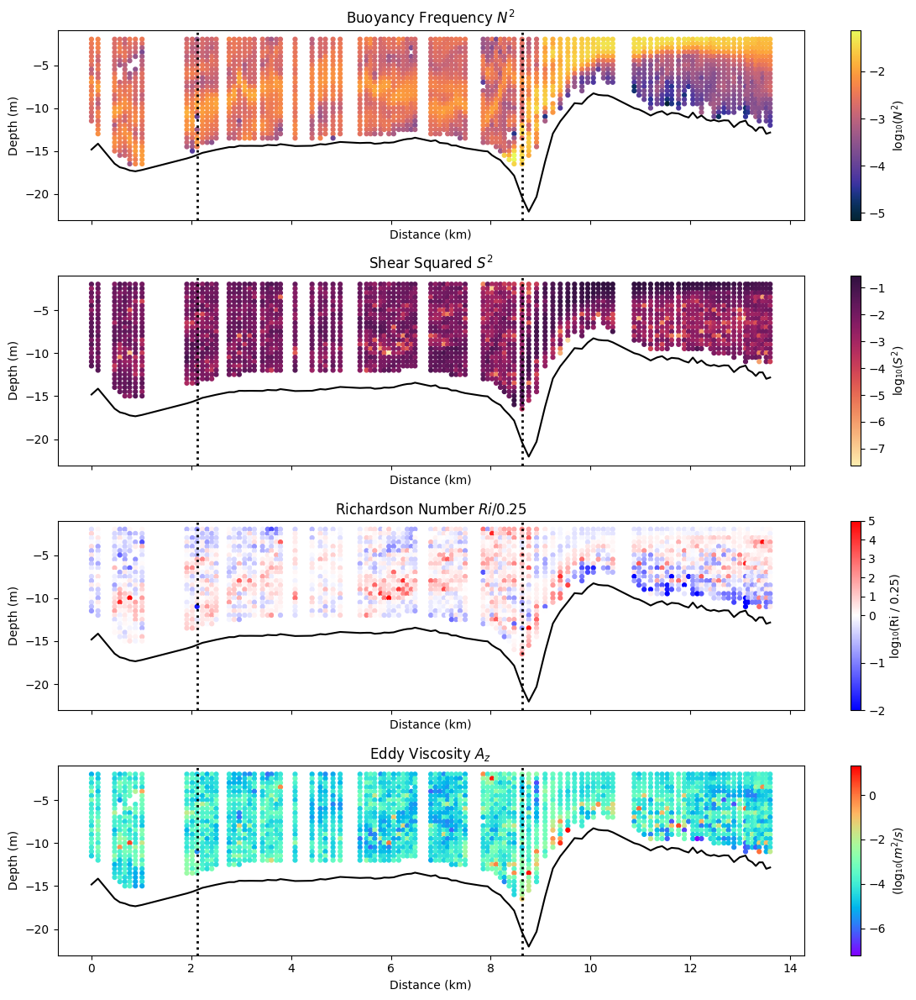

In [64]:

fig, axs = plt.subplots(4, 1, figsize=(12, 12), sharex=True)

# === Buoyancy Frequency (N²) ===
cb = axs[0].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12,
                    c=np.log10(mtx_tj_calc[:,2]), cmap=cmocean.cm.thermal)
plot_sets(axs[0])
axs[0].set_title('Buoyancy Frequency $N^2$')
axs[0].set_ylabel('Depth (m)')
fig.colorbar(cb, ax=axs[0], label='log₁₀($N^2$)')

# === Squared Shear (S²) ===
cb = axs[1].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12,
                    c=np.log10(mtx_tj_calc[:,3]), cmap=cmocean.cm.matter)
plot_sets(axs[1])
axs[1].set_title('Shear Squared $S^2$')
axs[1].set_ylabel('Depth (m)')
fig.colorbar(cb, ax=axs[1], label='log₁₀($S^2$)')

# === Ri / 0.25 ===
vmin = -2
vmax = 5
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
cb = axs[2].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12,
                    c=np.log10(mtx_tj_calc[:,4]/0.25), cmap='bwr', norm=norm)
plot_sets(axs[2])
axs[2].set_title('Richardson Number $Ri/0.25$')
axs[2].set_ylabel('Depth (m)')
fig.colorbar(cb, ax=axs[2], label='log₁₀(Ri / 0.25)')

# === Eddy Viscosity (A_z) ===
cb = axs[3].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12,
                    c=np.log10(mtx_tj_calc[:,6]), cmap='rainbow')
plot_sets(axs[3])
axs[3].set_title('Eddy Viscosity $A_z$')
axs[3].set_ylabel('Depth (m)')
axs[3].set_xlabel('Distance (km)')
fig.colorbar(cb, ax=axs[3], label='(log₁₀($m^2/s$)')

plt.tight_layout()
plt.savefig("/Users/deboragadelha/Jupyter/campo_18julho2022_paper/figuras/Drift_newcolor_N_S_Ri_Az_calc_vs_distance2.png", dpi=300)
plt.show()


### Calculando o número de Froud interno

In [65]:
import pandas as pd
import numpy as np
import pickle

# --- Densidade (CTD) ---
df_rho = pd.DataFrame({
    "dist_rho": mtx_tj[:, 1],   # km
    "z_rho": mtx_tj[:, 2],      # m
    "rho": mtx_tj[:, 5]         # kg/m³
})
df_rho["tipo"] = "densidade"

# --- Velocidade (ADCP ou modelo) ---
df_vel = pd.DataFrame({
    "x": x,         # km
    "z": z,         # m
    "v": vr         # m/s
})
df_vel["tipo"] = "velocidade"

# --- Concatenar em um único DataFrame (colunas diferentes => NaN onde não aplica) ---
df_all = pd.concat([df_rho, df_vel], ignore_index=True)

# --- Picnoclina suavizada (1 valor por perfil) ---
hpic = np.asarray(smoothed_depths)

# --- Salvar no pickle ---
pickle_filename = "dados_interesse.pkl"
with open(pickle_filename, "wb") as f:
    pickle.dump({"df_all": df_all, "hpic": hpic}, f)

print(f"Arquivo salvo: {pickle_filename}")
print("\nPrévia do DataFrame unificado:")
print(df_all.head(20))


Arquivo salvo: dados_interesse.pkl

Prévia do DataFrame unificado:
    dist_rho      z_rho          rho       tipo   x   z   v
0        0.0   1.732171  1005.172111  densidade NaN NaN NaN
1        0.0   2.232171  1005.393263  densidade NaN NaN NaN
2        0.0   2.732171  1005.577148  densidade NaN NaN NaN
3        0.0   3.232171  1005.747204  densidade NaN NaN NaN
4        0.0   3.732171  1005.880224  densidade NaN NaN NaN
5        0.0   4.232171  1006.014455  densidade NaN NaN NaN
6        0.0   4.732171  1006.167569  densidade NaN NaN NaN
7        0.0   5.232171  1006.282592  densidade NaN NaN NaN
8        0.0   5.732171  1006.329162  densidade NaN NaN NaN
9        0.0   6.232171  1006.393555  densidade NaN NaN NaN
10       0.0   6.732171  1006.681204  densidade NaN NaN NaN
11       0.0   7.232171  1007.060644  densidade NaN NaN NaN
12       0.0   7.732171  1007.278136  densidade NaN NaN NaN
13       0.0   8.232171  1007.475776  densidade NaN NaN NaN
14       0.0   8.732171  1007.737

In [66]:
import pandas as pd
import numpy as np
import pickle

# --- Densidade (CTD) ---
df_rho = pd.DataFrame({
    "dist": mtx_tj[:, 1],   # km
    "z":    mtx_tj[:, 2],   # m
    "rho":  mtx_tj[:, 5],   # kg/m³
})
df_rho["v"]    = np.nan
df_rho["tipo"] = "densidade"

# --- Velocidade (ADCP/modelo) ---
df_vel = pd.DataFrame({
    "dist": np.asarray(x),   # km
    "z":    np.asarray(z),   # m
    "v":    np.asarray(vr),  # m/s
})
df_vel["rho"]  = np.nan
df_vel["tipo"] = "velocidade"

# --- Unificar em UM DataFrame com colunas consistentes ---
df_all = pd.concat(
    [df_rho[["dist","z","rho","v","tipo"]],
     df_vel[["dist","z","rho","v","tipo"]]],
    ignore_index=True
)

# ordenar (opcional) — assim os dois tipos aparecem intercalados por distância
df_all = df_all.sort_values(["dist","tipo","z"]).reset_index(drop=True)

# --- Picnoclina (1 valor por perfil) ---
hpic = np.asarray(smoothed_depths)

# --- Salvar no pickle ---
with open("dados_interesse.pkl", "wb") as f:
    pickle.dump({"df_all": df_all, "hpic": hpic}, f)

print("Arquivo salvo: dados_interesse.pkl")

# --- Mostrar a tabela de forma útil ---
print("\nContagem por tipo:")
print(df_all["tipo"].value_counts())

print("\nPrévia (densidade):")
print(df_all[df_all["tipo"]=="densidade"].head(10))

print("\nPrévia (velocidade):")
print(df_all[df_all["tipo"]=="velocidade"].head(10))

# Se quiser ver tudo misturado:
# display(df_all.sample(20).sort_values(["dist","z"]))


Arquivo salvo: dados_interesse.pkl

Contagem por tipo:
tipo
densidade     2386
velocidade    2386
Name: count, dtype: int64

Prévia (densidade):
   dist         z          rho   v       tipo
0   0.0  1.732171  1005.172111 NaN  densidade
1   0.0  2.232171  1005.393263 NaN  densidade
2   0.0  2.732171  1005.577148 NaN  densidade
3   0.0  3.232171  1005.747204 NaN  densidade
4   0.0  3.732171  1005.880224 NaN  densidade
5   0.0  4.232171  1006.014455 NaN  densidade
6   0.0  4.732171  1006.167569 NaN  densidade
7   0.0  5.232171  1006.282592 NaN  densidade
8   0.0  5.732171  1006.329162 NaN  densidade
9   0.0  6.232171  1006.393555 NaN  densidade

Prévia (velocidade):
    dist         z  rho         v        tipo
21   0.0  1.732171  NaN -1.688762  velocidade
22   0.0  2.232171  NaN -1.774892  velocidade
23   0.0  2.732171  NaN -1.752000  velocidade
24   0.0  3.232171  NaN -1.682942  velocidade
25   0.0  3.732171  NaN -1.629503  velocidade
26   0.0  4.232171  NaN -1.602507  velocidade
27   

In [67]:
import numpy as np
import pandas as pd
import pickle

# --- dados de entrada (como você já tem) ---
dist_rho = mtx_tj[:, 1].astype(float)   # km
z_rho    = mtx_tj[:, 2].astype(float)   # m (positivo p/ baixo)
rho      = mtx_tj[:, 5].astype(float)   # kg/m³

X  = np.asarray(x,  dtype=float)        # km (velocidade)
ZV = np.asarray(z,  dtype=float)        # m
V  = np.asarray(vr, dtype=float)        # m/s

hpic = np.asarray(smoothed_depths, dtype=float)  # 1 valor por perfil

# --- tolerâncias para o "casamento" CTD ↔ velocidade ---
dx_tol = 0.05   # km  (50 m)
dz_tol = 0.50   # m   (0.5 m)

# --- casar por perfil e por profundidade (vizinho mais próximo em z) ---
rows = []
dists_ctd = np.unique(dist_rho)  # distâncias onde há CTD

for d in dists_ctd:
    idx_r = np.where(np.abs(dist_rho - d) <= dx_tol)[0]  # pontos CTD próximos de d
    idx_v = np.where(np.abs(X - d)        <= dx_tol)[0]  # pontos de velocidade próximos de d
    if idx_r.size == 0 or idx_v.size == 0:
        continue

    z_ctd = z_rho[idx_r]
    rho_ctd = rho[idx_r]

    z_vel = ZV[idx_v]
    v_vel = V[idx_v]

    # para cada ponto CTD, pega o v com z mais próximo (se dentro da tolerância)
    for zi, rhoi in zip(z_ctd, rho_ctd):
        j = np.argmin(np.abs(z_vel - zi))
        if np.abs(z_vel[j] - zi) <= dz_tol:
            rows.append((float(d), float(zi), float(rhoi), float(v_vel[j])))

# --- DataFrame final (um ponto = densidade + velocidade casadas) ---
df_all = pd.DataFrame(rows, columns=["dist", "z", "rho", "v"]).sort_values(["dist","z"]).reset_index(drop=True)

print(f"CTD: {len(rho)} pontos | Velocidade: {len(V)} pontos | Casamentos feitos: {len(df_all)}")
print(f"Tolerâncias: dx≤{dx_tol} km, dz≤{dz_tol} m")

# prévia em tabela
display(df_all.head(20))

# --- salvar pickle com df_all + hpic ---
with open("densidade_velocidade_unificado.pkl", "wb") as f:
    pickle.dump({"df_all": df_all, "hpic": hpic}, f)

print("Arquivo salvo: densidade_velocidade_unificado.pkl")


CTD: 2386 pontos | Velocidade: 2386 pontos | Casamentos feitos: 2386
Tolerâncias: dx≤0.05 km, dz≤0.5 m


,dist,z,rho,v
0,0.0,1.732171,1005.172111,-1.688762
1,0.0,2.232171,1005.393263,-1.774892
2,0.0,2.732171,1005.577148,-1.752000
3,0.0,3.232171,1005.747204,-1.682942
4,0.0,3.732171,1005.880224,-1.629503
5,0.0,4.232171,1006.014455,-1.602507
6,0.0,4.732171,1006.167569,-1.497217
7,0.0,5.232171,1006.282592,-1.470417
8,0.0,5.732171,1006.329162,-1.408436
9,0.0,6.232171,1006.393555,-1.350047


Arquivo salvo: densidade_velocidade_unificado.pkl


<Axes: xlabel='dist'>

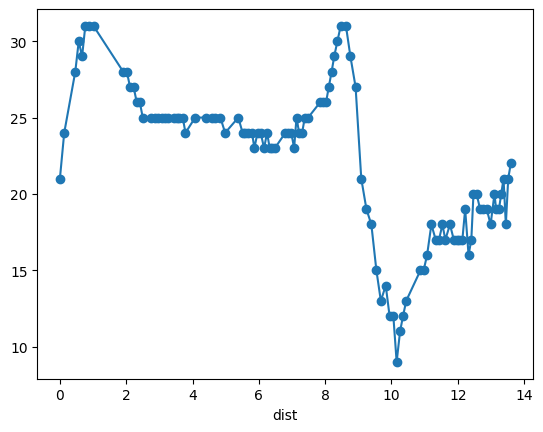

In [68]:
#display(df_all.iloc[1000:1020])  # mostra linhas entre 1000 e 1020
#print(df_all["dist"].unique()[:20])  # mostra as 20 primeiras distâncias únicas
df_all.groupby("dist").size().plot(marker="o")



In [69]:
import pickle

# --- Salvar DataFrame ---
df_all.to_pickle("df_all.pkl")

# --- Salvar array hpic ---
with open("hpic.pkl", "wb") as f:
    pickle.dump(hpic, f)

print("Arquivos salvos: df_all.pkl e hpic.pkl")


Arquivos salvos: df_all.pkl e hpic.pkl


Versao especial para o Guto que nao curte dataframe:

In [70]:
import numpy as np
import pickle

# 1) Matriz N×4: [dist, z, rho, v]
mat = df_all[["dist", "z", "rho", "v"]].to_numpy(dtype=float)

# 2) Lista de listas (cada linha é [dist, z, rho, v])
mat_list = mat.tolist()

# 3) Lista por perfil (útil pra iterar perfil a perfil)
profiles = []
for d, g in df_all.groupby("dist", sort=True):
    profiles.append({
        "dist": float(d),
        "z":   g["z"].to_list(),
        "rho": g["rho"].to_list(),
        "v":   g["v"].to_list(),
    })

# Salvar tudo em um novo pickle
with open("dados_em_listas_e_matriz.pkl", "wb") as f:
    pickle.dump(
        {
            "mat": mat,              # numpy.ndarray (N×4)
            "mat_list": mat_list,    # lista de listas
            "profiles": profiles,    # lista por perfil (dicionários com listas)
        },
        f,
        protocol=pickle.HIGHEST_PROTOCOL
    )

print("Salvo: dados_em_listas_e_matriz.pkl")
print("mat shape:", mat.shape, "| nº perfis:", len(profiles))


Salvo: dados_em_listas_e_matriz.pkl
mat shape: (2386, 4) | nº perfis: 107


In [ ]:
#TESTE 2:

import numpy as np
import pandas as pd

# 1. Preparar os dados de Densidade (mtx_tj)
# Como mtx_tj é uma matriz 2D, podemos criar um DataFrame diretamente com suas colunas
# Assumindo que as colunas são: 1 (distância), 2 (profundidade), 5 (densidade)
df_rho = pd.DataFrame({
    "dist_rho": mtx_tj[:, 1], 
    "z_rho": mtx_tj[:, 2], 
    "rho": mtx_tj[:, 5]
})

# 2. Preparar os dados de Velocidade (vr, x, z)
# Assumindo que vr, x, e z são arrays 1D do mesmo tamanho e que já foram alinhados
df_vel = pd.DataFrame({
    "x": x,
    "z": z, 
    "v": vr
})

# 3. Concatenar e Sincronizar os DataFrames
# Como as variáveis mtx_tj e vr/x/z representam os mesmos pontos de medição
# (o que foi crucial para os cálculos anteriores), eles devem ter o mesmo número de linhas.
# Podemos combiná-los assumindo que os índices estão alinhados.

df_final = pd.concat([df_rho, df_vel], axis=1)

# 4. Adicionar a Profundidade da Picnoclina (hpic)
# A profundidade da picnoclina é um valor por perfil.
# Para adicioná-la, precisamos mapear o valor de hpic para cada ponto (linha) no perfil.

# Cria um array com o 'id' do perfil (coluna 0 de mtx_tj) para mapeamento
perfil_id_map = mtx_tj[:, 0]
df_hpic = pd.DataFrame({'perfil_id': perfil_id_map.astype(int)})

# Cria um Series para mapear o id do perfil à profundidade suave (hpic)
hpic_series = pd.Series(np.asarray(smoothed_depths), index=np.unique(mtx_tj[:, 0]).astype(int))

# Mapeia a profundidade hpic de volta para o DataFrame final usando o ID do perfil
df_final['hpic'] = df_hpic['perfil_id'].map(hpic_series)

# --- Verificação de Dados ---
print("--- PRIMEIRAS 5 LINHAS DO DATAFRAME ---")
print(df_final.head())
print("\n--- INFORMAÇÕES DO DATAFRAME ---")
print(df_final.info())
print("--------------------------------------\n")


# 5. Salvar o DataFrame no formato Pickle
# O formato pickle preserva todos os tipos de dados e é ideal para DataFrames.
nome_arquivo = 'dados_froude_consolidado.pkl'
df_final.to_pickle(nome_arquivo)

print(f"✅ DataFrame salvo com sucesso no arquivo: {nome_arquivo}")
print("Você pode abri-lo em outro notebook com: pd.read_pickle('dados_froude_consolidado.pkl')")

In [60]:
# Supondo que mtx_tj e vr já estão carregados
# mtx_tj = np.loadtxt('seus_dados_densidade.txt') # Exemplo de carregamento
# vr = np.loadtxt('seus_dados_velocidade.txt')   # Exemplo de carregamento
# distancias = np.loadtxt('suas_distancias.txt')
# smoothed_depths = np.loadtxt('suas_profundidades_picnoclina.txt')

# Assumindo que a primeira coluna de mtx_tj é o ID do perfil, a segunda a distância e a terceira a profundidade
perfil_ids = np.unique(mtx_tj[:, 0])
num_perfis = len(perfil_ids)

# Arrays para armazenar os resultados
froude_internos = []

print(f"Dados carregados. Encontrados {num_perfis} perfis para processar.")

Dados carregados. Encontrados 107 perfis para processar.


In [61]:
# verificando tamanho:
print(f"Dimensão de mtx_tj: {mtx_tj.shape}")
print(f"Número de elementos em vr: {len(vr)}")

Dimensão de mtx_tj: (2386, 11)
Número de elementos em vr: 2386


In [62]:
# --- 2. Loop para calcular o número de Froude interno para cada perfil ---
froude_internos = []  # Reinicializar a lista para o caso de você rodar o código várias vezes

for i, perfil_id in enumerate(perfil_ids):
    # A profundidade da picnoclina para este perfil
    h = smoothed_depths[i]

    # Crie uma máscara de seleção para o perfil atual.
    # Esta máscara será usada para filtrar os dados de densidade e velocidade.
    perfil_mask = mtx_tj[:, 0] == perfil_id
    
    # Use a máscara para filtrar os dados de densidade e velocidade.
    perfil_data_densidade = mtx_tj[perfil_mask]
    perfil_data_velocidade = vr[perfil_mask]
    
    # 2.1. Separar os dados em camadas acima e abaixo da picnoclina
    # Lembre-se: os valores de profundidade em mtx_tj[:, 2] são negativos (profundidade).
    # A picnoclina 'h' também é negativa. Então, 'acima' significa menos negativo.
    camada_acima_mask = perfil_data_densidade[:, 2] >= h
    camada_abaixo_mask = perfil_data_densidade[:, 2] < h

    rho_a_pontos = perfil_data_densidade[camada_acima_mask, 5] # 5ª coluna é a densidade
    rho_b_pontos = perfil_data_densidade[camada_abaixo_mask, 5]

    # Filtre a velocidade usando a máscara da camada superior.
    velocidade_acima_pontos = perfil_data_velocidade[camada_acima_mask]
    
    # 2.2. Calcular as médias de densidade e velocidade
    rho_a = np.mean(rho_a_pontos) if rho_a_pontos.size > 0 else np.nan
    rho_b = np.mean(rho_b_pontos) if rho_b_pontos.size > 0 else np.nan
    U = np.mean(velocidade_acima_pontos) if velocidade_acima_pontos.size > 0 else np.nan

    # 2.3. Calcular a gravidade reduzida (g')
    g = 9.81
    if not np.isnan(rho_a) and not np.isnan(rho_b) and (rho_b - rho_a) > 0:
        g_prime = g * (rho_b - rho_a) / rho_a
    else:
        g_prime = np.nan
        
    # 2.4. Calcular o número de Froude interno (Fr_i)
    # Use -h, pois a profundidade na fórmula é um valor positivo.
    if not np.isnan(U) and not np.isnan(g_prime) and g_prime > 0 and h < 0:
        Fr_i = np.abs(U) / np.sqrt(g_prime * np.abs(h))
    else:
        Fr_i = np.nan
    
    # 2.5. Armazenar o resultado
    froude_internos.append(Fr_i)
    
    # Impressão para verificação (opcional, mas recomendado)
    print(f"Perfil {perfil_id}: h={h:.2f} m, rho_a={rho_a:.2f}, rho_b={rho_b:.2f}, U={U:.2f} m/s, Fr_i={Fr_i:.2f}")

# Converter a lista de resultados para um array numpy
froude_internos = np.array(froude_internos)

Perfil 0.0: h=6.73 m, rho_a=1007.76, rho_b=1005.90, U=-0.88 m/s, Fr_i=nan
Perfil 1.0: h=7.73 m, rho_a=1008.00, rho_b=1005.52, U=nan m/s, Fr_i=nan
Perfil 2.0: h=10.23 m, rho_a=1008.80, rho_b=1005.75, U=nan m/s, Fr_i=nan
Perfil 3.0: h=10.93 m, rho_a=1009.07, rho_b=1006.06, U=nan m/s, Fr_i=nan
Perfil 4.0: h=12.33 m, rho_a=1009.34, rho_b=1006.50, U=nan m/s, Fr_i=nan
Perfil 5.0: h=13.43 m, rho_a=1009.66, rho_b=1006.41, U=nan m/s, Fr_i=nan
Perfil 6.0: h=13.53 m, rho_a=1008.91, rho_b=1006.16, U=nan m/s, Fr_i=nan
Perfil 7.0: h=13.23 m, rho_a=1008.53, rho_b=1006.03, U=nan m/s, Fr_i=nan
Perfil 8.0: h=12.43 m, rho_a=1010.54, rho_b=1006.78, U=nan m/s, Fr_i=nan
Perfil 9.0: h=11.53 m, rho_a=1009.82, rho_b=1006.37, U=nan m/s, Fr_i=nan
Perfil 10.0: h=10.33 m, rho_a=1009.15, rho_b=1006.49, U=nan m/s, Fr_i=nan
Perfil 11.0: h=10.13 m, rho_a=1009.30, rho_b=1006.23, U=nan m/s, Fr_i=nan
Perfil 12.0: h=9.73 m, rho_a=1009.31, rho_b=1006.23, U=nan m/s, Fr_i=nan
Perfil 13.0: h=9.63 m, rho_a=1009.08, rho_b=1006.

In [63]:
# --- 2. Loop para calcular o número de Froude interno para cada perfil ---
froude_internos = []
distancias_froude = []

for i, perfil_id in enumerate(perfil_ids):
    # A profundidade da picnoclina para este perfil
    h = smoothed_depths[i]

    # Crie uma máscara de seleção para o perfil atual.
    perfil_mask = mtx_tj[:, 0] == perfil_id
    
    # Use a máscara para filtrar os dados de densidade e velocidade.
    perfil_data_densidade = mtx_tj[perfil_mask]
    perfil_data_velocidade = vr[perfil_mask]
    
    # 2.1. Separar os dados em camadas acima e abaixo da picnoclina
    # Lembre-se: os valores de profundidade em mtx_tj[:, 2] são positivos
    # A picnoclina 'h' também é um valor positivo
    
    # Camada ACIMA da picnoclina (menos densa) = profundidade MENOR que h
    camada_acima_mask = perfil_data_densidade[:, 2] <= h
    
    # Camada ABAIXO da picnoclina (mais densa) = profundidade MAIOR que h
    camada_abaixo_mask = perfil_data_densidade[:, 2] > h

    rho_a_pontos = perfil_data_densidade[camada_acima_mask, 5] # 5ª coluna é a densidade
    rho_b_pontos = perfil_data_densidade[camada_abaixo_mask, 5]

    # Filtre a velocidade usando a máscara da camada superior.
    velocidade_acima_pontos = perfil_data_velocidade[camada_acima_mask]
    
    # 2.2. Calcular as médias de densidade e velocidade
    rho_a = np.mean(rho_a_pontos) if rho_a_pontos.size > 0 else np.nan
    rho_b = np.mean(rho_b_pontos) if rho_b_pontos.size > 0 else np.nan
    U = np.mean(velocidade_acima_pontos) if velocidade_acima_pontos.size > 0 else np.nan
    
    # Verificação de Densidade
    if np.isnan(rho_a) or np.isnan(rho_b) or (rho_b - rho_a) <= 0:
        Fr_i = np.nan
        g_prime = np.nan
    else:
        # 2.3. Calcular a gravidade reduzida (g')
        g = 9.81
        g_prime = g * (rho_b - rho_a) / rho_a
        
        # 2.4. Calcular o número de Froude interno (Fr_i)
        if not np.isnan(U) and g_prime > 0 and h > 0:
            Fr_i = np.abs(U) / np.sqrt(g_prime * h)
        else:
            Fr_i = np.nan
    
    # 2.5. Armazenar o resultado
    froude_internos.append(Fr_i)
    distancias_froude.append(distancias[i])
    
    # Impressão para verificação (opcional, mas recomendado)
    print(f"Perfil {perfil_id}: h={h:.2f} m, rho_a={rho_a:.2f}, rho_b={rho_b:.2f}, U={U:.2f} m/s, Fr_i={Fr_i:.2f}")

# Converter a lista de resultados para um array numpy
froude_internos = np.array(froude_internos)
distancias_froude = np.array(distancias_froude)

Perfil 0.0: h=6.73 m, rho_a=1005.97, rho_b=1007.86, U=-1.56 m/s, Fr_i=4.41
Perfil 1.0: h=7.73 m, rho_a=1005.63, rho_b=1008.10, U=-1.44 m/s, Fr_i=3.33
Perfil 2.0: h=10.23 m, rho_a=1005.85, rho_b=1008.94, U=-1.24 m/s, Fr_i=2.23
Perfil 3.0: h=10.93 m, rho_a=1006.06, rho_b=1009.07, U=-1.19 m/s, Fr_i=2.10
Perfil 4.0: h=12.33 m, rho_a=1006.50, rho_b=1009.34, U=-1.13 m/s, Fr_i=1.93
Perfil 5.0: h=13.43 m, rho_a=1006.41, rho_b=1009.66, U=-1.08 m/s, Fr_i=1.66
Perfil 6.0: h=13.53 m, rho_a=1006.16, rho_b=1008.91, U=-1.14 m/s, Fr_i=1.88
Perfil 7.0: h=13.23 m, rho_a=1006.09, rho_b=1008.68, U=-1.15 m/s, Fr_i=1.99
Perfil 8.0: h=12.43 m, rho_a=1006.78, rho_b=1010.54, U=-1.08 m/s, Fr_i=1.60
Perfil 9.0: h=11.53 m, rho_a=1006.37, rho_b=1009.82, U=-1.12 m/s, Fr_i=1.80
Perfil 10.0: h=10.33 m, rho_a=1006.49, rho_b=1009.15, U=-1.09 m/s, Fr_i=2.12
Perfil 11.0: h=10.13 m, rho_a=1006.23, rho_b=1009.30, U=-1.12 m/s, Fr_i=2.03
Perfil 12.0: h=9.73 m, rho_a=1006.23, rho_b=1009.31, U=-1.13 m/s, Fr_i=2.09
Perfil 13.0:

In [64]:
# --- Verificação da velocidade na camada superior ---
for i, perfil_id in enumerate(perfil_ids):
    h = smoothed_depths[i]
    perfil_mask = mtx_tj[:, 0] == perfil_id
    perfil_data_densidade = mtx_tj[perfil_mask]
    perfil_data_velocidade = vr[perfil_mask]
    
    # Camada ACIMA da picnoclina
    camada_acima_mask = perfil_data_densidade[:, 2] <= h
    
    velocidade_acima_pontos = perfil_data_velocidade[camada_acima_mask]
    
    # Imprimir os valores para inspeção
    print(f"Perfil {perfil_id}: Profundidade Picnoclina={h:.2f}m")
    print(f"Valores de Velocidade na camada acima: {velocidade_acima_pontos}")
    print(f"Média da Velocidade (U): {np.mean(velocidade_acima_pontos):.2f} m/s\n")

Perfil 0.0: Profundidade Picnoclina=6.73m
Valores de Velocidade na camada acima: [-1.6887616  -1.77489238 -1.7520004  -1.68294209 -1.6295034  -1.60250666
 -1.49721723 -1.47041678 -1.40843614 -1.35004741 -1.25872838]
Média da Velocidade (U): -1.56 m/s

Perfil 1.0: Profundidade Picnoclina=7.73m
Valores de Velocidade na camada acima: [-1.59815246 -1.65295498 -1.7248763  -1.68380297 -1.61471006 -1.52194319
 -1.46130412 -1.40475346 -1.34962318 -1.26619817 -1.20565658 -1.14382623
 -1.09635891]
Média da Velocidade (U): -1.44 m/s

Perfil 2.0: Profundidade Picnoclina=10.23m
Valores de Velocidade na camada acima: [-1.73170948 -1.69442766 -1.62586349 -1.56540493 -1.51331057 -1.43825569
 -1.39148834 -1.33909034 -1.27607161 -1.22000228 -1.20460501 -1.12953348
 -1.04119925 -0.97105219 -0.87472438 -0.80987743 -0.77850424 -0.74645066]
Média da Velocidade (U): -1.24 m/s

Perfil 3.0: Profundidade Picnoclina=10.93m
Valores de Velocidade na camada acima: [-1.7485686  -1.65053626 -1.56425811 -1.5261673  -1

In [65]:
import numpy as np
import matplotlib.pyplot as plt

# --- Loop para calcular o número de Froude interno para cada perfil ---
froude_internos = []
distancias_froude = []
g = 9.81

for i, perfil_id in enumerate(perfil_ids):
    # A profundidade da picnoclina
    h1 = smoothed_depths[i]

    # Crie uma máscara para o perfil
    perfil_mask = mtx_tj[:, 0] == perfil_id
    
    # Use a máscara para filtrar os dados de densidade e velocidade.
    perfil_data_densidade = mtx_tj[perfil_mask]
    perfil_data_velocidade = vr[perfil_mask]

    # Obter a profundidade total do perfil
    # Assumindo que a profundidade está na 2ª coluna e é um valor positivo (como mtx_tj[:, 2])
    # A profundidade total é o valor máximo de z para aquele perfil
    if perfil_data_densidade.size > 0:
        prof_total_perfil = np.max(perfil_data_densidade[:, 2])
    else:
        prof_total_perfil = np.nan
    
    # 2.1. Separar os dados em camadas
    # Lembre-se que h1 e as profundidades são positivas
    camada_acima_mask = perfil_data_densidade[:, 2] <= h1
    camada_abaixo_mask = perfil_data_densidade[:, 2] > h1

    # Densidades das duas camadas
    rho_a = np.mean(perfil_data_densidade[camada_acima_mask, 5]) if perfil_data_densidade[camada_acima_mask, 5].size > 0 else np.nan
    rho_b = np.mean(perfil_data_densidade[camada_abaixo_mask, 5]) if perfil_data_densidade[camada_abaixo_mask, 5].size > 0 else np.nan

    # Velocidades das duas camadas
    U1 = np.mean(perfil_data_velocidade[camada_acima_mask]) if perfil_data_velocidade[camada_acima_mask].size > 0 else np.nan
    U2 = np.mean(perfil_data_velocidade[camada_abaixo_mask]) if perfil_data_velocidade[camada_abaixo_mask].size > 0 else np.nan
    
    # 2.2. Calcular espessuras das camadas
    # h1 já foi definida como a profundidade da picnoclina
    h2 = prof_total_perfil - h1
    
    # 2.3. Cálculo do Froude Interno com 2 camadas ativas
    Fr_i = np.nan
    if not np.isnan(rho_a) and not np.isnan(rho_b) and (rho_b - rho_a) > 0 and h1 > 0 and h2 > 0:
        g_prime = g * (rho_b - rho_a) / rho_a
        
        # Denominador da fórmula de Froude para duas camadas
        denominador = np.sqrt(g_prime * ((h1 * h2) / (h1 + h2)))
        
        if denominador > 0 and not np.isnan(U1) and not np.isnan(U2):
            # Numerador: velocidade relativa
            Fr_i = np.abs(U1 - U2) / denominador

    # 2.4. Armazenar o resultado
    froude_internos.append(Fr_i)
    distancias_froude.append(distancias[i])
    
    # Impressão para verificação
    print(f"Perfil {perfil_id}: h1={h1:.2f} m, h2={h2:.2f} m, U1={U1:.2f} m/s, U2={U2:.2f} m/s, Fr_i={Fr_i:.2f}")

# Converter a lista de resultados para um array numpy
froude_internos = np.array(froude_internos)
distancias_froude = np.array(distancias_froude)

Perfil 0.0: h1=6.73 m, h2=5.00 m, U1=-1.56 m/s, U2=-0.85 m/s, Fr_i=3.08
Perfil 1.0: h1=7.73 m, h2=5.50 m, U1=-1.44 m/s, U2=nan m/s, Fr_i=nan
Perfil 2.0: h1=10.23 m, h2=5.00 m, U1=-1.24 m/s, U2=nan m/s, Fr_i=nan
Perfil 3.0: h1=10.93 m, h2=5.30 m, U1=-1.19 m/s, U2=nan m/s, Fr_i=nan
Perfil 4.0: h1=12.33 m, h2=3.40 m, U1=-1.13 m/s, U2=nan m/s, Fr_i=nan
Perfil 5.0: h1=13.43 m, h2=3.30 m, U1=-1.08 m/s, U2=nan m/s, Fr_i=nan
Perfil 6.0: h1=13.53 m, h2=3.20 m, U1=-1.14 m/s, U2=nan m/s, Fr_i=nan
Perfil 7.0: h1=13.23 m, h2=3.50 m, U1=-1.15 m/s, U2=nan m/s, Fr_i=nan
Perfil 8.0: h1=12.43 m, h2=2.80 m, U1=-1.08 m/s, U2=nan m/s, Fr_i=nan
Perfil 9.0: h1=11.53 m, h2=3.70 m, U1=-1.12 m/s, U2=nan m/s, Fr_i=nan
Perfil 10.0: h1=10.33 m, h2=4.40 m, U1=-1.09 m/s, U2=nan m/s, Fr_i=nan
Perfil 11.0: h1=10.13 m, h2=4.60 m, U1=-1.12 m/s, U2=nan m/s, Fr_i=nan
Perfil 12.0: h1=9.73 m, h2=4.50 m, U1=-1.13 m/s, U2=nan m/s, Fr_i=nan
Perfil 13.0: h1=9.63 m, h2=4.60 m, U1=-1.14 m/s, U2=nan m/s, Fr_i=nan
Perfil 14.0: h1=9

In [66]:

# --- Loop para calcular o número de Froude interno para cada perfil ---
froude_internos = []
distancias_froude = []
g = 9.81

for i, perfil_id in enumerate(perfil_ids):
    # A profundidade da picnoclina
    h1 = smoothed_depths[i]

    # Crie uma máscara para o perfil
    perfil_mask = mtx_tj[:, 0] == perfil_id
    
    # Use a máscara para filtrar os dados de densidade e velocidade.
    # Note que agora filtramos apenas os dados do perfil, mantendo as colunas.
    perfil_data_completo = mtx_tj[perfil_mask]
    perfil_velocidade = vr[perfil_mask]
    
    # Obter a profundidade total do perfil
    if perfil_data_completo.size > 0:
        prof_total_perfil = np.max(perfil_data_completo[:, 2])
    else:
        prof_total_perfil = np.nan
    
    # 2.1. Separar os dados em camadas ACIMA e ABAIXO da picnoclina
    # Lembre-se que h1 e as profundidades são positivas
    acima_mask = perfil_data_completo[:, 2] <= h1
    abaixo_mask = perfil_data_completo[:, 2] > h1

    # Densidades das duas camadas
    rho_a = np.mean(perfil_data_completo[acima_mask, 5]) if np.any(acima_mask) else np.nan
    rho_b = np.mean(perfil_data_completo[abaixo_mask, 5]) if np.any(abaixo_mask) else np.nan

    # Velocidades das duas camadas
    U1 = np.mean(perfil_velocidade[acima_mask]) if np.any(acima_mask) else np.nan
    U2 = np.mean(perfil_velocidade[abaixo_mask]) if np.any(abaixo_mask) else np.nan
    
    # Adicionar uma verificação para inspecionar os dados da camada inferior
    pontos_abaixo_da_picnoclina = np.sum(abaixo_mask)
    if pontos_abaixo_da_picnoclina == 0:
        print(f"Aviso: Perfil {perfil_id} não tem pontos de dados abaixo da picnoclina. U2 será nan.")
    
    # 2.2. Calcular espessuras das camadas
    h1_calc = h1
    h2 = prof_total_perfil - h1
    
    # 2.3. Cálculo do Froude Interno com 2 camadas ativas
    Fr_i = np.nan
    
    if not np.isnan(rho_a) and not np.isnan(rho_b) and (rho_b - rho_a) > 0 and h1_calc > 0 and h2 > 0:
        # Tentar calcular com a fórmula de duas camadas ativas
        if not np.isnan(U1) and not np.isnan(U2):
            g_prime = g * (rho_b - rho_a) / rho_a
            denominador = np.sqrt(g_prime * ((h1_calc * h2) / (h1_calc + h2)))
            if denominador > 0:
                Fr_i = np.abs(U1 - U2) / denominador
    
    # 2.4. Se U2 for nan (sem dados), usar a fórmula de camada única
    if np.isnan(Fr_i) and not np.isnan(U1):
        g_prime = g * (rho_b - rho_a) / rho_a
        denominador = np.sqrt(g_prime * h1_calc)
        if denominador > 0:
            Fr_i = np.abs(U1) / denominador
    
    # 2.5. Armazenar o resultado
    froude_internos.append(Fr_i)
    distancias_froude.append(distancias[i])
    
    # 2.6. Impressão para verificação
    if np.isnan(U2):
        print(f"Perfil {perfil_id}: h1={h1:.2f} m, U1={U1:.2f} m/s, U2=nan m/s, Usando camada única. Fr_i={Fr_i:.2f}")
    else:
        print(f"Perfil {perfil_id}: h1={h1:.2f} m, h2={h2:.2f} m, U1={U1:.2f} m/s, U2={U2:.2f} m/s, Usando 2 camadas. Fr_i={Fr_i:.2f}")

# Converter a lista de resultados para um array numpy
froude_internos = np.array(froude_internos)
distancias_froude = np.array(distancias_froude)

Perfil 0.0: h1=6.73 m, h2=5.00 m, U1=-1.56 m/s, U2=-0.85 m/s, Usando 2 camadas. Fr_i=3.08
Perfil 1.0: h1=7.73 m, U1=-1.44 m/s, U2=nan m/s, Usando camada única. Fr_i=3.33
Perfil 2.0: h1=10.23 m, U1=-1.24 m/s, U2=nan m/s, Usando camada única. Fr_i=2.23
Perfil 3.0: h1=10.93 m, U1=-1.19 m/s, U2=nan m/s, Usando camada única. Fr_i=2.10
Perfil 4.0: h1=12.33 m, U1=-1.13 m/s, U2=nan m/s, Usando camada única. Fr_i=1.93
Perfil 5.0: h1=13.43 m, U1=-1.08 m/s, U2=nan m/s, Usando camada única. Fr_i=1.66
Perfil 6.0: h1=13.53 m, U1=-1.14 m/s, U2=nan m/s, Usando camada única. Fr_i=1.88
Perfil 7.0: h1=13.23 m, U1=-1.15 m/s, U2=nan m/s, Usando camada única. Fr_i=1.99
Perfil 8.0: h1=12.43 m, U1=-1.08 m/s, U2=nan m/s, Usando camada única. Fr_i=1.60
Perfil 9.0: h1=11.53 m, U1=-1.12 m/s, U2=nan m/s, Usando camada única. Fr_i=1.80
Perfil 10.0: h1=10.33 m, U1=-1.09 m/s, U2=nan m/s, Usando camada única. Fr_i=2.12
Perfil 11.0: h1=10.13 m, U1=-1.12 m/s, U2=nan m/s, Usando camada única. Fr_i=2.03
Perfil 12.0: h1=9.

In [67]:
# --- Loop para calcular o número de Froude interno para cada perfil ---
froude_internos = []
distancias_froude = []
g = 9.81

for i, perfil_id in enumerate(perfil_ids):
    # A profundidade da picnoclina
    h1 = smoothed_depths[i]
    
    # 1. Obter a profundidade total do perfil
    # Encontra todos os pontos para este perfil_id
    mask_perfil = mtx_tj[:, 0] == perfil_id
    perfil_data_completo = mtx_tj[mask_perfil]
    
    if perfil_data_completo.size > 0:
        prof_total_perfil = np.max(perfil_data_completo[:, 2])
    else:
        prof_total_perfil = np.nan
    
    # 2. Crie máscaras únicas para cada camada usando os arrays originais
    # Isso elimina a chance de erros de indexação
    
    # Máscara para a camada superior (pluma): profundidade <= picnoclina
    mask_acima = (mtx_tj[:, 0] == perfil_id) & (mtx_tj[:, 2] <= h1)
    
    # Máscara para a camada inferior (salina): profundidade > picnoclina
    mask_abaixo = (mtx_tj[:, 0] == perfil_id) & (mtx_tj[:, 2] > h1)

    # 3. Separar os dados usando as máscaras robustas
    # Dados da camada superior (rho_a e U1)
    rho_a_pontos = mtx_tj[mask_acima, 5]
    U1_pontos = vr[mask_acima]
    
    # Dados da camada inferior (rho_b e U2)
    rho_b_pontos = mtx_tj[mask_abaixo, 5]
    U2_pontos = vr[mask_abaixo]
    
    # 4. Calcular as médias de densidade e velocidade
    rho_a = np.mean(rho_a_pontos) if U1_pontos.size > 0 else np.nan
    rho_b = np.mean(rho_b_pontos) if U2_pontos.size > 0 else np.nan
    U1 = np.mean(U1_pontos) if U1_pontos.size > 0 else np.nan
    U2 = np.mean(U2_pontos) if U2_pontos.size > 0 else np.nan
    
    # 5. Adicionar verificação de pontos para depuração
    print(f"Perfil {perfil_id}: Pontos acima da picnoclina = {U1_pontos.size}, Pontos abaixo = {U2_pontos.size}")
    
    # 6. Cálculo do Froude Interno
    Fr_i = np.nan
    if not np.isnan(rho_a) and not np.isnan(rho_b) and (rho_b - rho_a) > 0 and h1 > 0 and not np.isnan(U1):
        if not np.isnan(U2):
            h2 = prof_total_perfil - h1
            if h2 > 0:
                g_prime = g * (rho_b - rho_a) / rho_a
                denominador = np.sqrt(g_prime * ((h1 * h2) / (h1 + h2)))
                if denominador > 0:
                    Fr_i = np.abs(U1 - U2) / denominador
        else: # U2 is nan, use single-layer model
            g_prime = g * (rho_b - rho_a) / rho_a
            denominador = np.sqrt(g_prime * h1)
            if denominador > 0:
                Fr_i = np.abs(U1) / denominador
    
    # 7. Armazenar o resultado
    froude_internos.append(Fr_i)
    distancias_froude.append(distancias[i])
    
    # 8. Impressão para verificação
    if np.isnan(U2):
        print(f"Perfil {perfil_id}: h1={h1:.2f} m, U1={U1:.2f} m/s, U2=nan m/s, Usando camada única. Fr_i={Fr_i:.2f}")
    else:
        print(f"Perfil {perfil_id}: h1={h1:.2f} m, h2={prof_total_perfil - h1:.2f} m, U1={U1:.2f} m/s, U2={U2:.2f} m/s, Usando 2 camadas. Fr_i={Fr_i:.2f}")

# Converter a lista de resultados para um array numpy
froude_internos = np.array(froude_internos)
distancias_froude = np.array(distancias_froude)

Perfil 0.0: Pontos acima da picnoclina = 11, Pontos abaixo = 10
Perfil 0.0: h1=6.73 m, h2=5.00 m, U1=-1.56 m/s, U2=-0.85 m/s, Usando 2 camadas. Fr_i=3.08
Perfil 1.0: Pontos acima da picnoclina = 13, Pontos abaixo = 11
Perfil 1.0: h1=7.73 m, U1=-1.44 m/s, U2=nan m/s, Usando camada única. Fr_i=3.33
Perfil 2.0: Pontos acima da picnoclina = 18, Pontos abaixo = 10
Perfil 2.0: h1=10.23 m, U1=-1.24 m/s, U2=nan m/s, Usando camada única. Fr_i=2.23
Perfil 3.0: Pontos acima da picnoclina = 19, Pontos abaixo = 11
Perfil 3.0: h1=10.93 m, U1=-1.19 m/s, U2=nan m/s, Usando camada única. Fr_i=2.10
Perfil 4.0: Pontos acima da picnoclina = 22, Pontos abaixo = 7
Perfil 4.0: h1=12.33 m, U1=-1.13 m/s, U2=nan m/s, Usando camada única. Fr_i=1.93
Perfil 5.0: Pontos acima da picnoclina = 24, Pontos abaixo = 7
Perfil 5.0: h1=13.43 m, U1=-1.08 m/s, U2=nan m/s, Usando camada única. Fr_i=1.66
Perfil 6.0: Pontos acima da picnoclina = 24, Pontos abaixo = 7
Perfil 6.0: h1=13.53 m, U1=-1.14 m/s, U2=nan m/s, Usando cama

In [68]:
#ultimate test tabajara em 29 de setembro de 2025:


# --- Loop para calcular o número de Froude interno para cada perfil ---
froude_internos = []
distancias_froude = []
g = 9.81

for i, perfil_id in enumerate(perfil_ids):
    # A profundidade da picnoclina
    h1 = smoothed_depths[i]
    
    # 1. Obter a profundidade total do perfil
    mask_perfil = mtx_tj[:, 0] == perfil_id
    perfil_data_completo = mtx_tj[mask_perfil]
    
    if perfil_data_completo.size > 0:
        prof_total_perfil = np.max(perfil_data_completo[:, 2])
    else:
        prof_total_perfil = np.nan
    
    # 2. Crie máscaras únicas para cada camada usando os arrays originais
    mask_acima = (mtx_tj[:, 0] == perfil_id) & (mtx_tj[:, 2] <= h1)
    mask_abaixo = (mtx_tj[:, 0] == perfil_id) & (mtx_tj[:, 2] > h1)

    # 3. Separar os dados usando as máscaras robustas
    rho_a_pontos = mtx_tj[mask_acima, 5]
    U1_pontos = vr[mask_acima]
    
    rho_b_pontos = mtx_tj[mask_abaixo, 5]
    U2_pontos = vr[mask_abaixo]
    
    # 4. Calcular as médias de densidade e velocidade
    # Usando np.nanmean para ignorar valores NaN, se existirem
    rho_a = np.nanmean(rho_a_pontos) if rho_a_pontos.size > 0 else np.nan
    rho_b = np.nanmean(rho_b_pontos) if rho_b_pontos.size > 0 else np.nan
    U1 = np.nanmean(U1_pontos) if U1_pontos.size > 0 else np.nan
    U2 = np.nanmean(U2_pontos) if U2_pontos.size > 0 else np.nan
    
    # 5. Adicionar verificação de pontos para depuração
    print(f"Perfil {perfil_id}: Pontos acima da picnoclina = {U1_pontos.size}, Pontos abaixo = {U2_pontos.size}")
    
    # 6. Cálculo do Froude Interno
    Fr_i = np.nan
    if not np.isnan(rho_a) and not np.isnan(rho_b) and (rho_b - rho_a) > 0 and h1 > 0 and not np.isnan(U1):
        if not np.isnan(U2):
            h2 = prof_total_perfil - h1
            if h2 > 0:
                g_prime = g * (rho_b - rho_a) / rho_a
                denominador = np.sqrt(g_prime * ((h1 * h2) / (h1 + h2)))
                if denominador > 0:
                    Fr_i = np.abs(U1 - U2) / denominador
        else: # U2 is nan, use single-layer model
            g_prime = g * (rho_b - rho_a) / rho_a
            denominador = np.sqrt(g_prime * h1)
            if denominador > 0:
                Fr_i = np.abs(U1) / denominador
    
    # 7. Armazenar o resultado
    froude_internos.append(Fr_i)
    distancias_froude.append(distancias[i])
    
    # 8. Impressão para verificação
    if np.isnan(U2):
        print(f"Perfil {perfil_id}: h1={h1:.2f} m, U1={U1:.2f} m/s, U2=nan m/s, Usando camada única. Fr_i={Fr_i:.2f}")
    else:
        print(f"Perfil {perfil_id}: h1={h1:.2f} m, h2={prof_total_perfil - h1:.2f} m, U1={U1:.2f} m/s, U2={U2:.2f} m/s, Usando 2 camadas. Fr_i={Fr_i:.2f}")

# Converter a lista de resultados para um array numpy
froude_internos = np.array(froude_internos)
distancias_froude = np.array(distancias_froude)

Perfil 0.0: Pontos acima da picnoclina = 11, Pontos abaixo = 10
Perfil 0.0: h1=6.73 m, h2=5.00 m, U1=-1.56 m/s, U2=-0.85 m/s, Usando 2 camadas. Fr_i=3.08
Perfil 1.0: Pontos acima da picnoclina = 13, Pontos abaixo = 11
Perfil 1.0: h1=7.73 m, h2=5.50 m, U1=-1.44 m/s, U2=-0.78 m/s, Usando 2 camadas. Fr_i=2.36
Perfil 2.0: Pontos acima da picnoclina = 18, Pontos abaixo = 10
Perfil 2.0: h1=10.23 m, h2=5.00 m, U1=-1.24 m/s, U2=-0.73 m/s, Usando 2 camadas. Fr_i=1.61
Perfil 3.0: Pontos acima da picnoclina = 19, Pontos abaixo = 11
Perfil 3.0: h1=10.93 m, h2=5.30 m, U1=-1.19 m/s, U2=-0.59 m/s, Usando 2 camadas. Fr_i=1.87
Perfil 4.0: Pontos acima da picnoclina = 22, Pontos abaixo = 7
Perfil 4.0: h1=12.33 m, h2=3.40 m, U1=-1.13 m/s, U2=-0.51 m/s, Usando 2 camadas. Fr_i=2.28
Perfil 5.0: Pontos acima da picnoclina = 24, Pontos abaixo = 7
Perfil 5.0: h1=13.43 m, h2=3.30 m, U1=-1.08 m/s, U2=-0.44 m/s, Usando 2 camadas. Fr_i=2.22
Perfil 6.0: Pontos acima da picnoclina = 24, Pontos abaixo = 7
Perfil 6.0:

In [71]:
# --- Loop para calcular o número de Froude interno para cada perfil ---
froude_internos = []
distancias_froude = []
g = 9.81

for i, perfil_id in enumerate(perfil_ids):
    # A profundidade da picnoclina
    h1 = smoothed_depths[i]
    
    # 1. Obter a profundidade total do perfil
    mask_perfil = mtx_tj[:, 0] == perfil_id
    perfil_data_completo = mtx_tj[mask_perfil]
    
    if perfil_data_completo.size > 0:
        prof_total_perfil = np.max(perfil_data_completo[:, 2])
    else:
        prof_total_perfil = np.nan
    
    # 2. Crie máscaras únicas para cada camada usando os arrays originais
    mask_acima = (mtx_tj[:, 0] == perfil_id) & (mtx_tj[:, 2] <= h1)
    mask_abaixo = (mtx_tj[:, 0] == perfil_id) & (mtx_tj[:, 2] > h1)

    # 3. Separar os dados usando as máscaras robustas
    rho_a_pontos = mtx_tj[mask_acima, 5]
    U1_pontos = vr[mask_acima]
    
    rho_b_pontos = mtx_tj[mask_abaixo, 5]
    U2_pontos = vr[mask_abaixo]
    
    # 4. Calcular as médias de densidade e velocidade (mantendo em m/s, sem conversão)
    rho_a = np.nanmean(rho_a_pontos) if rho_a_pontos.size > 0 else np.nan
    rho_b = np.nanmean(rho_b_pontos) if rho_b_pontos.size > 0 else np.nan
    U1 = np.nanmean(U1_pontos) if U1_pontos.size > 0 else np.nan
    U2 = np.nanmean(U2_pontos) if U2_pontos.size > 0 else np.nan
    
    # 5. Adicionar verificação de pontos para depuração
    print(f"Perfil {perfil_id}: Pontos acima da picnoclina = {U1_pontos.size}, Pontos abaixo = {U2_pontos.size}")
    
    # 6. Cálculo do Froude Interno
    Fr_i = np.nan
    
    # 6.1. Verifica a validade dos dados de densidade e espessura
    if not np.isnan(rho_a) and not np.isnan(rho_b) and (rho_b - rho_a) > 0 and h1 > 0 and not np.isnan(U1):
        
        # 6.2. Calcular a gravidade reduzida (g')
        g_prime = g * (rho_b - rho_a) / rho_a
        
        if not np.isnan(U2):
            # Fórmula de DUAS CAMADAS ATIVAS (U2 não é NaN)
            h2 = prof_total_perfil - h1
            if h2 > 0:
                # Denominador: Espessura Efetiva da Camada
                denominador = np.sqrt(g_prime * ((h1 * h2) / (h1 + h2)))
                if denominador > 0:
                    # Numerador: Velocidade Relativa entre as camadas
                    Fr_i = np.abs(U1 - U2) / denominador
        else:
            # Fórmula de CAMADA ÚNICA (U2 é NaN, assume U2 = 0)
            # Apenas para garantir que o Fr_i não seja NaN onde os dados de U1 e h1 existem
            denominador = np.sqrt(g_prime * h1)
            if denominador > 0:
                Fr_i = np.abs(U1) / denominador
    
    # 7. Armazenar o resultado
    froude_internos.append(Fr_i)
    distancias_froude.append(distancias[i])
    
    # 8. Impressão para verificação
    if np.isnan(U2):
        print(f"Perfil {perfil_id}: h1={h1:.2f} m, U1={U1:.2f} m/s, U2=nan m/s, Usando camada única. Fr_i={Fr_i:.2f}")
    else:
        print(f"Perfil {perfil_id}: h1={h1:.2f} m, h2={prof_total_perfil - h1:.2f} m, U1={U1:.2f} m/s, U2={U2:.2f} m/s, Usando 2 camadas. Fr_i={Fr_i:.2f}")

# Converter a lista de resultados para um array numpy
froude_internos = np.array(froude_internos)
distancias_froude = np.array(distancias_froude)

Perfil 0.0: Pontos acima da picnoclina = 11, Pontos abaixo = 10
Perfil 0.0: h1=6.73 m, h2=5.00 m, U1=-1.56 m/s, U2=-0.85 m/s, Usando 2 camadas. Fr_i=3.08
Perfil 1.0: Pontos acima da picnoclina = 13, Pontos abaixo = 11
Perfil 1.0: h1=7.73 m, h2=5.50 m, U1=-1.44 m/s, U2=-0.78 m/s, Usando 2 camadas. Fr_i=2.36
Perfil 2.0: Pontos acima da picnoclina = 18, Pontos abaixo = 10
Perfil 2.0: h1=10.23 m, h2=5.00 m, U1=-1.24 m/s, U2=-0.73 m/s, Usando 2 camadas. Fr_i=1.61
Perfil 3.0: Pontos acima da picnoclina = 19, Pontos abaixo = 11
Perfil 3.0: h1=10.93 m, h2=5.30 m, U1=-1.19 m/s, U2=-0.59 m/s, Usando 2 camadas. Fr_i=1.87
Perfil 4.0: Pontos acima da picnoclina = 22, Pontos abaixo = 7
Perfil 4.0: h1=12.33 m, h2=3.40 m, U1=-1.13 m/s, U2=-0.51 m/s, Usando 2 camadas. Fr_i=2.28
Perfil 5.0: Pontos acima da picnoclina = 24, Pontos abaixo = 7
Perfil 5.0: h1=13.43 m, h2=3.30 m, U1=-1.08 m/s, U2=-0.44 m/s, Usando 2 camadas. Fr_i=2.22
Perfil 6.0: Pontos acima da picnoclina = 24, Pontos abaixo = 7
Perfil 6.0:

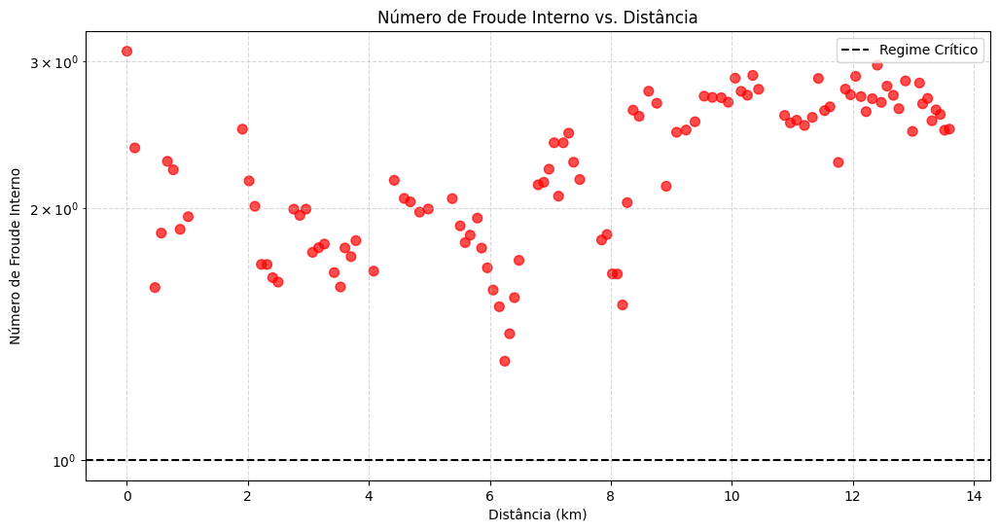

In [72]:
# --- Código para Plotar os Resultados ---
fig, ax = plt.subplots(figsize=(12, 6))

# Defina as cores: Vermelho para Supercrítico (>= 1), Azul para Subcrítico (< 1)
colors = np.where(froude_internos >= 1, 'red', 'blue')

# Crie o gráfico de dispersão
ax.scatter(distancias_froude, froude_internos, c=colors, s=50, alpha=0.7)

# Adicione a linha horizontal para o Regime Crítico (Fr_i = 1)
ax.axhline(1.0, color='k', linestyle='--', linewidth=1.5, label='Regime Crítico')

# Defina o título e os rótulos
ax.set_title('Número de Froude Interno vs. Distância')
ax.set_xlabel('Distância (km)')
ax.set_ylabel('Número de Froude Interno')
ax.set_yscale('log') # Escala Logarítmica

# Adicione a legenda e o grid
ax.legend()
ax.grid(True, which="both", ls="--", alpha=0.5)

plt.show()

### Código Corrigido: Froude com Densidade de Pico (Integrado)
Este código executa o cálculo do gradiente de densidade dentro do loop do Froude para identificar a diferença de densidade de pico para cada perfil.

In [74]:
import numpy as np
import matplotlib.pyplot as plt

# --- Loop para calcular o número de Froude interno para cada perfil ---
froude_internos = []
distancias_froude = []
g = 9.81
min_depth_limit = 2.0  # Mantendo o limite de profundidade do seu cálculo de picnoclina

for i, perfil_id in enumerate(perfil_ids):
    # A profundidade da picnoclina (h1) é a profundidade suave
    h1 = smoothed_depths[i]
    
    # 1. Obter todos os dados do perfil e ordenar por profundidade
    mask_perfil = mtx_tj[:, 0] == perfil_id
    perfil_data_completo = mtx_tj[mask_perfil]
    
    if perfil_data_completo.size > 0:
        # Ordenar o perfil pela profundidade (coluna 2) para cálculo do gradiente
        sort_idx = np.argsort(perfil_data_completo[:, 2])
        z_perfil = perfil_data_completo[sort_idx, 2]
        rho_perfil = perfil_data_completo[sort_idx, 5]
        prof_total_perfil = np.max(z_perfil)
    else:
        prof_total_perfil = np.nan
        froude_internos.append(np.nan)
        distancias_froude.append(distancias[i])
        continue

    # --- NOVO CÁLCULO DE DENSIDADE DE PICO (Substitui as médias rho_a e rho_b) ---
    
    # Aplicar a máscara de profundidade mínima, como no seu código original (z > 2.0m)
    deep_data_mask = z_perfil > min_depth_limit
    z_filtered = z_perfil[deep_data_mask]
    rho_filtered = rho_perfil[deep_data_mask]
    
    rho_a, rho_b = np.nan, np.nan
    
    if len(z_filtered) > 1:
        # 1. Calcular o gradiente de densidade no perfil filtrado
        drho_dz = np.gradient(rho_filtered, z_filtered)
        
        # 2. Encontrar o índice do ponto de maior gradiente
        idx_max = np.argmax(np.abs(drho_dz))
        
        # 3. Definir rho_b e rho_a pelas densidades adjacentes ao pico
        if idx_max > 0 and idx_max < len(rho_filtered) - 1:
            # rho_a (menos denso) está acima do pico
            rho_a = rho_filtered[idx_max - 1] 
            # rho_b (mais denso) está abaixo do pico
            rho_b = rho_filtered[idx_max + 1]
    
    # --- FIM NOVO CÁLCULO DE DENSIDADE DE PICO ---

    # 4. Calcular as médias de Velocidade (U1 e U2) - Usa o h1 (smoothed_depths)
    mask_acima = (mtx_tj[:, 0] == perfil_id) & (mtx_tj[:, 2] <= h1)
    mask_abaixo = (mtx_tj[:, 0] == perfil_id) & (mtx_tj[:, 2] > h1)
    
    U1_pontos = vr[mask_acima]
    U2_pontos = vr[mask_abaixo]
    
    U1 = np.nanmean(U1_pontos) if U1_pontos.size > 0 else np.nan
    U2 = np.nanmean(U2_pontos) if U2_pontos.size > 0 else np.nan
    
    # 5. Cálculo do Froude Interno
    Fr_i = np.nan
    
    # Verifica validade: rho_b > rho_a, e densidades válidas
    if not np.isnan(rho_a) and not np.isnan(rho_b) and (rho_b - rho_a) > 0 and h1 > 0 and not np.isnan(U1):
        
        # 5.1. Calcular a gravidade reduzida (g')
        g_prime = g * (rho_b - rho_a) / rho_a
        
        if not np.isnan(U2):
            # Fórmula de DUAS CAMADAS ATIVAS
            h2 = prof_total_perfil - h1
            if h2 > 0:
                denominador = np.sqrt(g_prime * ((h1 * h2) / (h1 + h2)))
                if denominador > 0:
                    Fr_i = np.abs(U1 - U2) / denominador
        else:
            # Fórmula de CAMADA ÚNICA (se não houver U2)
            denominador = np.sqrt(g_prime * h1)
            if denominador > 0:
                Fr_i = np.abs(U1) / denominador
    
    # 6. Armazenar o resultado
    froude_internos.append(Fr_i)
    distancias_froude.append(distancias[i])
    
    # 7. Impressão para verificação
    if np.isnan(U2):
        print(f"Perfil {perfil_id}: Delta-rho={rho_b-rho_a:.4f}, Fr_i={Fr_i:.2f} (Camada Única)")
    else:
        print(f"Perfil {perfil_id}: Delta-rho={rho_b-rho_a:.4f}, Fr_i={Fr_i:.2f} (2 Camadas)")

# Converter a lista de resultados para um array numpy
froude_internos = np.array(froude_internos)
distancias_froude = np.array(distancias_froude)

Perfil 0.0: Delta-rho=0.6671, Fr_i=5.20 (2 Camadas)
Perfil 1.0: Delta-rho=1.0020, Fr_i=3.71 (2 Camadas)
Perfil 2.0: Delta-rho=0.9964, Fr_i=2.83 (2 Camadas)
Perfil 3.0: Delta-rho=1.0164, Fr_i=3.22 (2 Camadas)
Perfil 4.0: Delta-rho=0.7262, Fr_i=4.51 (2 Camadas)
Perfil 5.0: Delta-rho=0.9202, Fr_i=4.18 (2 Camadas)
Perfil 6.0: Delta-rho=0.9275, Fr_i=3.26 (2 Camadas)
Perfil 7.0: Delta-rho=0.9728, Fr_i=3.19 (2 Camadas)
Perfil 8.0: Delta-rho=1.4045, Fr_i=4.07 (2 Camadas)
Perfil 9.0: Delta-rho=1.1033, Fr_i=3.82 (2 Camadas)
Perfil 10.0: Delta-rho=1.1888, Fr_i=3.01 (2 Camadas)
Perfil 11.0: Delta-rho=0.9715, Fr_i=3.05 (2 Camadas)
Perfil 12.0: Delta-rho=0.8966, Fr_i=3.17 (2 Camadas)
Perfil 13.0: Delta-rho=0.9057, Fr_i=3.00 (2 Camadas)
Perfil 14.0: Delta-rho=1.1174, Fr_i=2.67 (2 Camadas)
Perfil 15.0: Delta-rho=1.0450, Fr_i=3.23 (2 Camadas)
Perfil 16.0: Delta-rho=1.1731, Fr_i=3.00 (2 Camadas)
Perfil 17.0: Delta-rho=1.1631, Fr_i=2.97 (2 Camadas)
Perfil 18.0: Delta-rho=1.3388, Fr_i=2.57 (2 Camadas)
Per

In [75]:
# --- Loop para calcular o número de Froude interno para cada perfil ---
froude_internos = []
distancias_froude = []
g = 9.81
min_depth_limit = 2.0 

for i, perfil_id in enumerate(perfil_ids):
    h1 = smoothed_depths[i]
    
    # 1. Obter dados e ordenar
    mask_perfil = mtx_tj[:, 0] == perfil_id
    perfil_data_completo = mtx_tj[mask_perfil]
    
    if perfil_data_completo.size > 0:
        sort_idx = np.argsort(perfil_data_completo[:, 2])
        z_perfil = perfil_data_completo[sort_idx, 2]
        rho_perfil = perfil_data_completo[sort_idx, 5]
    else:
        froude_internos.append(np.nan)
        distancias_froude.append(distancias[i])
        continue

    # --- CÁLCULO ROBUSTO DE DENSIDADE DE PICO E U1/U2 ---
    
    deep_data_mask = z_perfil > min_depth_limit
    rho_filtered = rho_perfil[deep_data_mask]
    rho_a, rho_b = np.nan, np.nan
    
    if len(rho_filtered) > 1:
        drho_dz = np.gradient(rho_filtered, z_perfil[deep_data_mask])
        idx_max = np.argmax(np.abs(drho_dz))
        
        # Correção: Garante que os índices estejam dentro dos limites do array filtrado
        if idx_max >= 0 and idx_max < len(rho_filtered) - 1:
            rho_a = rho_filtered[idx_max]   # Ponto no pico (ou acima)
            rho_b = rho_filtered[idx_max + 1] # Ponto imediatamente abaixo
    
    # Velocidades (Usamos U1 para a fórmula simplificada, U2 apenas para depuração)
    mask_acima = (mtx_tj[:, 0] == perfil_id) & (mtx_tj[:, 2] <= h1)
    U1 = np.nanmean(vr[mask_acima]) if vr[mask_acima].size > 0 else np.nan
    
    # 2. Cálculo do Froude Interno - MODELO DE CAMADA ÚNICA (h = h1)
    Fr_i = np.nan
    
    if not np.isnan(rho_a) and not np.isnan(rho_b) and (rho_b - rho_a) > 0 and h1 > 0 and not np.isnan(U1):
        
        # A densidade que usamos é a de PICO - MÁXIMA ESTRATIFICAÇÃO
        g_prime = g * (rho_b - rho_a) / rho_a
        
        # O modelo mais estável usa a espessura da pluma (h1) como a espessura crítica
        denominador = np.sqrt(g_prime * h1)
        
        if denominador > 0:
            Fr_i = np.abs(U1) / denominador
    
    # 3. Armazenar e Imprimir
    froude_internos.append(Fr_i)
    distancias_froude.append(distancias[i])
    
    print(f"Perfil {perfil_id}: Delta-rho={rho_b-rho_a:.4f}, Fr_i={Fr_i:.2f} (Modelo Camada Única)")

# Converter a lista de resultados para um array numpy
froude_internos = np.array(froude_internos)
distancias_froude = np.array(distancias_froude)

Perfil 0.0: Delta-rho=0.3794, Fr_i=9.86 (Modelo Camada Única)
Perfil 1.0: Delta-rho=0.4333, Fr_i=7.97 (Modelo Camada Única)
Perfil 2.0: Delta-rho=0.5800, Fr_i=5.17 (Modelo Camada Única)
Perfil 3.0: Delta-rho=0.4961, Fr_i=5.18 (Modelo Camada Única)
Perfil 4.0: Delta-rho=0.3597, Fr_i=5.43 (Modelo Camada Única)
Perfil 5.0: Delta-rho=0.4047, Fr_i=4.70 (Modelo Camada Única)
Perfil 6.0: Delta-rho=0.4761, Fr_i=4.54 (Modelo Camada Única)
Perfil 7.0: Delta-rho=0.4804, Fr_i=4.64 (Modelo Camada Única)
Perfil 8.0: Delta-rho=0.6297, Fr_i=3.91 (Modelo Camada Única)
Perfil 9.0: Delta-rho=0.5853, Fr_i=4.37 (Modelo Camada Única)
Perfil 10.0: Delta-rho=0.5621, Fr_i=4.60 (Modelo Camada Única)
Perfil 11.0: Delta-rho=0.5105, Fr_i=4.99 (Modelo Camada Única)
Perfil 12.0: Delta-rho=0.4320, Fr_i=5.57 (Modelo Camada Única)
Perfil 13.0: Delta-rho=0.4441, Fr_i=5.58 (Modelo Camada Única)
Perfil 14.0: Delta-rho=0.5868, Fr_i=4.94 (Modelo Camada Única)
Perfil 15.0: Delta-rho=0.5016, Fr_i=6.07 (Modelo Camada Única)
Pe

Gráfico 'froude_vs_distance.png' gerado com sucesso!


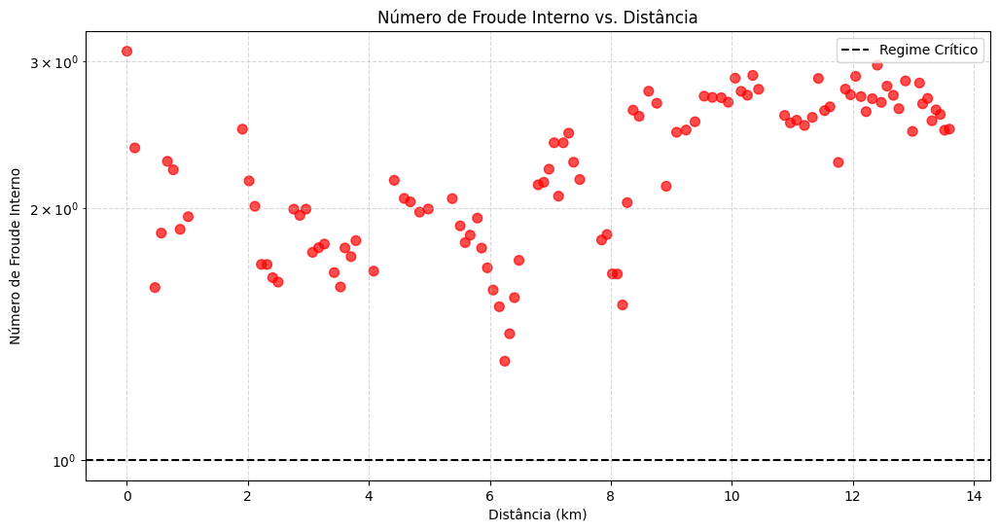

In [69]:
import matplotlib.pyplot as plt
import numpy as np

# --- Supondo que você já tenha os arrays froude_internos e distancias_froude definidos ---

# Crie o gráfico
fig, ax = plt.subplots(figsize=(12, 6))

# Defina as cores com base no número de Froude
# Azul para subcrítico (Fr_i < 1) e vermelho para supercrítico (Fr_i >= 1)
colors = np.where(froude_internos >= 1, 'red', 'blue')

# Crie o gráfico de dispersão
scatter = ax.scatter(distancias_froude, froude_internos, c=colors, s=50, alpha=0.7)

# Adicione uma linha horizontal para o regime crítico (Fr_i = 1)
ax.axhline(1.0, color='k', linestyle='--', linewidth=1.5, label='Regime Crítico')

# Defina o título e os rótulos dos eixos
ax.set_title('Número de Froude Interno vs. Distância')
ax.set_xlabel('Distância (km)')
ax.set_ylabel('Número de Froude Interno')
ax.set_yscale('log') # Usar a escala logarítmica

# Adicione a legenda e o grid
ax.legend()
ax.grid(True, which="both", ls="--", alpha=0.5)

# Salve o gráfico em um arquivo.
# Note que a linha plt.tight_layout() foi removida ou o rótulo foi simplificado.
plt.savefig('froude_vs_distance.png')

print("Gráfico 'froude_vs_distance.png' gerado com sucesso!")

In [76]:
import numpy as np
import matplotlib.pyplot as plt

# --- Loop para calcular o número de Froude interno para cada perfil ---
froude_internos = []
distancias_froude = []
g = 9.81
min_depth_limit = 2.0 

for i, perfil_id in enumerate(perfil_ids):
    # A profundidade da picnoclina
    h1 = smoothed_depths[i]
    
    # 1. Obter dados e ordenar
    mask_perfil = mtx_tj[:, 0] == perfil_id
    perfil_data_completo = mtx_tj[mask_perfil]
    
    if perfil_data_completo.size > 0:
        sort_idx = np.argsort(perfil_data_completo[:, 2])
        z_perfil = perfil_data_completo[sort_idx, 2]
        rho_perfil = perfil_data_completo[sort_idx, 5]
        prof_total_perfil = np.max(z_perfil)
    else:
        prof_total_perfil = np.nan
        froude_internos.append(np.nan)
        distancias_froude.append(distancias[i])
        continue

    # --- CÁLCULO ROBUSTO DE DENSIDADE DE PICO ---
    deep_data_mask = z_perfil > min_depth_limit
    rho_filtered = rho_perfil[deep_data_mask]
    rho_a, rho_b = np.nan, np.nan
    
    if len(rho_filtered) > 1:
        drho_dz = np.gradient(rho_filtered, z_perfil[deep_data_mask])
        idx_max = np.argmax(np.abs(drho_dz))
        
        # Garante que o pico não esteja na borda
        if idx_max > 0 and idx_max < len(rho_filtered) - 1:
            rho_a = rho_filtered[idx_max - 1] 
            rho_b = rho_filtered[idx_max + 1]
        elif idx_max == 0 and len(rho_filtered) > 1:
            # Caso o pico esteja no primeiro ponto (borda superior)
            rho_a = rho_filtered[idx_max] 
            rho_b = rho_filtered[idx_max + 1]
        # Caso o pico esteja na borda inferior, o rho_a e rho_b permanecerão nan, e o cálculo de Fr_i será ignorado.

    # 4. Calcular as médias de Velocidade (U1 e U2)
    mask_acima = (mtx_tj[:, 0] == perfil_id) & (mtx_tj[:, 2] <= h1)
    mask_abaixo = (mtx_tj[:, 0] == perfil_id) & (mtx_tj[:, 2] > h1)
    
    U1 = np.nanmean(vr[mask_acima]) if vr[mask_acima].size > 0 else np.nan
    U2 = np.nanmean(vr[mask_abaixo]) if vr[mask_abaixo].size > 0 else np.nan
    
    # 5. Cálculo do Froude Interno
    Fr_i = np.nan
    
    # Verifica validade: rho_b > rho_a e densidades válidas
    if not np.isnan(rho_a) and not np.isnan(rho_b) and (rho_b - rho_a) > 0 and h1 > 0 and not np.isnan(U1):
        
        # CORREÇÃO CRÍTICA: Se rho_a e rho_b forem anomalias de densidade (sigma_t),
        # A densidade de referência no denominador do g' deve ser 1000 + rho_a
        # MAS, assumindo que você está usando valores de densidade total (~1000), 
        # a fórmula mais estável é usar a densidade da pluma (rho_a) como referência.
        g_prime = g * (rho_b - rho_a) / rho_a
        
        if not np.isnan(U2):
            # Modelo de DUAS CAMADAS ATIVAS
            h2 = prof_total_perfil - h1
            if h2 > 0:
                denominador = np.sqrt(g_prime * ((h1 * h2) / (h1 + h2)))
                if denominador > 0:
                    Fr_i = np.abs(U1 - U2) / denominador
        else:
            # Modelo de CAMADA ÚNICA (se não houver U2)
            denominador = np.sqrt(g_prime * h1)
            if denominador > 0:
                Fr_i = np.abs(U1) / denominador
    
    # 6. Armazenar o resultado
    froude_internos.append(Fr_i)
    distancias_froude.append(distancias[i])
    
    # 7. Impressão para verificação
    print(f"Perfil {perfil_id}: Delta-rho={rho_b-rho_a:.4f}, Fr_i={Fr_i:.2f}")

# Converter a lista de resultados para um array numpy
froude_internos = np.array(froude_internos)
distancias_froude = np.array(distancias_froude)

Perfil 0.0: Delta-rho=0.6671, Fr_i=5.20
Perfil 1.0: Delta-rho=1.0020, Fr_i=3.71
Perfil 2.0: Delta-rho=0.9964, Fr_i=2.83
Perfil 3.0: Delta-rho=1.0164, Fr_i=3.22
Perfil 4.0: Delta-rho=0.7262, Fr_i=4.51
Perfil 5.0: Delta-rho=0.9202, Fr_i=4.18
Perfil 6.0: Delta-rho=0.9275, Fr_i=3.26
Perfil 7.0: Delta-rho=0.9728, Fr_i=3.19
Perfil 8.0: Delta-rho=1.4045, Fr_i=4.07
Perfil 9.0: Delta-rho=1.1033, Fr_i=3.82
Perfil 10.0: Delta-rho=1.1888, Fr_i=3.01
Perfil 11.0: Delta-rho=0.9715, Fr_i=3.05
Perfil 12.0: Delta-rho=0.8966, Fr_i=3.17
Perfil 13.0: Delta-rho=0.9057, Fr_i=3.00
Perfil 14.0: Delta-rho=1.1174, Fr_i=2.67
Perfil 15.0: Delta-rho=1.0450, Fr_i=3.23
Perfil 16.0: Delta-rho=1.1731, Fr_i=3.00
Perfil 17.0: Delta-rho=1.1631, Fr_i=2.97
Perfil 18.0: Delta-rho=1.3388, Fr_i=2.57
Perfil 19.0: Delta-rho=1.1341, Fr_i=2.84
Perfil 20.0: Delta-rho=1.2382, Fr_i=2.83
Perfil 21.0: Delta-rho=0.9588, Fr_i=2.86
Perfil 22.0: Delta-rho=0.7683, Fr_i=3.08
Perfil 23.0: Delta-rho=0.6921, Fr_i=3.60
Perfil 24.0: Delta-rho=0.9

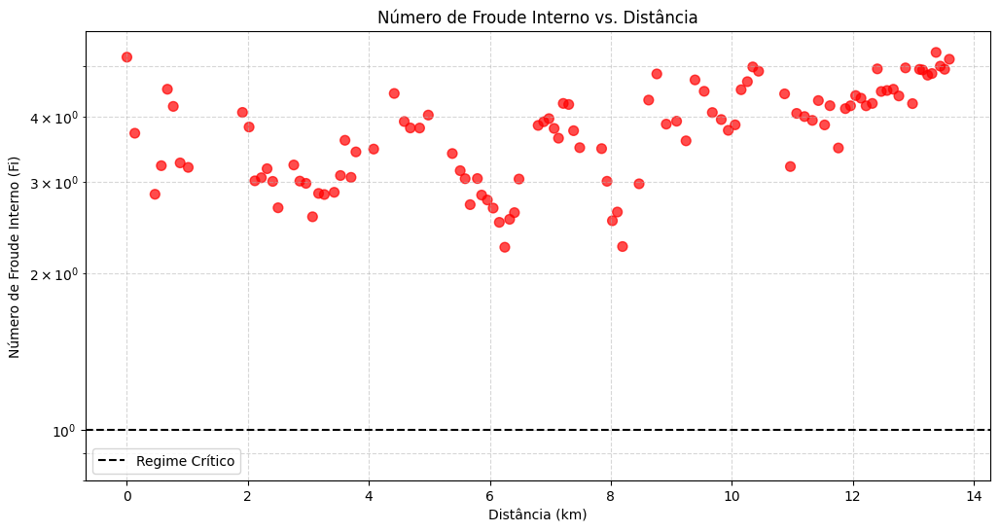

In [78]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Supondo que você já tem os arrays froude_internos e distancias_froude definidos

data_for_plot = pd.DataFrame({
    'Distance_km': distancias_froude,
    'Froude_Interno': froude_internos
})

# Remova valores NaN para garantir que o plot funcione
data_for_plot = data_for_plot.dropna(subset=['Froude_Interno'])

fig, ax = plt.subplots(figsize=(12, 6))

# Define cores: Vermelho para Supercrítico (>= 1), Azul para Subcrítico (< 1)
colors = np.where(data_for_plot['Froude_Interno'] >= 1, 'red', 'blue')

# Cria o scatter plot
ax.scatter(data_for_plot['Distance_km'], data_for_plot['Froude_Interno'], 
           c=colors, s=50, alpha=0.7)

# Adiciona a linha horizontal para o Regime Crítico (Fr_i = 1)
ax.axhline(1.0, color='k', linestyle='--', linewidth=1.5, label='Regime Crítico')

# Define o título e os rótulos dos eixos
ax.set_title('Número de Froude Interno vs. Distância')
ax.set_xlabel('Distância (km)')
ax.set_ylabel('Número de Froude Interno (Fi)') # CORRIGIDO: Removido o LaTeX ($$Fr_i$$)

# Usa escala logarítmica para melhor visualização da variação dos valores altos
ax.set_yscale('log')
ax.set_ylim(0.8, data_for_plot['Froude_Interno'].max() * 1.1)

# Adiciona legenda e grid
ax.legend()
ax.grid(True, which="both", ls="--", alpha=0.5)

plt.show()

In [79]:
import numpy as np
import matplotlib.pyplot as plt

# --- Loop para calcular o número de Froude interno para cada perfil ---
froude_internos = []
distancias_froude = []
g = 9.81
min_depth_limit = 2.0 

for i, perfil_id in enumerate(perfil_ids):
    h1 = smoothed_depths[i]
    
    # 1. Obter dados
    mask_perfil = mtx_tj[:, 0] == perfil_id
    perfil_data_completo = mtx_tj[mask_perfil]
    
    if perfil_data_completo.size > 0:
        sort_idx = np.argsort(perfil_data_completo[:, 2])
        z_perfil = perfil_data_completo[sort_idx, 2]
        rho_perfil = perfil_data_completo[sort_idx, 5]
        prof_total_perfil = np.max(z_perfil)
    else:
        froude_internos.append(np.nan)
        distancias_froude.append(distancias[i])
        continue

    # 2. CÁLCULO DA DENSIDADE DE PICO
    deep_data_mask = z_perfil > min_depth_limit
    rho_filtered = rho_perfil[deep_data_mask]
    rho_a, rho_b = np.nan, np.nan
    
    if len(rho_filtered) > 1:
        drho_dz = np.gradient(rho_filtered, z_perfil[deep_data_mask])
        idx_max = np.argmax(np.abs(drho_dz))
        
        if idx_max >= 0 and idx_max < len(rho_filtered) - 1:
            rho_a = rho_filtered[idx_max]   
            rho_b = rho_filtered[idx_max + 1]
    
    # 3. VELOCIDADES
    mask_acima = (mtx_tj[:, 0] == perfil_id) & (mtx_tj[:, 2] <= h1)
    mask_abaixo = (mtx_tj[:, 0] == perfil_id) & (mtx_tj[:, 2] > h1)
    U1 = np.nanmean(vr[mask_acima]) if vr[mask_acima].size > 0 else np.nan
    U2 = np.nanmean(vr[mask_abaixo]) if vr[mask_abaixo].size > 0 else np.nan
    
    # 4. CÁLCULO FINAL DO FROUDE
    Fr_i = np.nan
    
    if not np.isnan(rho_a) and not np.isnan(rho_b) and (rho_b - rho_a) > 0 and h1 > 0 and not np.isnan(U1):
        
        # CORREÇÃO CRÍTICA: G' calculado com densidade de referência 1000
        # Isso garante que a flutuabilidade não seja subestimada.
        g_prime = g * (rho_b - rho_a) / 1000.0 
        
        if not np.isnan(U2):
            # Modelo de DUAS CAMADAS ATIVAS
            h2 = prof_total_perfil - h1
            if h2 > 0:
                denominador = np.sqrt(g_prime * ((h1 * h2) / (h1 + h2)))
                if denominador > 0:
                    Fr_i = np.abs(U1 - U2) / denominador
        else:
            # Modelo de CAMADA ÚNICA (se U2 é nan)
            denominador = np.sqrt(g_prime * h1)
            if denominador > 0:
                Fr_i = np.abs(U1) / denominador
    
    # 5. Armazenar e Imprimir
    froude_internos.append(Fr_i)
    distancias_froude.append(distancias[i])
    
    print(f"Perfil {perfil_id}: Delta-rho={rho_b-rho_a:.4f}, Fr_i={Fr_i:.2f}")

# Converter a lista de resultados para um array numpy
froude_internos = np.array(froude_internos)
distancias_froude = np.array(distancias_froude)

Perfil 0.0: Delta-rho=0.3794, Fr_i=6.87
Perfil 1.0: Delta-rho=0.4333, Fr_i=5.63
Perfil 2.0: Delta-rho=0.5800, Fr_i=3.70
Perfil 3.0: Delta-rho=0.4961, Fr_i=4.59
Perfil 4.0: Delta-rho=0.3597, Fr_i=6.38
Perfil 5.0: Delta-rho=0.4047, Fr_i=6.28
Perfil 6.0: Delta-rho=0.4761, Fr_i=4.53
Perfil 7.0: Delta-rho=0.4804, Fr_i=4.52
Perfil 8.0: Delta-rho=0.6297, Fr_i=6.06
Perfil 9.0: Delta-rho=0.5853, Fr_i=5.22
Perfil 10.0: Delta-rho=0.5621, Fr_i=4.36
Perfil 11.0: Delta-rho=0.5105, Fr_i=4.19
Perfil 12.0: Delta-rho=0.4320, Fr_i=4.55
Perfil 13.0: Delta-rho=0.4441, Fr_i=4.27
Perfil 14.0: Delta-rho=0.5868, Fr_i=3.67
Perfil 15.0: Delta-rho=0.5016, Fr_i=4.64
Perfil 16.0: Delta-rho=0.6210, Fr_i=4.11
Perfil 17.0: Delta-rho=0.5352, Fr_i=4.37
Perfil 18.0: Delta-rho=0.6455, Fr_i=3.68
Perfil 19.0: Delta-rho=0.6295, Fr_i=3.81
Perfil 20.0: Delta-rho=0.5133, Fr_i=4.38
Perfil 21.0: Delta-rho=0.4616, Fr_i=4.11
Perfil 22.0: Delta-rho=0.3638, Fr_i=4.46
Perfil 23.0: Delta-rho=0.3254, Fr_i=5.23
Perfil 24.0: Delta-rho=0.4

## Abandomei o gemini. vamos voltar p chatGPT

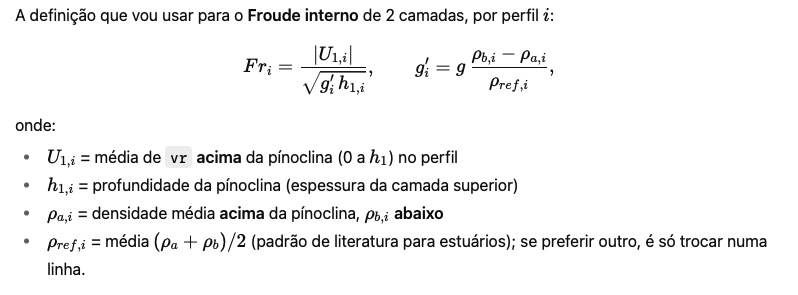


In [80]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

g = 9.81  # m/s²

# Garante que tudo é np.array
x = np.asarray(x)                 # km
z = np.asarray(z)                 # m (positivo p/ baixo)
vr = np.asarray(vr)               # m/s (ao longo do canal)

mtx_tj = np.asarray(mtx_tj)       # col 1=dist (km), 2=prof m, 5=ρ kg/m³
distancias = np.asarray(distancias)         # km
smoothed_depths = np.asarray(smoothed_depths)  # m

# Tolerância horizontal para "juntar" pontos do mesmo perfil.
# Uso a meia distância média entre pínoclinas como janela.
dx_med = np.nanmedian(np.diff(np.unique(np.round(distancias, 5))))
tol_x = 0.5 * dx_med if np.isfinite(dx_med) else 0.05  # km (fallback 50 m)
print(f"Tolerância horizontal estimada: {tol_x:.3f} km")

def nearest_pycnocline_depth(x0):
    """Retorna (h1, ok) para a distância x0 (km).
    h1 é a profundidade da pínoclina (m, >0). ok=False se não encontrar perto."""
    if distancias.size == 0:
        return np.nan, False
    j = np.argmin(np.abs(distancias - x0))
    if np.abs(distancias[j] - x0) <= tol_x:
        return float(smoothed_depths[j]), True
    return np.nan, False


Tolerância horizontal estimada: 0.050 km


In [81]:
def compute_profile_metrics(x0):
    """Calcula métricas do perfil centrado em x0 (km). 
    Retorna dict ou None se dados insuficientes."""
    # Profundidade da pínoclina
    h1, ok = nearest_pycnocline_depth(x0)
    if not ok or not np.isfinite(h1) or h1 <= 0:
        return None  # sem pínoclina válida

    # Seleção de pontos de velocidade do perfil
    sel_v = np.abs(x - x0) <= tol_x
    if sel_v.sum() < 5:
        return None
    # Camada superior = z <= h1 (z é positivo p/ baixo)
    sel_v_upper = sel_v & (z <= h1)
    if sel_v_upper.sum() < 3:
        return None
    U1 = np.nanmean(vr[sel_v_upper])  # m/s

    # Seleção de densidade do perfil
    dist_rho = mtx_tj[:, 1]
    z_rho    = mtx_tj[:, 2]
    rho      = mtx_tj[:, 5]

    sel_r = np.abs(dist_rho - x0) <= tol_x
    if sel_r.sum() < 5:
        return None

    # Camadas p/ densidade
    sel_r_upper = sel_r & (z_rho <= h1)
    sel_r_lower = sel_r & (z_rho >  h1)

    if sel_r_upper.sum() < 3 or sel_r_lower.sum() < 3:
        return None

    rho_a = np.nanmean(rho[sel_r_upper])  # kg/m³
    rho_b = np.nanmean(rho[sel_r_lower])  # kg/m³
    if not (np.isfinite(rho_a) and np.isfinite(rho_b)) or rho_b <= rho_a:
        # Se rho_b <= rho_a algo está inconsistente para 2-camadas estáveis
        return None

    rho_ref = 0.5 * (rho_a + rho_b)  # escolha padrão
    gprime = g * (rho_b - rho_a) / rho_ref  # m/s²

    Fr = np.abs(U1) / np.sqrt(gprime * h1)

    return {
        "x": float(x0),
        "h1": float(h1),
        "U1": float(U1),
        "rho_a": float(rho_a),
        "rho_b": float(rho_b),
        "gprime": float(gprime),
        "Fr": float(Fr),
    }


In [82]:
# Vou usar as próprias 'distancias' como centros de perfis
xs_centers = np.unique(np.round(distancias, 5))

rows = []
for xc in xs_centers:
    out = compute_profile_metrics(xc)
    if out is not None:
        rows.append(out)

fr_df = pd.DataFrame(rows).sort_values("x").reset_index(drop=True)
fr_df["class"] = np.where(fr_df["Fr"] < 1, "subcritical", "supercritical")
fr_df.head(12)


,x,h1,U1,rho_a,rho_b,gprime,Fr,class
0,0.00000,6.732171,-1.555950,1005.967135,1007.863900,0.018479,4.411369,supercritical
1,0.13047,7.732171,-1.440320,1005.625824,1008.100742,0.024113,3.335636,supercritical
2,0.46389,10.232171,-1.241754,1005.845977,1008.940272,0.030132,2.236329,supercritical
3,0.56840,10.932171,-1.190352,1006.056984,1009.067866,0.029315,2.102698,supercritical
4,0.66907,12.332171,-1.128203,1006.497003,1009.344124,0.027711,1.929937,supercritical
5,0.76657,13.432171,-1.080575,1006.410491,1009.657163,0.031596,1.658692,supercritical
6,0.88010,13.532171,-1.135928,1006.155371,1008.911527,0.026836,1.884996,supercritical
7,1.01359,13.232171,-1.152417,1006.092483,1008.681844,0.025215,1.995086,supercritical
8,1.91057,12.432171,-1.079485,1006.780256,1010.541162,0.036578,1.600792,supercritical
9,2.01995,11.532171,-1.120963,1006.367316,1009.817058,0.033570,1.801598,supercritical


In [83]:
fr_df


,x,h1,U1,rho_a,rho_b,gprime,Fr,class
0,0.00000,6.732171,-1.555950,1005.967135,1007.863900,0.018479,4.411369,supercritical
1,0.13047,7.732171,-1.440320,1005.625824,1008.100742,0.024113,3.335636,supercritical
2,0.46389,10.232171,-1.241754,1005.845977,1008.940272,0.030132,2.236329,supercritical
3,0.56840,10.932171,-1.190352,1006.056984,1009.067866,0.029315,2.102698,supercritical
4,0.66907,12.332171,-1.128203,1006.497003,1009.344124,0.027711,1.929937,supercritical
...,...,...,...,...,...,...,...,...
69,9.67958,3.932171,-1.347812,1012.714590,1019.615981,0.066626,2.633252,supercritical
70,9.82717,3.932171,-1.259686,1013.785339,1020.099098,0.060906,2.574042,supercritical
71,9.94333,3.432171,-1.319607,1012.860516,1019.818792,0.067163,2.748490,supercritical
72,10.05677,3.032171,-1.303216,1013.787390,1019.844117,0.058434,3.096046,supercritical


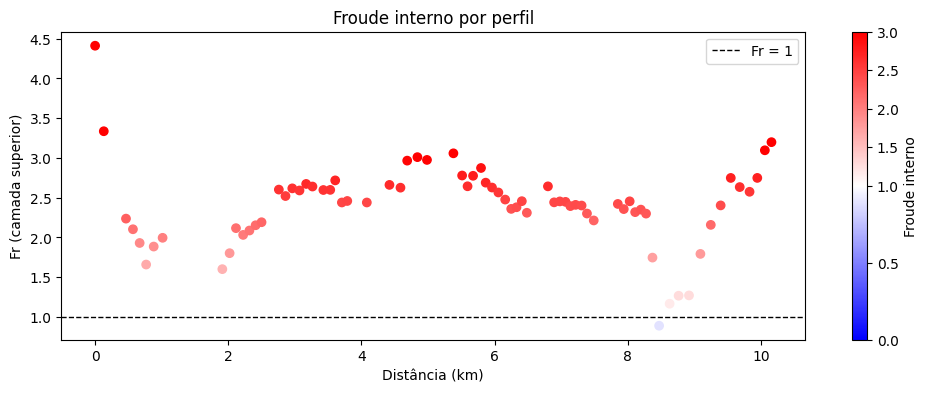

In [84]:
plt.figure(figsize=(12,4))
norm = TwoSlopeNorm(vmin=0, vcenter=1, vmax=np.clip(fr_df["Fr"].max(), 1.2, 3.0))
sc = plt.scatter(fr_df["x"], fr_df["Fr"], c=fr_df["Fr"], cmap="bwr", norm=norm)
plt.axhline(1.0, color="k", lw=1, ls="--", label="Fr = 1")
plt.colorbar(sc, label="Froude interno")
plt.xlabel("Distância (km)")
plt.ylabel("Fr (camada superior)")
plt.title("Froude interno por perfil")
plt.legend()
plt.show()


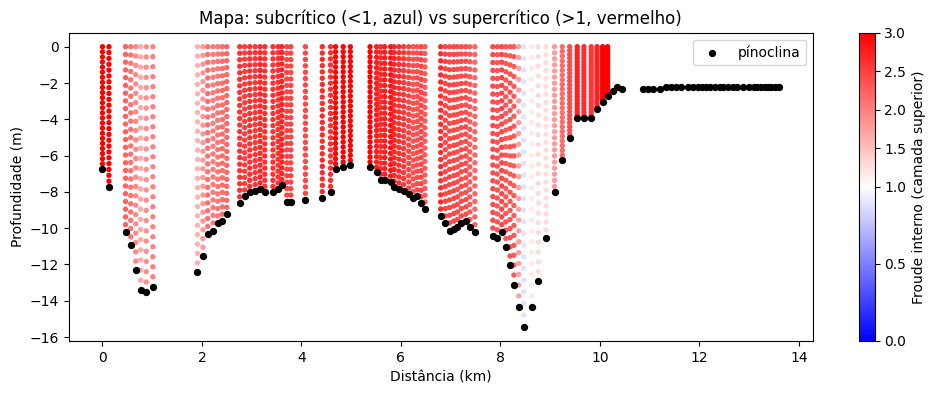

In [85]:
# Pontos virtuais só para desenhar a faixa 0→h1 em cada perfil
xp, zp, val = [], [], []
for _, r in fr_df.iterrows():
    xi = r["x"]; h1 = r["h1"]; Fri = r["Fr"]
    # 25 pontos da superfície até a pínoclina
    zz = np.linspace(0, h1, 25)
    xp.append(np.full_like(zz, xi))
    zp.append(zz)
    val.append(np.full_like(zz, Fri))

xp = np.concatenate(xp)
zp = np.concatenate(zp)
val = np.concatenate(val)

plt.figure(figsize=(12,4))
norm = TwoSlopeNorm(vmin=0, vcenter=1, vmax=np.clip(np.nanmax(val), 1.2, 3.0))
sc = plt.scatter(xp, -zp, s=8, c=val, cmap="bwr", norm=norm)
plt.scatter(distancias, -smoothed_depths, color='k', s=18, marker='o', label='pínoclina')
plt.colorbar(sc, label="Froude interno (camada superior)")
plt.xlabel("Distância (km)")
plt.ylabel("Profundidade (m)")
plt.title("Mapa: subcrítico (<1, azul) vs supercrítico (>1, vermelho)")
plt.legend()
plt.show()


In [86]:
def compute_profile_metrics(x0):
    """Calcula métricas do perfil centrado em x0 (km). 
    Retorna dict ou None se dados insuficientes."""
    # Profundidade da pínoclina
    h1, ok = nearest_pycnocline_depth(x0)
    if not ok or not np.isfinite(h1) or h1 <= 0:
        return None  # sem pínoclina válida

    # Seleção de pontos de velocidade do perfil
    sel_v = np.abs(x - x0) <= tol_x
    if sel_v.sum() < 5:
        return None

    # Camada superior = z <= h1 (z é positivo p/ baixo)
    sel_v_upper = sel_v & (z <= h1)
    if sel_v_upper.sum() < 3:
        return None

    U1 = np.nanmean(vr[sel_v_upper])  # m/s

    # Seleção de densidade do perfil
    dist_rho = mtx_tj[:, 1]
    z_rho    = mtx_tj[:, 2]
    rho      = mtx_tj[:, 5]

    sel_r = np.abs(dist_rho - x0) <= tol_x
    if sel_r.sum() < 5:
        return None

    # Camadas p/ densidade
    sel_r_upper = sel_r & (z_rho <= h1)
    sel_r_lower = sel_r & (z_rho >  h1)

    # Filtros básicos contra outliers absurdos (opcional)
    # rho = np.clip(rho, 990, 1035)

    if sel_r_upper.sum() < 3 or sel_r_lower.sum() < 3:
        return None

    rho_a = np.nanmean(rho[sel_r_upper])  # kg/m³
    rho_b = np.nanmean(rho[sel_r_lower])  # kg/m³
    if not (np.isfinite(rho_a) and np.isfinite(rho_b)):
        return None

    # Para estabilidade estratificada esperamos rho_b > rho_a; se não, descarta
    if rho_b <= rho_a:
        return None

    rho_ref = 0.5 * (rho_a + rho_b)      # referência "clássica" de estuários
    gprime = g * (rho_b - rho_a) / rho_ref  # m/s²

    Fr = np.abs(U1) / np.sqrt(gprime * h1)

    return {
        "x": float(x0),
        "h1": float(h1),
        "U1": float(U1),
        "rho_a": float(rho_a),
        "rho_b": float(rho_b),
        "gprime": float(gprime),
        "Fr": float(Fr),
    }


In [87]:
import pandas as pd
from matplotlib.colors import TwoSlopeNorm
import matplotlib.pyplot as plt
import numpy as np

# centros de perfil: uso as próprias distâncias onde você tem a pínoclina
xs_centers = np.unique(np.round(distancias, 5))

rows = []
skipped = 0
for xc in xs_centers:
    out = compute_profile_metrics(xc)
    if out is None:
        skipped += 1
    else:
        rows.append(out)

fr_df = pd.DataFrame(rows).sort_values("x").reset_index(drop=True)
if not fr_df.empty:
    fr_df["class"] = np.where(fr_df["Fr"] < 1, "subcritical", "supercritical")

print(f"Perfis alvo: {len(xs_centers)} | Perfis válidos: {len(fr_df)} | Ignorados: {skipped}")
display(fr_df.head(12))


Perfis alvo: 107 | Perfis válidos: 74 | Ignorados: 33


,x,h1,U1,rho_a,rho_b,gprime,Fr,class
0,0.00000,6.732171,-1.555950,1005.967135,1007.863900,0.018479,4.411369,supercritical
1,0.13047,7.732171,-1.440320,1005.625824,1008.100742,0.024113,3.335636,supercritical
2,0.46389,10.232171,-1.241754,1005.845977,1008.940272,0.030132,2.236329,supercritical
3,0.56840,10.932171,-1.190352,1006.056984,1009.067866,0.029315,2.102698,supercritical
4,0.66907,12.332171,-1.128203,1006.497003,1009.344124,0.027711,1.929937,supercritical
5,0.76657,13.432171,-1.080575,1006.410491,1009.657163,0.031596,1.658692,supercritical
6,0.88010,13.532171,-1.135928,1006.155371,1008.911527,0.026836,1.884996,supercritical
7,1.01359,13.232171,-1.152417,1006.092483,1008.681844,0.025215,1.995086,supercritical
8,1.91057,12.432171,-1.079485,1006.780256,1010.541162,0.036578,1.600792,supercritical
9,2.01995,11.532171,-1.120963,1006.367316,1009.817058,0.033570,1.801598,supercritical


In [88]:
def compute_profile_metrics_v2(x0):
    """Calcula métricas do perfil centrado em x0 (km).
    Versão revisada:
      - usa mediana
      - rho_ref fixo em 1000
      - garante gradiente mínimo se rho_b <= rho_a
    """
    # Profundidade da pínoclina
    h1, ok = nearest_pycnocline_depth(x0)
    if not ok or not np.isfinite(h1) or h1 <= 0:
        return None

    # Seleção de pontos de velocidade do perfil
    sel_v = np.abs(x - x0) <= tol_x
    if sel_v.sum() < 5:
        return None

    sel_v_upper = sel_v & (z <= h1)
    if sel_v_upper.sum() < 3:
        return None

    U1 = np.nanmedian(vr[sel_v_upper])  # m/s

    # Seleção de densidade
    dist_rho = mtx_tj[:, 1]
    z_rho    = mtx_tj[:, 2]
    rho      = mtx_tj[:, 5]

    sel_r = np.abs(dist_rho - x0) <= tol_x
    if sel_r.sum() < 5:
        return None

    sel_r_upper = sel_r & (z_rho <= h1)
    sel_r_lower = sel_r & (z_rho >  h1)
    if sel_r_upper.sum() < 3 or sel_r_lower.sum() < 3:
        return None

    rho_a = np.nanmedian(rho[sel_r_upper])
    rho_b = np.nanmedian(rho[sel_r_lower])

    # força gradiente mínimo
    if not (np.isfinite(rho_a) and np.isfinite(rho_b)):
        return None
    if rho_b <= rho_a:
        rho_b = rho_a + 0.01

    rho_ref = 1000.0  # referência fixa
    gprime = g * (rho_b - rho_a) / rho_ref

    Fr = np.abs(U1) / np.sqrt(gprime * h1)

    return {
        "x": float(x0),
        "h1": float(h1),
        "U1": float(U1),
        "rho_a": float(rho_a),
        "rho_b": float(rho_b),
        "gprime": float(gprime),
        "Fr": float(Fr),
    }


In [89]:
rows = []
skipped = 0
for xc in xs_centers:
    out = compute_profile_metrics_v2(xc)
    if out is None:
        skipped += 1
    else:
        rows.append(out)

fr_df = pd.DataFrame(rows).sort_values("x").reset_index(drop=True)
if not fr_df.empty:
    fr_df["class"] = np.where(fr_df["Fr"] < 1, "subcritical", "supercritical")

print(f"Perfis alvo: {len(xs_centers)} | Perfis válidos: {len(fr_df)} | Ignorados: {skipped}")
display(fr_df.head(12))


Perfis alvo: 107 | Perfis válidos: 74 | Ignorados: 33


,x,h1,U1,rho_a,rho_b,gprime,Fr,class
0,0.00000,6.732171,-1.602507,1006.014455,1007.979282,0.019275,4.448623,supercritical
1,0.13047,7.732171,-1.461304,1005.595569,1008.015489,0.023739,3.410789,supercritical
2,0.46389,10.232171,-1.248037,1005.591220,1008.755828,0.031045,2.214364,supercritical
3,0.56840,10.932171,-1.179321,1005.844304,1009.188006,0.032802,1.969384,supercritical
4,0.66907,12.332171,-1.055314,1006.198658,1009.464605,0.032039,1.678892,supercritical
5,0.76657,13.432171,-1.054263,1005.961028,1009.755148,0.037220,1.491028,supercritical
6,0.88010,13.532171,-1.093927,1005.891231,1009.043645,0.030925,1.691019,supercritical
7,1.01359,13.232171,-1.083871,1005.978471,1008.602264,0.025739,1.857218,supercritical
8,1.91057,12.432171,-1.155903,1006.451730,1010.585595,0.040553,1.627928,supercritical
9,2.01995,11.532171,-1.138969,1006.349369,1010.042698,0.036232,1.762029,supercritical


In [90]:
def compute_profile_metrics_v3(x0):
    """Calcula métricas do perfil centrado em x0 (km).
    Versão 3:
      - U1 só até metade da camada superior (0 → h1/2)
      - rho_ref = 1000
      - usa mediana
      - garante gradiente mínimo
    """
    # profundidade da picnoclina
    h1, ok = nearest_pycnocline_depth(x0)
    if not ok or not np.isfinite(h1) or h1 <= 0:
        return None

    # seleção de velocidade
    sel_v = np.abs(x - x0) <= tol_x
    if sel_v.sum() < 5:
        return None

    sel_v_upper = sel_v & (z <= h1/2)   # só metade da camada
    if sel_v_upper.sum() < 3:
        return None

    U1 = np.nanmedian(vr[sel_v_upper])

    # seleção de densidade
    dist_rho = mtx_tj[:, 1]
    z_rho    = mtx_tj[:, 2]
    rho      = mtx_tj[:, 5]

    sel_r = np.abs(dist_rho - x0) <= tol_x
    if sel_r.sum() < 5:
        return None

    sel_r_upper = sel_r & (z_rho <= h1)
    sel_r_lower = sel_r & (z_rho >  h1)
    if sel_r_upper.sum() < 3 or sel_r_lower.sum() < 3:
        return None

    rho_a = np.nanmedian(rho[sel_r_upper])
    rho_b = np.nanmedian(rho[sel_r_lower])

    if not (np.isfinite(rho_a) and np.isfinite(rho_b)):
        return None
    if rho_b <= rho_a:
        rho_b = rho_a + 0.01

    rho_ref = 1000.0
    gprime = g * (rho_b - rho_a) / rho_ref

    Fr = np.abs(U1) / np.sqrt(gprime * h1)

    return {
        "x": float(x0),
        "h1": float(h1),
        "U1": float(U1),
        "rho_a": float(rho_a),
        "rho_b": float(rho_b),
        "gprime": float(gprime),
        "Fr": float(Fr),
    }


Perfis alvo: 107 | Perfis válidos: 67 | Ignorados: 40


,x,h1,U1,rho_a,rho_b,gprime,Fr,class
0,0.00000,6.732171,-1.720381,1006.014455,1007.979282,0.019275,4.775847,supercritical
1,0.13047,7.732171,-1.652955,1005.595569,1008.015489,0.023739,3.858116,supercritical
2,0.46389,10.232171,-1.565405,1005.591220,1008.755828,0.031045,2.777463,supercritical
3,0.56840,10.932171,-1.500417,1005.844304,1009.188006,0.032802,2.505592,supercritical
4,0.66907,12.332171,-1.481201,1006.198658,1009.464605,0.032039,2.356433,supercritical
5,0.76657,13.432171,-1.348193,1005.961028,1009.755148,0.037220,1.906728,supercritical
6,0.88010,13.532171,-1.402240,1005.891231,1009.043645,0.030925,2.167616,supercritical
7,1.01359,13.232171,-1.408995,1005.978471,1008.602264,0.025739,2.414319,supercritical
8,1.91057,12.432171,-1.368940,1006.451730,1010.585595,0.040553,1.927961,supercritical
9,2.01995,11.532171,-1.360817,1006.349369,1010.042698,0.036232,2.105235,supercritical


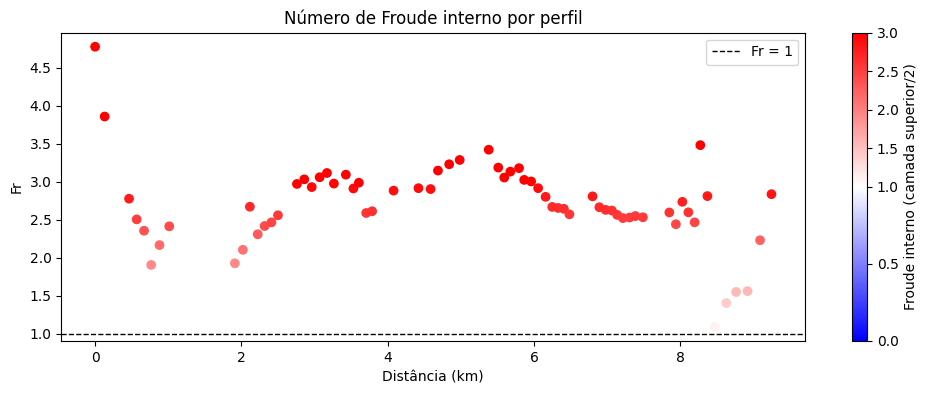

In [91]:
rows = []
skipped = 0
for xc in xs_centers:
    out = compute_profile_metrics_v3(xc)
    if out is None:
        skipped += 1
    else:
        rows.append(out)

fr_df = pd.DataFrame(rows).sort_values("x").reset_index(drop=True)
if not fr_df.empty:
    fr_df["class"] = np.where(fr_df["Fr"] < 1, "subcritical", "supercritical")

print(f"Perfis alvo: {len(xs_centers)} | Perfis válidos: {len(fr_df)} | Ignorados: {skipped}")
display(fr_df.head(12))

# gráfico
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

plt.figure(figsize=(12,4))
norm = TwoSlopeNorm(vmin=0, vcenter=1, vmax=np.clip(fr_df["Fr"].max(), 1.5, 3.0))
sc = plt.scatter(fr_df["x"], fr_df["Fr"], c=fr_df["Fr"], cmap="bwr", norm=norm)
plt.axhline(1.0, color="k", lw=1, ls="--", label="Fr = 1")
plt.colorbar(sc, label="Froude interno (camada superior/2)")
plt.xlabel("Distância (km)")
plt.ylabel("Fr")
plt.title("Número de Froude interno por perfil")
plt.legend()
plt.show()


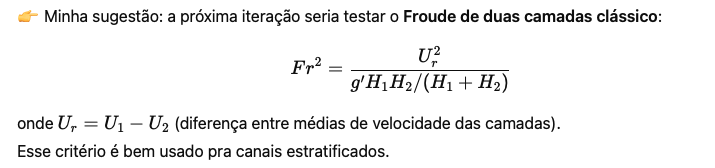

In [97]:
def compute_profile_metrics_two_layer(x0):
    """Calcula Froude interno clássico de duas camadas para o perfil em x0."""
    # profundidade da picnoclina
    h1, ok = nearest_pycnocline_depth(x0)
    if not ok or not np.isfinite(h1) or h1 <= 0:
        return None

    # profundidade total: pegar o maior valor de z no perfil
    mask_profile = np.abs(mtx_tj[:, 1] - x0) <= tol_x
    if mask_profile.sum() < 5:
        return None
    depth_total = np.nanmax(mtx_tj[mask_profile, 2])
    if not np.isfinite(depth_total):
        return None

    H1 = h1
    H2 = depth_total - h1
    if H1 <= 0 or H2 <= 0:
        return None

    # velocidades
    sel_v = np.abs(x - x0) <= tol_x
    if sel_v.sum() < 5:
        return None

    U1 = np.nanmedian(vr[sel_v & (z <= h1)])
    U2 = np.nanmedian(vr[sel_v & (z >  h1)])
    if not (np.isfinite(U1) and np.isfinite(U2)):
        return None

    Ur = U1 - U2

    # densidades
    dist_rho = mtx_tj[:, 1]
    z_rho    = mtx_tj[:, 2]
    rho      = mtx_tj[:, 5]
    sel_r = np.abs(dist_rho - x0) <= tol_x
    if sel_r.sum() < 5:
        return None

    rho_a = np.nanmedian(rho[sel_r & (z_rho <= h1)])
    rho_b = np.nanmedian(rho[sel_r & (z_rho >  h1)])
    if not (np.isfinite(rho_a) and np.isfinite(rho_b)):
        return None
    if rho_b <= rho_a:
        rho_b = rho_a + 0.01

    rho_ref = 1000.0
    gprime = g * (rho_b - rho_a) / rho_ref

    # Froude clássico de duas camadas
    Fr2 = (Ur**2) / (gprime * H1 * H2 / (H1 + H2))
    Fr = np.sqrt(Fr2)

    return {
        "x": float(x0),
        "h1": float(H1),
        "h2": float(H2),
        "U1": float(U1),
        "U2": float(U2),
        "Ur": float(Ur),
        "rho_a": float(rho_a),
        "rho_b": float(rho_b),
        "gprime": float(gprime),
        "Fr": float(Fr),
    }



In [98]:
rows = []
for xc in xs_centers:
    out = compute_profile_metrics_two_layer(xc)
    if out is not None:
        rows.append(out)

fr2_df = pd.DataFrame(rows).sort_values("x").reset_index(drop=True)
if not fr2_df.empty:
    fr2_df["class"] = np.where(fr2_df["Fr"] < 1, "subcritical", "supercritical")

print(f"Perfis válidos: {len(fr2_df)}")
display(fr2_df.head(10))


Perfis válidos: 107


,x,h1,h2,U1,U2,Ur,rho_a,rho_b,gprime,Fr,class
0,0.00000,6.732171,5.0,-1.602507,-0.824924,-0.777583,1006.014455,1007.979282,0.019275,3.306561,supercritical
1,0.13047,7.732171,5.5,-1.461304,-0.780003,-0.681301,1005.595569,1008.015489,0.023739,2.466537,supercritical
2,0.46389,10.232171,5.0,-1.248037,-0.766455,-0.481582,1005.591220,1008.755828,0.031045,1.491378,supercritical
3,0.56840,10.932171,5.3,-1.179321,-0.594216,-0.585105,1005.844304,1009.188006,0.032802,1.709947,supercritical
4,0.66907,12.332171,3.4,-1.055314,-0.501372,-0.553942,1006.198658,1009.464605,0.032039,1.895659,supercritical
5,0.76657,13.432171,3.3,-1.054263,-0.426980,-0.627283,1005.961028,1009.755148,0.037220,1.997652,supercritical
6,0.88010,13.532171,3.2,-1.093927,-0.648490,-0.445437,1005.891231,1009.043645,0.030925,1.574519,supercritical
7,1.01359,13.232171,3.5,-1.083871,-0.637148,-0.446723,1005.978471,1008.602264,0.025739,1.673654,supercritical
8,1.91057,12.432171,2.8,-1.155903,-0.349709,-0.806194,1006.451730,1010.585595,0.040553,2.648228,supercritical
9,2.01995,11.532171,3.7,-1.138969,-0.461310,-0.677659,1006.349369,1010.042698,0.036232,2.127122,supercritical


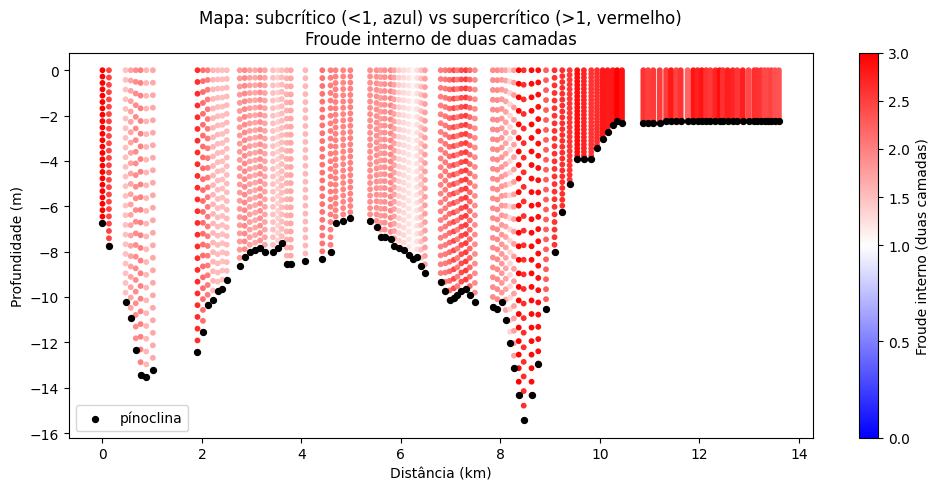

In [99]:
# Geração de pontos "virtuais" para pintar a camada superior
xp, zp, val = [], [], []
for _, r in fr2_df.iterrows():
    xi = r["x"]
    h1 = r["h1"]
    Fri = r["Fr"]
    # 25 pontos da superfície até a pínoclina
    zz = np.linspace(0, h1, 25)
    xp.append(np.full_like(zz, xi))
    zp.append(zz)
    val.append(np.full_like(zz, Fri))

xp = np.concatenate(xp)
zp = np.concatenate(zp)
val = np.concatenate(val)

# plot
plt.figure(figsize=(12,5))
from matplotlib.colors import TwoSlopeNorm
norm = TwoSlopeNorm(vmin=0, vcenter=1, vmax=np.clip(np.nanmax(val), 1.5, 3.0))
sc = plt.scatter(xp, -zp, s=10, c=val, cmap="bwr", norm=norm)

plt.scatter(distancias, -smoothed_depths, color='k', s=18, marker='o', label='pínoclina')
plt.colorbar(sc, label="Froude interno (duas camadas)")
plt.xlabel("Distância (km)")
plt.ylabel("Profundidade (m)")
plt.title("Mapa: subcrítico (<1, azul) vs supercrítico (>1, vermelho)\nFroude interno de duas camadas")
plt.legend()
plt.show()


In [101]:
# use a batimetria que você já plota no plot_sets(ax)
bed_x = np.asarray(dist, dtype=float)          # km
bed_z = np.asarray(depth_drift, dtype=float)   # m (positiva p/ baixo)

# garantir ordenação por distância
ord_bed = np.argsort(bed_x)
bed_x = bed_x[ord_bed]
bed_z = bed_z[ord_bed]

def total_depth_at_x(x0):
    """Profundidade do fundo (m) em x0 (km), por interpolação na batimetria."""
    return float(np.interp(x0, bed_x, bed_z))


In [102]:
def compute_profile_metrics_two_layer_v2(x0, min_layer=0.5):
    """Froude interno clássico (duas camadas) no perfil x0, com H2 da batimetria."""
    # profundidade da pínoclina
    h1, ok = nearest_pycnocline_depth(x0)
    if not ok or not np.isfinite(h1) or h1 <= 0:
        return None

    # profundidade total do canal via batimetria (dist/depth_drift)
    Htot = total_depth_at_x(x0)
    if not np.isfinite(Htot) or Htot <= h1:
        return None

    H1 = max(h1, min_layer)
    H2 = max(Htot - h1, min_layer)

    # velocidades por camada (medianas)
    sel_v = np.abs(x - x0) <= tol_x
    if sel_v.sum() < 5:
        return None
    U1 = np.nanmedian(vr[sel_v & (z <= h1)])
    U2 = np.nanmedian(vr[sel_v & (z >  h1)])
    if not (np.isfinite(U1) and np.isfinite(U2)):
        return None
    Ur = U1 - U2

    # densidades por camada (medianas)
    dist_rho = mtx_tj[:, 1]; z_rho = mtx_tj[:, 2]; rho = mtx_tj[:, 5]
    sel_r = np.abs(dist_rho - x0) <= tol_x
    if sel_r.sum() < 5:
        return None
    rho_a = np.nanmedian(rho[sel_r & (z_rho <= h1)])
    rho_b = np.nanmedian(rho[sel_r & (z_rho >  h1)])
    if not (np.isfinite(rho_a) and np.isfinite(rho_b)):
        return None
    if rho_b <= rho_a:
        rho_b = rho_a + 0.01  # gradiente mínimo

    rho_ref = 1000.0
    gprime = g * (rho_b - rho_a) / rho_ref

    denom = gprime * H1 * H2 / (H1 + H2)
    if denom <= 0:
        return None
    Fr = abs(Ur) / np.sqrt(denom)

    return {
        "x": float(x0),
        "Htot": float(Htot),
        "h1": float(H1),
        "h2": float(H2),
        "U1": float(U1),
        "U2": float(U2),
        "Ur": float(Ur),
        "rho_a": float(rho_a),
        "rho_b": float(rho_b),
        "gprime": float(gprime),
        "Fr": float(Fr),
    }


In [103]:
# recalcular
rows = []
for xc in xs_centers:
    out = compute_profile_metrics_two_layer_v2(xc)
    if out is not None:
        rows.append(out)

fr2_df = pd.DataFrame(rows).sort_values("x").reset_index(drop=True)
if not fr2_df.empty:
    fr2_df["class"] = np.where(fr2_df["Fr"] < 1, "subcritical", "supercritical")

print(f"Perfis válidos (duas camadas): {len(fr2_df)}")
display(fr2_df.head(10))


Perfis válidos (duas camadas): 107


,x,Htot,h1,h2,U1,U2,Ur,rho_a,rho_b,gprime,Fr,class
0,0.00000,14.814117,6.732171,8.081946,-1.602507,-0.824924,-0.777583,1006.014455,1007.979282,0.019275,2.922485,supercritical
1,0.13047,14.131371,7.732171,6.399200,-1.461304,-0.780003,-0.681301,1005.595569,1008.015489,0.023739,2.363103,supercritical
2,0.46389,16.460018,10.232171,6.227847,-1.248037,-0.766455,-0.481582,1005.591220,1008.755828,0.031045,1.389114,supercritical
3,0.56840,16.877990,10.932171,5.945819,-1.179321,-0.594216,-0.585105,1005.844304,1009.188006,0.032802,1.646215,supercritical
4,0.66907,17.023606,12.332171,4.691435,-1.055314,-0.501372,-0.553942,1006.198658,1009.464605,0.032039,1.678720,supercritical
5,0.76657,17.242452,13.432171,3.810281,-1.054263,-0.426980,-0.627283,1005.961028,1009.755148,0.037220,1.887216,supercritical
6,0.88010,17.344803,13.532171,3.812632,-1.093927,-0.648490,-0.445437,1005.891231,1009.043645,0.030925,1.468652,supercritical
7,1.01359,17.185831,13.232171,3.953660,-1.083871,-0.637148,-0.446723,1005.978471,1008.602264,0.025739,1.595913,supercritical
8,1.91057,15.849349,12.432171,3.417178,-1.155903,-0.349709,-0.806194,1006.451730,1010.585595,0.040553,2.445262,supercritical
9,2.01995,15.657336,11.532171,4.125165,-1.138969,-0.461310,-0.677659,1006.349369,1010.042698,0.036232,2.042446,supercritical


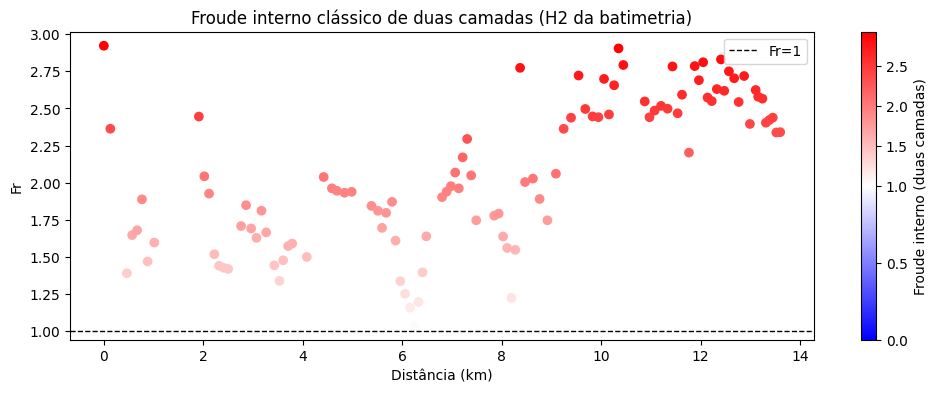

In [104]:
# gráfico Fr x distância (checagem rápida)
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(12,4))
norm = TwoSlopeNorm(vmin=0, vcenter=1, vmax=np.clip(fr2_df["Fr"].max(), 1.5, 3.0))
sc = plt.scatter(fr2_df["x"], fr2_df["Fr"], c=fr2_df["Fr"], cmap="bwr", norm=norm)
plt.axhline(1, color='k', ls='--', lw=1, label='Fr=1')
plt.colorbar(sc, label='Froude interno (duas camadas)')
plt.xlabel('Distância (km)'); plt.ylabel('Fr')
plt.title('Froude interno clássico de duas camadas (H2 da batimetria)')
plt.legend(); plt.show()


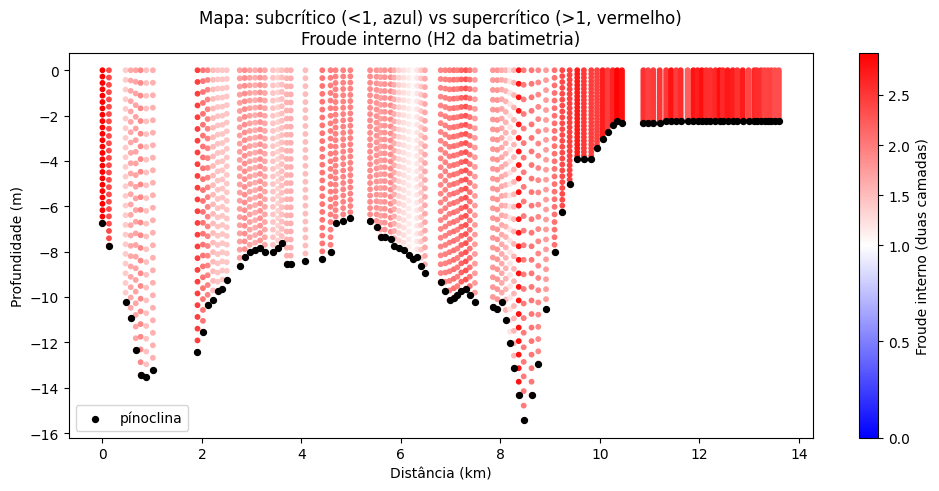

In [105]:
# mapa 2D pintando a CAMADA SUPERIOR com o Fr de duas camadas
xp, zp, val = [], [], []
for _, r in fr2_df.iterrows():
    xi, h1i, Fri = r["x"], r["h1"], r["Fr"]
    zz = np.linspace(0, h1i, 25)
    xp.append(np.full_like(zz, xi)); zp.append(zz); val.append(np.full_like(zz, Fri))

xp = np.concatenate(xp); zp = np.concatenate(zp); val = np.concatenate(val)

plt.figure(figsize=(12,5))
norm = TwoSlopeNorm(vmin=0, vcenter=1, vmax=np.clip(np.nanmax(val), 1.5, 3.0))
sc = plt.scatter(xp, -zp, s=10, c=val, cmap="bwr", norm=norm)
plt.scatter(distancias, -smoothed_depths, color='k', s=18, marker='o', label='pínoclina')
plt.colorbar(sc, label="Froude interno (duas camadas)")
plt.xlabel("Distância (km)"); plt.ylabel("Profundidade (m)")
plt.title("Mapa: subcrítico (<1, azul) vs supercrítico (>1, vermelho)\nFroude interno (H2 da batimetria)")
plt.legend(); plt.show()


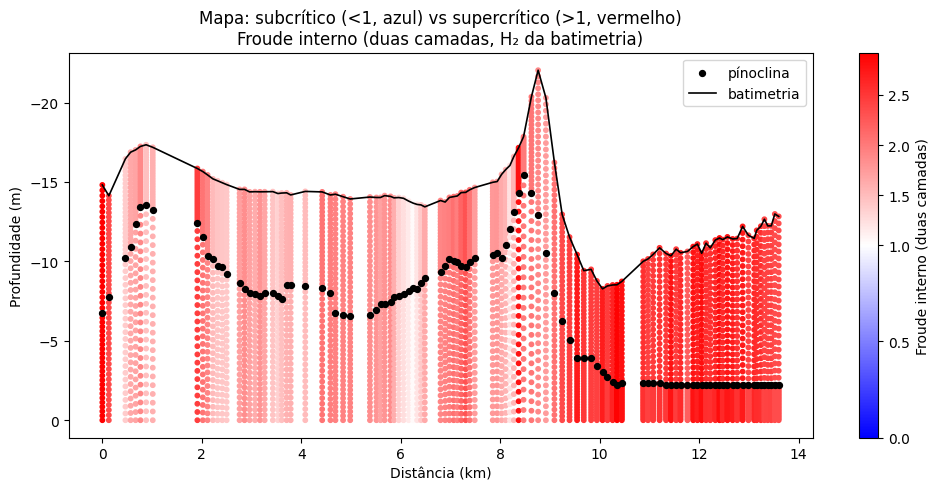

In [106]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

# Pontos "virtuais" para as duas camadas
xp, zp, val = [], [], []

for _, r in fr2_df.iterrows():
    xi   = r["x"]
    h1   = r["h1"]        # espessura da camada sup (m)
    Htot = r["Htot"]      # profundidade total (m)
    Fri  = r["Fr"]

    # 0 → h1 (camada superior)
    zz_up = np.linspace(0, h1, 25)
    xp.append(np.full_like(zz_up, xi))
    zp.append(zz_up)
    val.append(np.full_like(zz_up, Fri))

    # h1 → Htot (camada inferior)
    zz_dn = np.linspace(h1, Htot, 25)
    xp.append(np.full_like(zz_dn, xi))
    zp.append(zz_dn)
    val.append(np.full_like(zz_dn, Fri))

xp  = np.concatenate(xp)
zp  = np.concatenate(zp)
val = np.concatenate(val)

plt.figure(figsize=(12,5))
norm = TwoSlopeNorm(vmin=0, vcenter=1, vmax=np.clip(np.nanmax(val), 1.5, 3.0))
sc = plt.scatter(xp, -zp, s=10, c=val, cmap="bwr", norm=norm)

# pínoclina e batimetria
plt.scatter(distancias, -smoothed_depths, color='k', s=18, marker='o', label='pínoclina')
plt.plot(dist, -depth_drift, 'k', lw=1.2, label='batimetria')

plt.colorbar(sc, label="Froude interno (duas camadas)")
plt.xlabel("Distância (km)")
plt.ylabel("Profundidade (m)")
plt.title("Mapa: subcrítico (<1, azul) vs supercrítico (>1, vermelho)\nFroude interno (duas camadas, H₂ da batimetria)")
plt.legend()
plt.gca().invert_yaxis()  # opcional: se quiser o eixo crescente p/ baixo, remova esta linha
plt.show()


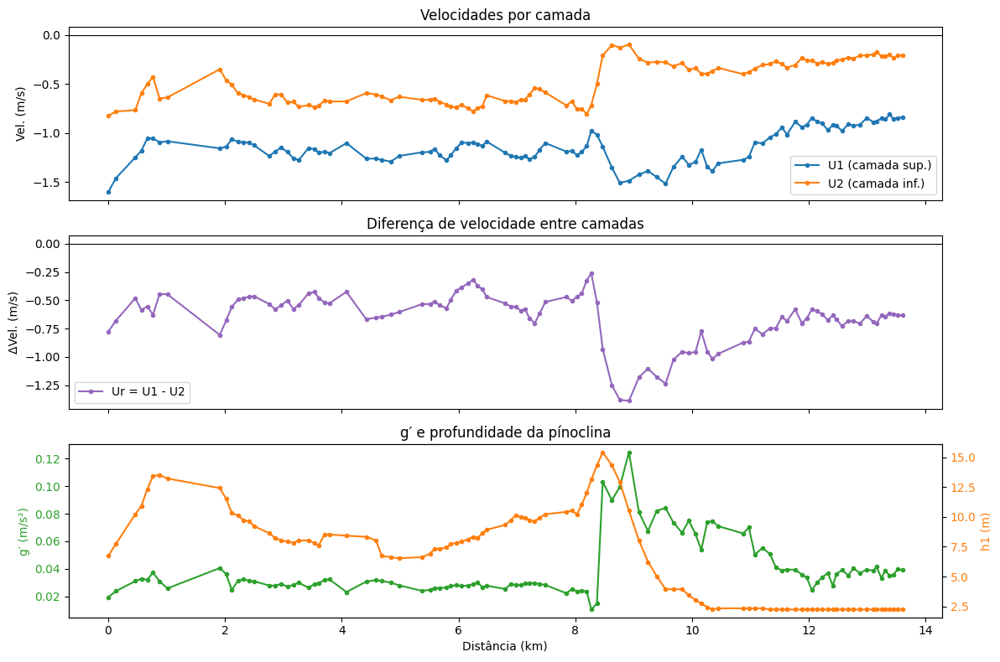

In [107]:
import matplotlib.pyplot as plt

xsec  = fr2_df["x"].values
U1    = fr2_df["U1"].values
U2    = fr2_df["U2"].values
Ur    = fr2_df["Ur"].values
gprime= fr2_df["gprime"].values
h1    = fr2_df["h1"].values
Fr    = fr2_df["Fr"].values

fig, axs = plt.subplots(3, 1, figsize=(12,8), sharex=True)

# 1) U1 e U2
axs[0].plot(xsec, U1, 'o-', ms=3, label="U1 (camada sup.)")
axs[0].plot(xsec, U2, 'o-', ms=3, label="U2 (camada inf.)")
axs[0].axhline(0, color='k', lw=0.8)
axs[0].set_ylabel("Vel. (m/s)")
axs[0].set_title("Velocidades por camada")
axs[0].legend(loc="best")

# 2) Ur = U1 - U2
axs[1].plot(xsec, Ur, 'o-', ms=3, color='tab:purple', label="Ur = U1 - U2")
axs[1].axhline(0, color='k', lw=0.8)
axs[1].set_ylabel("ΔVel. (m/s)")
axs[1].set_title("Diferença de velocidade entre camadas")
axs[1].legend(loc="best")

# 3) g' e h1 (eixo duplo)
ax3 = axs[2]
ax3.plot(xsec, gprime, 'o-', ms=3, color='tab:green', label="g′")
ax3.set_ylabel("g′ (m/s²)", color='tab:green')
ax3.tick_params(axis='y', labelcolor='tab:green')
ax3.set_title("g′ e profundidade da pínoclina")

ax3b = ax3.twinx()
ax3b.plot(xsec, h1, 'o-', ms=3, color='tab:orange', label="h1")
ax3b.set_ylabel("h1 (m)", color='tab:orange')
ax3b.tick_params(axis='y', labelcolor='tab:orange')

axs[2].set_xlabel("Distância (km)")

plt.tight_layout()
plt.show()


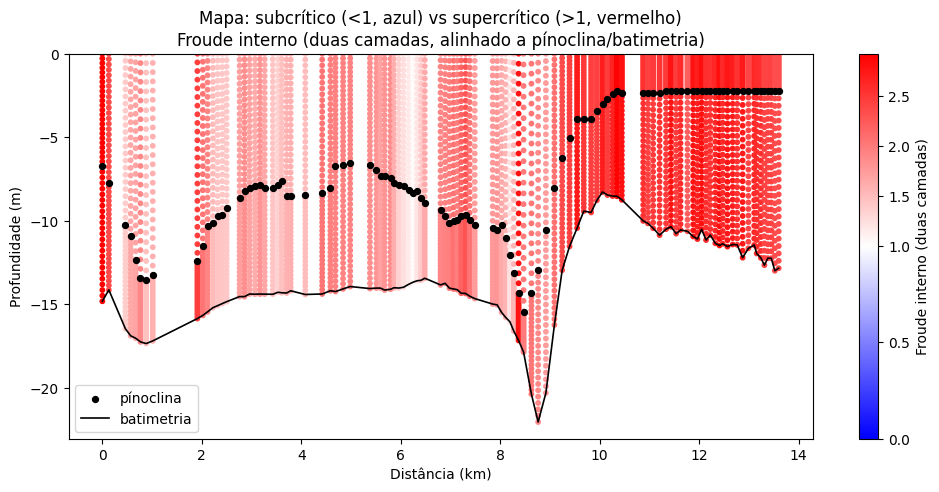

In [108]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

# --- util: pínoclina e batimetria para o x do perfil (km) ---
bed_x = np.asarray(dist, dtype=float)
bed_z = np.asarray(depth_drift, dtype=float)  # já é profundidade positiva (m)
ord_bed = np.argsort(bed_x)
bed_x, bed_z = bed_x[ord_bed], bed_z[ord_bed]

def h1_for_plot(x0):
    h1, ok = nearest_pycnocline_depth(x0)  # usa os seus distancias/smoothed_depths
    return h1 if ok else np.nan

def Htot_for_plot(x0):
    return float(np.interp(x0, bed_x, bed_z))

# --- construir os pontos das DUAS camadas usando h1/Htot do PLOT ---
xp, zp, val = [], [], []
for _, r in fr2_df.iterrows():
    xi  = float(r["x"])
    Fri = float(r["Fr"])

    h1p   = h1_for_plot(xi)      # pínoclina exatamente como a que você desenha
    Htotp = Htot_for_plot(xi)    # batimetria exatamente como a que você desenha

    if not (np.isfinite(h1p) and np.isfinite(Htotp)):
        continue
    if Htotp <= h1p:  # segurança
        continue

    # camada superior: 0 → h1
    zz_up = np.linspace(0, h1p, 25)
    xp.append(np.full_like(zz_up, xi))
    zp.append(zz_up)
    val.append(np.full_like(zz_up, Fri))

    # camada inferior: h1 → Htot
    zz_dn = np.linspace(h1p, Htotp, 25)
    xp.append(np.full_like(zz_dn, xi))
    zp.append(zz_dn)
    val.append(np.full_like(zz_dn, Fri))

xp  = np.concatenate(xp) if xp else np.array([])
zp  = np.concatenate(zp) if zp else np.array([])
val = np.concatenate(val) if val else np.array([])

plt.figure(figsize=(12,5))
if val.size:
    norm = TwoSlopeNorm(vmin=0, vcenter=1, vmax=np.clip(np.nanmax(val), 1.5, 3.0))
    sc = plt.scatter(xp, -zp, s=10, c=val, cmap="bwr", norm=norm)
    plt.colorbar(sc, label="Froude interno (duas camadas)")
else:
    plt.text(0.5, 0.5, "Sem pontos válidos para plotar", ha="center", va="center", transform=plt.gca().transAxes)

# pinta pínoclina e batimetria EXATAMENTE como nos seus gráficos
plt.scatter(distancias, -smoothed_depths, color='k', s=18, marker='o', label='pínoclina')
plt.plot(dist, -depth_drift, 'k', lw=1.2, label='batimetria')

plt.xlabel("Distância (km)")
plt.ylabel("Profundidade (m)")
plt.title("Mapa: subcrítico (<1, azul) vs supercrítico (>1, vermelho)\nFroude interno (duas camadas, alinhado a pínoclina/batimetria)")
plt.legend()

# limites coerentes: topo = 0 m; fundo = min(batimetria) - margem
ymin = -float(np.nanmax(depth_drift)) - 1.0
plt.ylim(ymin, 0)

plt.show()


In [109]:
chk = []
for _, r in fr2_df.iterrows():
    xi = float(r["x"])
    h1p = h1_for_plot(xi); Htotp = Htot_for_plot(xi)
    chk.append((xi, h1p, Htotp, Htotp - h1p))
chk = np.array(chk, float)
print("min(Htot - h1) =", np.nanmin(chk[:,3]))


min(Htot - h1) = 2.422155025626134


In [110]:
# ajuste o intervalo se preferir
x0, x1 = 8.0, 9.2

mask = (fr2_df["x"] >= x0) & (fr2_df["x"] <= x1)
cols = ["x","h1","Htot","U1","U2","Ur","rho_a","rho_b","gprime","Fr","class"]
display(fr2_df.loc[mask, cols].round(4))


,x,h1,Htot,U1,U2,Ur,rho_a,rho_b,gprime,Fr,class
56,8.0271,10.2322,15.4798,-1.2248,-0.7556,-0.4691,1006.1681,1008.5825,0.0237,1.6367,supercritical
57,8.1092,11.0322,15.7788,-1.1938,-0.7534,-0.4404,1006.3279,1008.7769,0.0240,1.5595,supercritical
58,8.1947,12.0322,16.0415,-1.1314,-0.8060,-0.3254,1006.4703,1008.8688,0.0235,1.2233,supercritical
59,8.2728,13.1322,16.6002,-0.9774,-0.7160,-0.2614,1007.7726,1008.8339,0.0104,1.5470,supercritical
60,8.3693,14.3322,17.1613,-1.0162,-0.4990,-0.5172,1008.2260,1009.7261,0.0147,2.7735,supercritical
61,8.4692,15.4322,17.8543,-1.1392,-0.2079,-0.9313,1008.1349,1018.6541,0.1032,2.0036,supercritical
62,8.6269,14.3322,20.3664,-1.3541,-0.1020,-1.2521,1007.8791,1017.0405,0.0899,2.0269,supercritical
63,8.7619,12.9322,22.0393,-1.5082,-0.1291,-1.3791,1007.5946,1017.7541,0.0997,1.8897,supercritical
64,8.9180,10.5322,20.3017,-1.4857,-0.0978,-1.3878,1006.7953,1019.5071,0.1247,1.7457,supercritical
65,9.0891,8.0322,16.2271,-1.4241,-0.2428,-1.1813,1011.5888,1019.8540,0.0811,2.0599,supercritical


In [113]:
 def compute_profile_metrics_two_layer_windows(x0, w_top=2.0, w_bot=2.0, debug=False):
    """Froude 2 camadas usando janelas fixas no topo/fundo para U e ρ."""
    why = []

    # profundidades
    h1, ok = nearest_pycnocline_depth(x0)
    if not ok or not np.isfinite(h1) or h1 <= 0:
        if debug: print(x0, "no_pycnocline")
        return None
    Htot = float(np.interp(x0, bed_x, bed_z))
    if not np.isfinite(Htot) or Htot <= h1:
        if debug: print(x0, "bad_Htot", Htot, "h1", h1)
        return None

    H1, H2 = h1, Htot - h1
    if H1 <= 0 or H2 <= 0:
        if debug: print(x0, "nonpositive_layer", H1, H2)
        return None

    # janelas efetivas (não deixam passar do limite)
    w_top_eff = max(0.5, min(w_top, Htot))          # >=0.5 m
    w_bot_eff = max(0.5, min(w_bot, Htot))          # >=0.5 m
    z_top_max = w_top_eff
    z_bot_min = max(Htot - w_bot_eff, 0)

    # velocidades
    sel_v = np.abs(x - x0) <= tol_x
    if sel_v.sum() < 2:
        if debug: print(x0, "no_velocity_points")
        return None
    z_v = z[sel_v]
    v_top_mask = sel_v.copy(); v_top_mask[sel_v]  = (z_v >= 0) & (z_v <= z_top_max)
    v_bot_mask = sel_v.copy(); v_bot_mask[sel_v]  = (z_v >= z_bot_min) & (z_v <= Htot)

    if v_top_mask.sum() < 2 or v_bot_mask.sum() < 2:
        if debug: print(x0, "few_vel_points", v_top_mask.sum(), v_bot_mask.sum())
        return None

    U1 = np.nanmedian(vr[v_top_mask])
    U2 = np.nanmedian(vr[v_bot_mask])
    if not (np.isfinite(U1) and np.isfinite(U2)):
        if debug: print(x0, "bad_U")
        return None
    Ur = U1 - U2

    # densidades
    dist_rho = mtx_tj[:,1]; z_rho = mtx_tj[:,2]; rho = mtx_tj[:,5]
    sel_r = np.abs(dist_rho - x0) <= tol_x
    if sel_r.sum() < 2:
        if debug: print(x0, "no_rho_points")
        return None
    zr = z_rho[sel_r]
    r_top_mask = sel_r.copy(); r_top_mask[sel_r]  = (zr >= 0) & (zr <= z_top_max)
    r_bot_mask = sel_r.copy(); r_bot_mask[sel_r]  = (zr >= z_bot_min) & (zr <= Htot)

    if r_top_mask.sum() < 2 or r_bot_mask.sum() < 2:
        if debug: print(x0, "few_rho_points", r_top_mask.sum(), r_bot_mask.sum())
        return None

    rho_top = np.nanmedian(mtx_tj[r_top_mask, 5])
    rho_bot = np.nanmedian(mtx_tj[r_bot_mask, 5])
    if not (np.isfinite(rho_top) and np.isfinite(rho_bot)):
        if debug: print(x0, "bad_rho")
        return None
    if rho_bot <= rho_top:
        rho_bot = rho_top + 0.01  # garante estabilidade mínima

    rho_ref = 1000.0
    gprime = g * (rho_bot - rho_top) / rho_ref

    denom = gprime * H1 * H2 / (H1 + H2)
    if not np.isfinite(denom) or denom <= 0:
        if debug: print(x0, "bad_denom", denom)
        return None

    Fr = abs(Ur) / np.sqrt(denom)

    return {
        "x": float(x0),
        "Htot": float(Htot),
        "h1": float(H1),
        "h2": float(H2),
        "U1": float(U1),
        "U2": float(U2),
        "Ur": float(Ur),
        "rho_a": float(rho_top),
        "rho_b": float(rho_bot),
        "gprime": float(gprime),
        "Fr": float(Fr),
    }


In [114]:
for xc in xs_centers[::10]:  # a cada ~10 perfis
    _ = compute_profile_metrics_two_layer_windows(xc, debug=True)


0.0 few_vel_points 1 0
2.11552 few_vel_points 1 3
3.26396 few_vel_points 1 3
4.83986 few_vel_points 1 4
6.15773 few_vel_points 1 2
7.21484 few_vel_points 1 2
8.3693 few_vel_points 1 3
9.82717 few_vel_points 1 2
11.2037 few_vel_points 1 3
12.22243 few_vel_points 1 4
13.15658 few_vel_points 1 2


In [115]:
rows_win = []
for xc in xs_centers:
    out = compute_profile_metrics_two_layer_windows(xc, w_top=2.0, w_bot=2.0)
    if out is not None:
        rows_win.append(out)

if rows_win:
    fr2w_df = pd.DataFrame(rows_win).sort_values("x").reset_index(drop=True)
    fr2w_df["class"] = np.where(fr2w_df["Fr"] < 1, "subcritical", "supercritical")
    print(f"Perfis válidos (janelas topo/fundo): {len(fr2w_df)}")
    display(fr2w_df.head(10))
else:
    fr2w_df = pd.DataFrame()
    print("Nenhum perfil válido com as janelas atuais. Tente aumentar tol_x ou reduzir w_top/w_bot.")


Nenhum perfil válido com as janelas atuais. Tente aumentar tol_x ou reduzir w_top/w_bot.


In [116]:
tol_x = max(tol_x, 0.10)  # 100 m


In [117]:
out = compute_profile_metrics_two_layer_windows(xs_centers[len(xs_centers)//2], w_top=1.0, w_bot=1.0, debug=True)
print(out)


7.48745 few_vel_points 0 1
None


In [118]:
if not fr2_df.empty and not fr2w_df.empty:
    # alinha pelos x em comum
    common = np.intersect1d(fr2_df["x"].values, fr2w_df["x"].values)
    a = fr2_df.set_index("x").loc[common]["Fr"].values
    b = fr2w_df.set_index("x").loc[common]["Fr"].values

    plt.figure(figsize=(12,4))
    plt.plot(common, a, 'o-', ms=3, label="Fr (camadas inteiras)")
    plt.plot(common, b, 'o-', ms=3, label="Fr (janelas topo/fundo)")
    plt.axhline(1, ls='--', color='k', lw=1)
    plt.xlabel("Distância (km)"); plt.ylabel("Fr")
    plt.legend(); plt.title("Comparação de critérios de Fr")
    plt.show()
else:
    print("Não há dados suficientes para comparar as duas abordagens.")


Não há dados suficientes para comparar as duas abordagens.


In [119]:
if v_top_mask.sum() < 1 or v_bot_mask.sum() < 1:
    if debug: print(x0, "few_vel_points", v_top_mask.sum(), v_bot_mask.sum())
    return None


SyntaxError: 'return' outside function (4078285338.py, line 3)

In [122]:
def compute_profile_metrics_two_layer_windows_v2(x0,
                                                 w_top_init=2.0, w_bot_init=2.0,
                                                 w_max=6.0,
                                                 min_pts=1,          # aceita ≥1 ponto por janela
                                                 expand_tol=True):
    """
    Froude 2 camadas usando janelas fixas no topo/fundo (medianas de U e ρ),
    com expansão adaptativa de janelas verticais e, opcionalmente, tol_x local.
    """
    # profundidades
    h1, ok = nearest_pycnocline_depth(x0)
    if not ok or not np.isfinite(h1) or h1 <= 0:
        return None
    Htot = float(np.interp(x0, bed_x, bed_z))
    if not np.isfinite(Htot) or Htot <= h1:
        return None

    H1, H2 = h1, Htot - h1
    if H1 <= 0 or H2 <= 0:
        return None

    # tentativas de expansão (verticais e horizontais)
    tol_multipliers = [1.0, 1.5, 2.0] if expand_tol else [1.0]
    for tmult in tol_multipliers:
        tol_loc = tol_x * tmult

        # seleção bruta por distância
        sel_v = np.abs(x - x0) <= tol_loc
        sel_r = np.abs(mtx_tj[:, 1] - x0) <= tol_loc
        if sel_v.sum() == 0 or sel_r.sum() == 0:
            continue

        z_v = z[sel_v]
        zr  = mtx_tj[sel_r, 2]
        rho = mtx_tj[sel_r, 5]
        vr_loc = vr[sel_v]

        # tenta janelas verticais: 2m → ... → w_max
        w_top = w_top_init
        w_bot = w_bot_init
        while True:
            # limites das janelas (0→w_top, Htot-w_bot→Htot)
            z_top_max = min(w_top, Htot)
            z_bot_min = max(Htot - w_bot, 0)

            v_top_mask = (z_v >= 0) & (z_v <= z_top_max)
            v_bot_mask = (z_v >= z_bot_min) & (z_v <= Htot)
            r_top_mask = (zr  >= 0) & (zr  <= z_top_max)
            r_bot_mask = (zr  >= z_bot_min) & (zr  <= Htot)

            n_v_top = int(np.sum(v_top_mask))
            n_v_bot = int(np.sum(v_bot_mask))
            n_r_top = int(np.sum(r_top_mask))
            n_r_bot = int(np.sum(r_bot_mask))

            if (n_v_top >= min_pts and n_v_bot >= min_pts and
                n_r_top >= min_pts and n_r_bot >= min_pts):
                # temos dados suficientes
                U1 = float(np.nanmedian(vr_loc[v_top_mask]))
                U2 = float(np.nanmedian(vr_loc[v_bot_mask]))
                Ur = U1 - U2

                rho_top = float(np.nanmedian(rho[r_top_mask]))
                rho_bot = float(np.nanmedian(rho[r_bot_mask]))
                if not (np.isfinite(rho_top) and np.isfinite(rho_bot)):
                    break
                if rho_bot <= rho_top:
                    rho_bot = rho_top + 0.01

                rho_ref = 1000.0
                gprime = g * (rho_bot - rho_top) / rho_ref

                denom = gprime * H1 * H2 / (H1 + H2)
                if not np.isfinite(denom) or denom <= 0:
                    break
                Fr = abs(Ur) / np.sqrt(denom)

                return {
                    "x": float(x0),
                    "Htot": float(Htot),
                    "h1": float(H1),
                    "h2": float(H2),
                    "U1": U1,
                    "U2": U2,
                    "Ur": Ur,
                    "rho_a": rho_top,
                    "rho_b": rho_bot,
                    "gprime": float(gprime),
                    "Fr": float(Fr),
                    "w_top": float(w_top),
                    "w_bot": float(w_bot),
                    "tol_used": float(tol_loc),
                    "n_v_top": n_v_top, "n_v_bot": n_v_bot,
                    "n_r_top": n_r_top, "n_r_bot": n_r_bot,
                }

            # expandir janelas verticais se ainda couber
            if w_top < w_max or w_bot < w_max:
                w_top = min(w_top + 1.0, w_max)
                w_bot = min(w_bot + 1.0, w_max)
            else:
                break  # não dá pra expandir mais com esse tol_loc

        # tenta próximo multiplicador de tol_x
        continue

    # não conseguiu dados suficientes
    return None


In [123]:
rows_win = []
for xc in xs_centers:
    out = compute_profile_metrics_two_layer_windows_v2(xc,
                                                       w_top_init=2.0, w_bot_init=2.0,
                                                       w_max=6.0, min_pts=1,
                                                       expand_tol=True)
    if out is not None:
        rows_win.append(out)

if rows_win:
    fr2w_df = pd.DataFrame(rows_win).sort_values("x").reset_index(drop=True)
    fr2w_df["class"] = np.where(fr2w_df["Fr"] < 1, "subcritical", "supercritical")
    print(f"Perfis válidos (janelas adaptativas): {len(fr2w_df)}")
    display(fr2w_df.head(10))
else:
    fr2w_df = pd.DataFrame()
    print("Ainda sem perfis válidos — aumente w_max (ex.: 8 m) e/ou tol_x.")


Perfis válidos (janelas adaptativas): 107


/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_2958/896815087.py:60: RuntimeWarning: All-NaN slice encountered
  U2 = float(np.nanmedian(vr_loc[v_bot_mask]))


,x,Htot,h1,h2,U1,U2,Ur,rho_a,rho_b,gprime,Fr,w_top,w_bot,tol_used,n_v_top,n_v_bot,n_r_top,n_r_bot,class
0,0.00000,14.814117,6.732171,8.081946,-1.688762,-0.578817,-1.109945,1005.577148,1008.364736,0.027346,3.502313,4.0,4.0,0.1,5,2,5,2,supercritical
1,0.13047,14.131371,7.732171,6.399200,-1.598152,-0.494749,-1.103404,1004.528814,1008.792362,0.041825,2.883321,2.0,2.0,0.1,1,3,1,3,supercritical
2,0.46389,16.460018,10.232171,6.227847,-1.731709,NaN,NaN,1004.765415,1009.871848,0.050094,NaN,2.0,2.0,0.1,1,2,1,2,supercritical
3,0.56840,16.877990,10.932171,5.945819,-1.748569,NaN,NaN,1005.003798,1009.691945,0.045991,NaN,2.0,2.0,0.1,1,3,1,3,supercritical
4,0.66907,17.023606,12.332171,4.691435,-1.691488,-0.370117,-1.321371,1005.152381,1009.815919,0.045749,3.351088,2.0,2.0,0.1,2,6,2,6,supercritical
5,0.76657,17.242452,13.432171,3.810281,-1.691488,NaN,NaN,1005.152381,1009.947303,0.047038,NaN,2.0,2.0,0.1,2,4,2,4,supercritical
6,0.88010,17.344803,13.532171,3.812632,-1.671496,NaN,NaN,1005.143895,1009.582197,0.043540,NaN,2.0,2.0,0.1,1,3,1,3,supercritical
7,1.01359,17.185831,13.232171,3.953660,-1.647978,-0.556425,-1.091552,1005.017776,1009.334925,0.042351,3.040056,2.0,2.0,0.1,1,4,1,4,supercritical
8,1.91057,15.849349,12.432171,3.417178,-1.559096,NaN,NaN,1005.311836,1010.644459,0.052313,NaN,2.0,2.0,0.1,1,3,1,3,supercritical
9,2.01995,15.657336,11.532171,4.125165,-1.518037,-0.380868,-1.137169,1005.481153,1010.104847,0.045358,3.063223,2.0,2.0,0.1,2,7,2,7,supercritical


In [121]:
import pandas as pd
import numpy as np
import pickle

# Variáveis de interesse
dist_rho = mtx_tj[:, 1]       # distância (km) em cada ponto CTD
z_rho    = mtx_tj[:, 2]       # profundidade (m) em cada ponto CTD
rho      = mtx_tj[:, 5]       # densidade (kg/m³) em cada ponto CTD

veloc    = np.asarray(vr)             # velocidade ao longo do canal (m/s), já do campo
hpic     = np.asarray(smoothed_depths)  # profundidade da picnoclina (1 valor por perfil)

# DataFrame "bruto" ponto a ponto (densidade)
df_raw = pd.DataFrame({
    "dist": dist_rho,
    "z": z_rho,
    "rho": rho
})

# Guardar tudo no pickle: o DataFrame + arrays
pickle_filename = "dados_interesse.pkl"
with open(pickle_filename, "wb") as f:
    pickle.dump({
        "df_raw": df_raw,
        "dist_rho": dist_rho,
        "z_rho": z_rho,
        "rho": rho,
        "veloc": veloc,
        "hpic": hpic
    }, f)

print(f"Arquivo salvo: {pickle_filename}")
print("df_raw preview:")
print(df_raw.head())


Arquivo salvo: dados_interesse.pkl
df_raw preview:
   dist         z          rho
0   0.0  1.732171  1005.172111
1   0.0  2.232171  1005.393263
2   0.0  2.732171  1005.577148
3   0.0  3.232171  1005.747204
4   0.0  3.732171  1005.880224


## LIXO:

## Achando a picnoclina pela Buoyancy Frequency:

/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_13245/2506869544.py:55: RuntimeWarning: invalid value encountered in log10
  c=np.log10(N2), cmap=cmocean.cm.thermal)


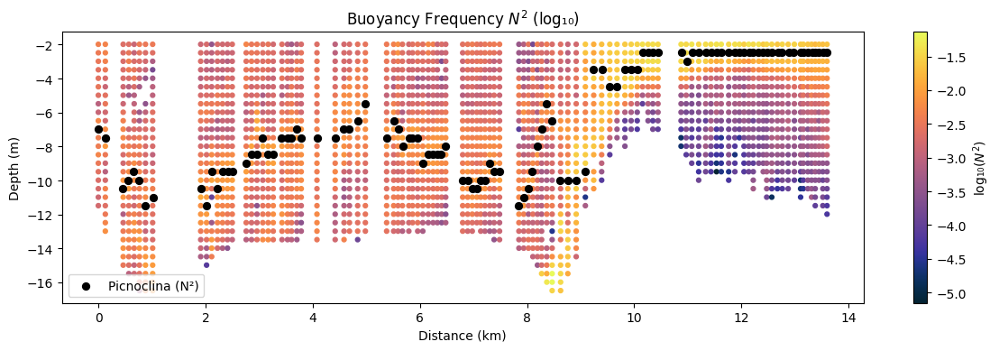

In [48]:

from scipy.ndimage import median_filter

# ==== Dados ====
x   = mtx_tj_calc[:,0]   # distância (km)
z   = mtx_tj_calc[:,1]   # profundidade (m, positiva p/ baixo)
N2  = mtx_tj_calc[:,2]   # Buoyancy Frequency (1/s^2)

# ==== Parâmetros ====
eps_dist   = 0.02    # tolerância para agrupar distâncias em perfis
zmin, zmax = 2.0, 12.0   # faixa de busca da picnoclina
min_points = 5
qc_jump_m  = 2.0     # remove saltos > 2 m

# ==== Agrupamento por perfil ====
dist_grid   = np.round(x / eps_dist) * eps_dist
dist_unique = np.unique(dist_grid)

pyc_x, pyc_z = [], []

for d in dist_unique:
    m = np.isclose(dist_grid, d)
    if m.sum() < min_points:
        continue

    zi, N2i = z[m].copy(), N2[m].copy()

    # ordenar por profundidade
    sidx = np.argsort(zi)
    zi, N2i = zi[sidx], N2i[sidx]

    # limitar faixa de profundidade
    valid = (zi >= zmin) & (zi <= zmax)
    if valid.sum() < 3:
        continue

    # procurar máximo de N²
    k = np.argmax(N2i[valid])
    z_pyc = zi[valid][k]

    pyc_x.append(d)
    pyc_z.append(z_pyc)

pyc_x, pyc_z = np.array(pyc_x), np.array(pyc_z)

# ==== QC com filtro mediano ====
if pyc_z.size > 5:
    z_med = median_filter(pyc_z, size=5)
    mask_out = np.abs(pyc_z - z_med) > qc_jump_m
    pyc_z[mask_out] = z_med[mask_out]

# ==== Plot ====
fig, ax = plt.subplots(figsize=(12,4))

cb = ax.scatter(x, -z, s=12,
                c=np.log10(N2), cmap=cmocean.cm.thermal)
ax.scatter(pyc_x, -pyc_z, c='k', s=32, label='Picnoclina (N²)', zorder=5)

ax.set_title('Buoyancy Frequency $N^2$ (log₁₀)')
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Depth (m)')
ax.legend(loc='lower left')
fig.colorbar(cb, ax=ax, label='log₁₀($N^2$)')

plt.tight_layout()
plt.show()


In [49]:
import numpy as np

def detect_picnoclina(x, z, N2, n_vizinhos=2, n_top=3):
    """
    Detecta profundidade da picnoclina usando N² com critério híbrido.
    
    x : array -> distância ao longo do canal
    z : array -> profundidade
    N2 : array -> valores de N² para cada (x,z)
    n_vizinhos : int -> número de vizinhos a considerar para comparar continuidade
    n_top : int -> número de maiores picos de N² a considerar
    """
    picnoclina = []

    for i, xi in enumerate(np.unique(x)):
        # Seleciona o perfil atual
        mask = x == xi
        z_prof = z[mask]
        N2_prof = N2[mask]

        # Ordena picos de N² (do maior pro menor)
        idx_sorted = np.argsort(N2_prof)[::-1]
        top_idx = idx_sorted[:n_top]  # pega os n_top maiores picos
        z_top = z_prof[top_idx]

        if i == 0:
            # No primeiro perfil, pega o maior pico
            z_sel = z_top[0]
        else:
            # Calcula profundidade média dos vizinhos anteriores
            vizinhos = picnoclina[max(0, i-n_vizinhos):i]
            z_ref = np.mean(vizinhos)

            # Escolhe o pico mais próximo da média dos vizinhos
            z_sel = z_top[np.argmin(np.abs(z_top - z_ref))]

        picnoclina.append(z_sel)

    return np.array(picnoclina)


/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_13245/2085843793.py:11: RuntimeWarning: invalid value encountered in log10
  sc = plt.scatter(x, z, c=np.log10(N2), cmap="cmo.thermal", s=10)


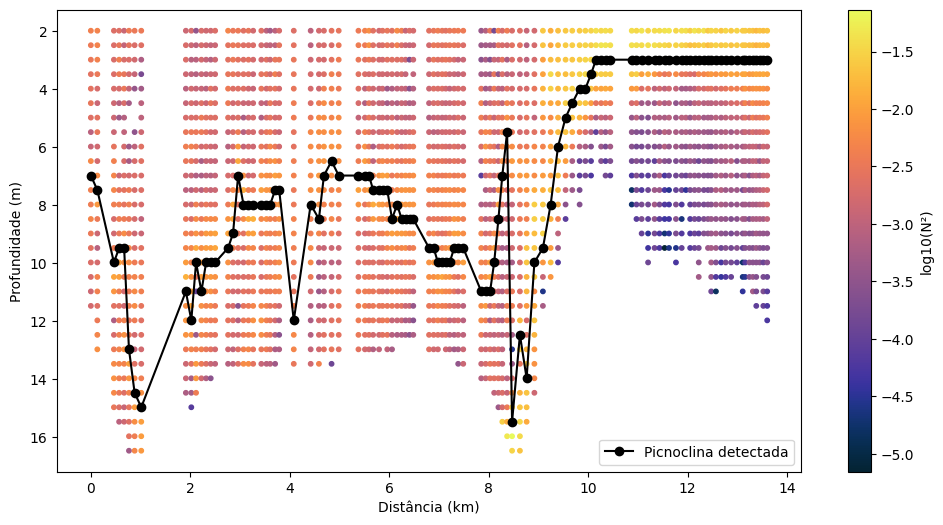

In [51]:
x = mtx_tj_calc[:,0]   # distância
z = mtx_tj_calc[:,1]  # profundidade (negativa para plotar)
N2 = mtx_tj_calc[:,2]  # buoyancy frequency

picno = detect_picnoclina(x, z, N2, n_vizinhos=2, n_top=3)

# Agora você pode plotar junto
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
sc = plt.scatter(x, z, c=np.log10(N2), cmap="cmo.thermal", s=10)
plt.plot(np.unique(x), picno, 'ko-', label="Picnoclina detectada")
plt.colorbar(sc, label="log10(N²)")
plt.gca().invert_yaxis()
plt.xlabel("Distância (km)")
plt.ylabel("Profundidade (m)")
plt.legend()
plt.show()


Text(0.5, 1.0, 'Absolute velocity (m/s)')

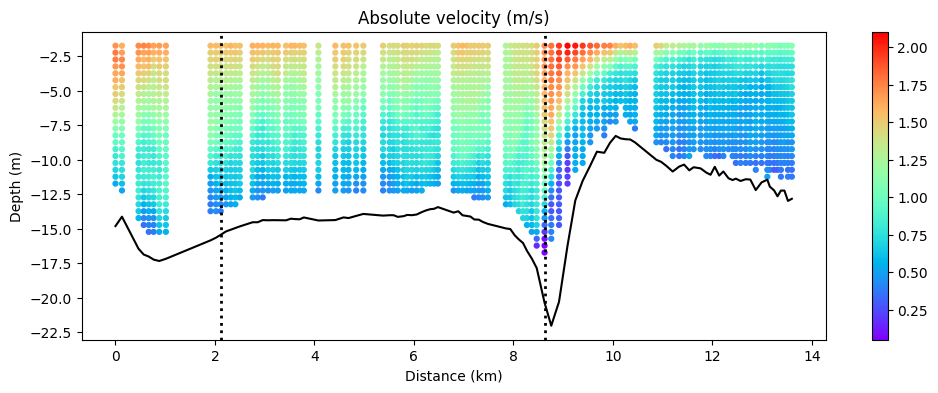

In [22]:
fig, ax = plt.subplots(figsize=(12,4))
cb = ax.scatter(mtx_tj[:,1], -mtx_tj[:,2],s=12 , c=vel, cmap='rainbow')
plot_sets(ax)
ax.set_title('Absolute velocity (m/s)')

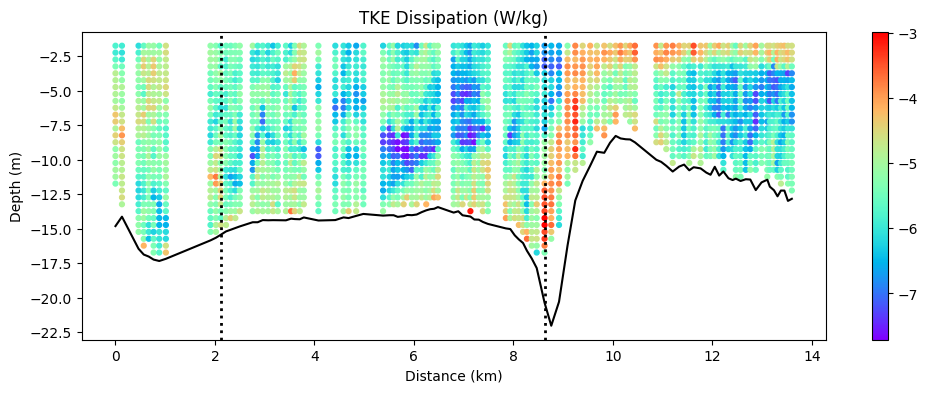

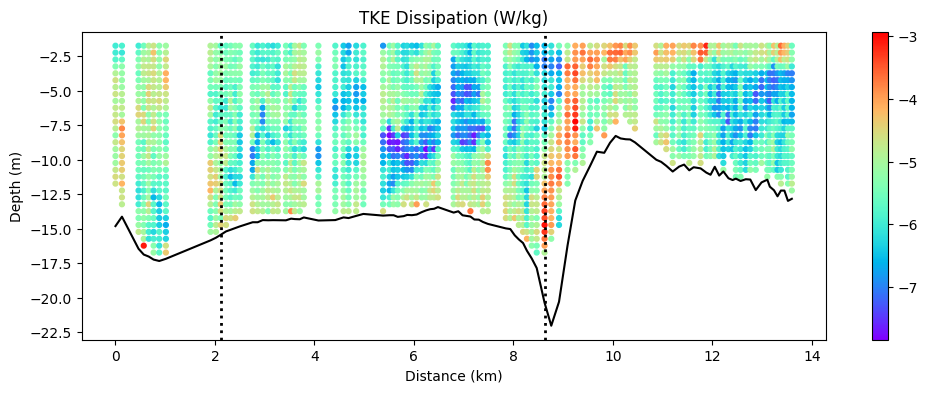

In [23]:
fig, ax = plt.subplots(figsize=(12,4))
cb = ax.scatter(mtx_tj[:,1], -mtx_tj[:,2],s=12 , c=np.log10(mtx_tj[:,6]), cmap='rainbow')
plot_sets(ax)
ax.set_title('TKE Dissipation (W/kg)')
plt.show()

fig, ax = plt.subplots(figsize=(12,4))
cb = ax.scatter(mtx_tj[:,1], -mtx_tj[:,2],s=12 , c=np.log10(mtx_tj[:,7]), cmap='rainbow')
plot_sets(ax)
ax.set_title('TKE Dissipation (W/kg)')
plt.show()

/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_59447/2710481836.py:3: RuntimeWarning: invalid value encountered in log10
  cb = axs[0].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12, c=np.log10(mtx_tj_calc[:,2]), cmap='rainbow')
/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_59447/2710481836.py:18: RuntimeWarning: invalid value encountered in log10
  cb = axs[2].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12, c=np.log10(mtx_tj_calc[:,4]/.25), cmap='bwr', norm=norm)
/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_59447/2710481836.py:24: RuntimeWarning: invalid value encountered in log10
  cb = axs[3].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12, c=np.log10(mtx_tj_calc[:,6]), cmap='rainbow')


Text(0.5, 1.0, 'Eddy Viscosity $(m^2/s)$')

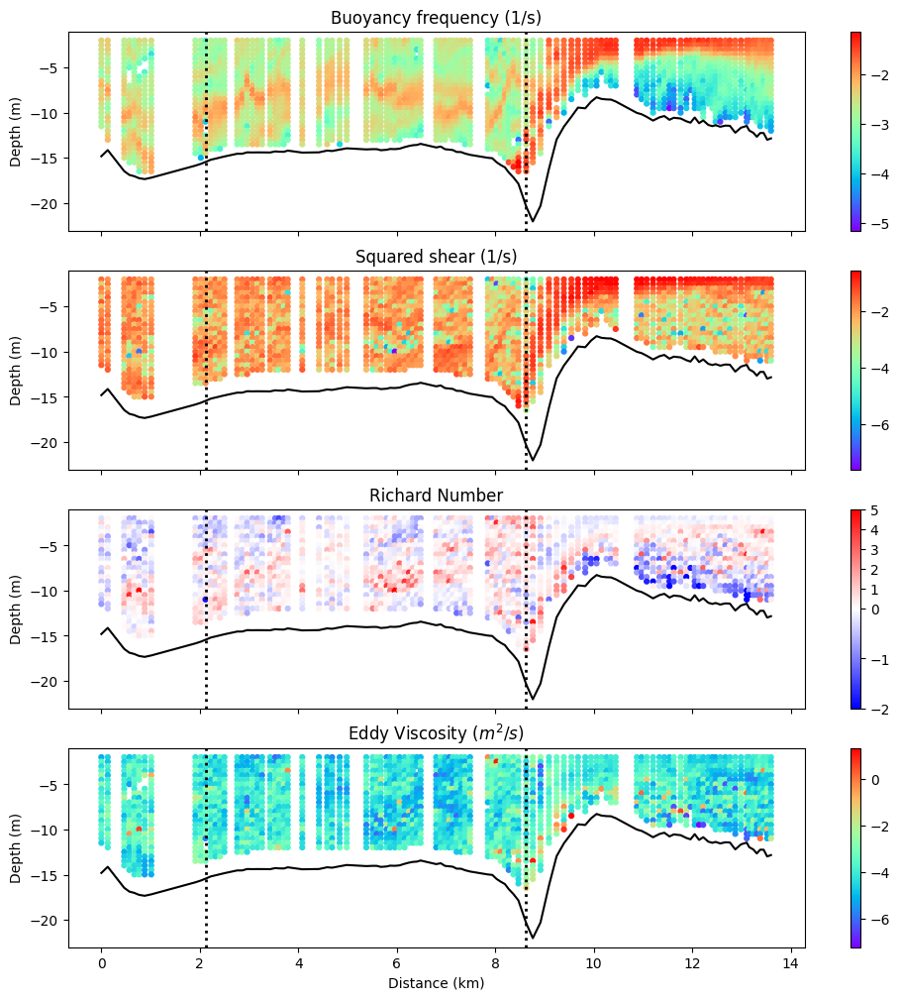

In [24]:
fig, axs = plt.subplots(4, figsize=(12,12))

cb = axs[0].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12, c=np.log10(mtx_tj_calc[:,2]), cmap='rainbow')
plot_sets(axs[0])
axs[0].set_title('Buoyancy frequency (1/s)')
axs[0].set_xlabel('')
axs[0].set_xticklabels('')

cb = axs[1].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12, c=np.log10(mtx_tj_calc[:,3]), cmap='rainbow')
plot_sets(axs[1])
axs[1].set_title('Squared shear (1/s)')
axs[1].set_xlabel('')
axs[1].set_xticklabels('')

vmin = -2
vmax = 5
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
cb = axs[2].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12, c=np.log10(mtx_tj_calc[:,4]/.25), cmap='bwr', norm=norm)
plot_sets(axs[2])
axs[2].set_title('Richard Number')
axs[2].set_xlabel('')
axs[2].set_xticklabels('')

cb = axs[3].scatter(mtx_tj_calc[:,0], -mtx_tj_calc[:,1], s=12, c=np.log10(mtx_tj_calc[:,6]), cmap='rainbow')
plot_sets(axs[3])
axs[3].set_title('Eddy Viscosity $(m^2/s)$')



## Fazendo um grafico interpolado bonito:

In [61]:
z = [p[:,1] for p in mctd]
sal = [p[:,2] for p in mctd]
temp = [p[:,3] for p in mctd]
rho = [p[:,4] for p in mctd]


In [62]:
def plot_secao_2d(
    z,
    v,
    x,
    titulo=None,
    cmap='viridis',
    unidade='psu',
    z_fundo=None,
    vmin=None,
    vmax=None,
    contornos=False,
    salvar_fig=False,
    caminho_fig='./',
    nome_fig='secao_2d'
):
    """
    Plota uma seção vertical 2D da variável desejada com fundo real.

    Parâmetros:
    - z: lista de arrays com profundidades (um por perfil)
    - v: lista de arrays com a variável a plotar (um por perfil)
    - x: vetor de distâncias (um por perfil)
    - titulo: título do gráfico
    - cmap: colormap matplotlib
    - unidade: unidade para o colorbar
    - z_fundo: profundidade do fundo por perfil (opcional)
    - vmin, vmax: limites da escala de cores (opcional)
    - contornos: bool, se True adiciona linhas de contorno
    - salvar_fig: bool, se True salva o gráfico como PNG
    - caminho_fig: pasta de saída
    - nome_fig: nome do arquivo de figura (sem extensão)

    Retorna:
    - None (mostra ou salva o gráfico)
    """

    # Grade vertical comum
    zmax = max([np.nanmax(zi) for zi in z if len(zi) > 1])
    zgrid = np.arange(0.5, zmax + 0.25, 0.25)

    # Interpolação
    v_interp = []
    for zi, vi in zip(z, v):
        if len(zi) < 2 or len(vi) < 2:
            continue
        n = min(len(zi), len(vi))
        f = interp1d(zi[:n], vi[:n], bounds_error=False, fill_value=np.nan)
        v_interp.append(f(zgrid))

    v_interp = np.array(v_interp).T  # (profundidade, perfil)
    x_valid = np.array(x[:v_interp.shape[1]])

    # Fundo real
    if z_fundo is not None:
        z_fundo = np.array(z_fundo[:v_interp.shape[1]])
        if np.nanmean(z_fundo) > 0:
            z_fundo = -z_fundo
    else:
        z_fundo = -np.array([np.nanmax(zi) for zi in z[:v_interp.shape[1]]])

    # Grade para o pcolormesh
    # Grade para o pcolormesh
    X, Z = np.meshgrid(x_valid, -zgrid)  # <- inverter zgrid aqui


    # Máscara abaixo do fundo
    mask = Z < z_fundo[np.newaxis, :]  # ← Z já está negativo

    v_masked = np.where(mask, np.nan, v_interp)

    # Plotagem
    plt.figure(figsize=(10, 6))
    pcm = plt.pcolormesh(X, Z, v_masked, shading='auto', cmap=cmap, vmin=vmin, vmax=vmax)
    plt.plot(x_valid, z_fundo, color='k', linewidth=1.5)

    if contornos:
        cs = plt.contour(X, Z, v_masked, colors='k', linewidths=0.5, levels=8)
        plt.clabel(cs, inline=1, fontsize=8, fmt='%.1f')

    plt.colorbar(pcm, label=f'Salinidade ({unidade})')
    plt.xlabel('Distância (km)')
    plt.ylabel('Profundidade (m)')
    plt.title(titulo or 'Seção 2D')

    
    # Adiciona bolinhas no topo onde foram feitos os casts
    for xi in x:
        plt.plot(xi, 0, 'o', color='black', markersize=3)

    plt.tight_layout()

    if salvar_fig:
        if not os.path.exists(caminho_fig):
            os.makedirs(caminho_fig)
        plt.savefig(os.path.join(caminho_fig, nome_fig + '.png'), dpi=300, bbox_inches='tight')

    plt.show()


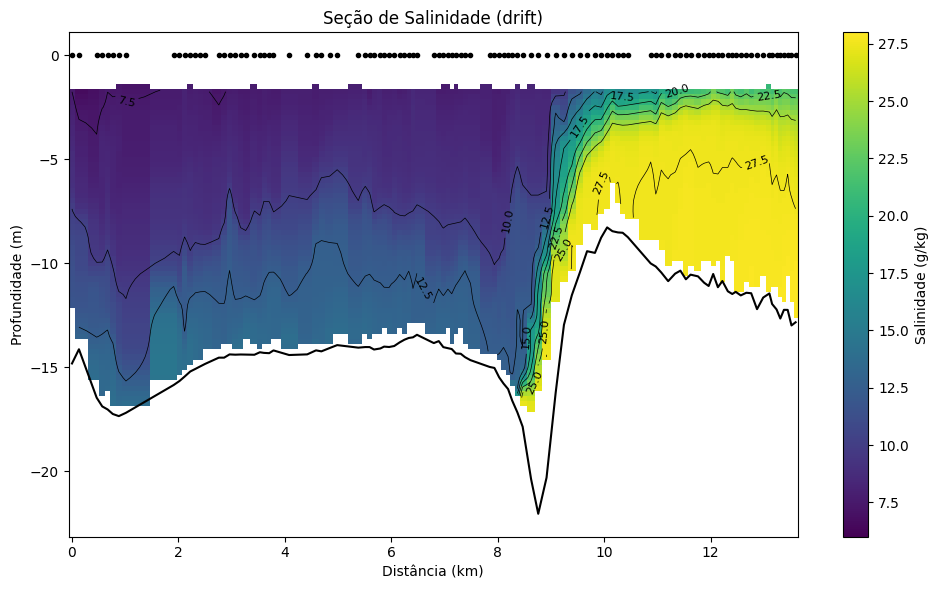

In [68]:
plot_secao_2d(
    z=z,
    v=sal,
    x=dist,  # seu vetor de distâncias
    titulo='Seção de Salinidade (drift)',
    unidade='g/kg',
    z_fundo=depth_drift,
    vmin=6,
    vmax=28,
    contornos=True,
    salvar_fig=True,
    caminho_fig='../figuras/',
    nome_fig='salinidade_drift'
)


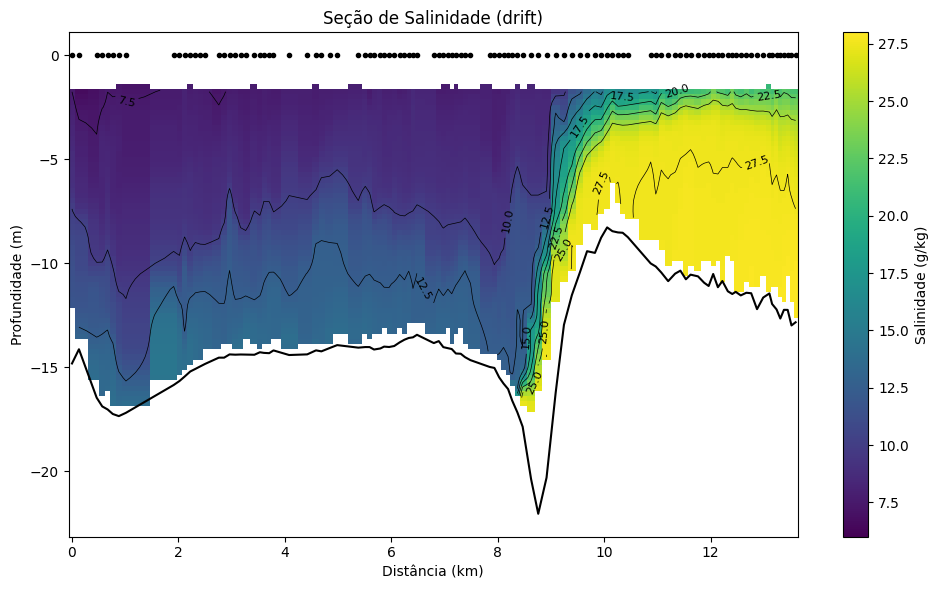

In [70]:
plot_secao_2d(
    z=z,
    v=sal,                     # ou temp, ou dens
    x=dist,
    titulo='Seção de Salinidade (drift)',
    unidade='g/kg',
    z_fundo=depth_drift,
    vmin=6,
    vmax=28,
    contornos=True,
    salvar_fig=True,
    caminho_fig='../figuras/',
    nome_fig='salinidade_drift'
)


In [89]:
def plot_secao_2d_multivariaveis(
    z,
    vars_dict,
    x,
    z_fundo,
    cmap_dict=None,
    vminmax_dict=None,
    salvar_fig=False,
    caminho_fig='./',
    nome_fig='secao_2d_multi'
):
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.interpolate import interp1d
    import os

    nvars = len(vars_dict)
    fig, axs = plt.subplots(nvars, 1, figsize=(12, 4 * nvars), sharex=True)

    if not isinstance(axs, np.ndarray):
        axs = [axs]

    # Grade vertical comum (fixa até -25 m)
    zgrid = np.arange(0.5, 20 + 0.25, 0.25)  # até 25 m

    for ax, (nome_var, v) in zip(axs, vars_dict.items()):
        v_interp = []
        for zi, vi in zip(z, v):
            if len(zi) < 2 or len(vi) < 2:
                continue
            n = min(len(zi), len(vi))
            f = interp1d(zi[:n], vi[:n], bounds_error=False, fill_value=np.nan)
            v_interp.append(f(zgrid))

        v_interp = np.array(v_interp).T
        x_valid = np.array(x[:v_interp.shape[1]])
        fundo_valid = -np.abs(z_fundo[:v_interp.shape[1]])

        X, Z = np.meshgrid(x_valid, -zgrid)

        mask = Z < fundo_valid[np.newaxis, :]
        v_masked = np.where(mask, np.nan, v_interp)

        cmap = cmap_dict[nome_var] if cmap_dict and nome_var in cmap_dict else 'viridis'
        vmin, vmax = (None, None)
        if vminmax_dict and nome_var in vminmax_dict:
            vmin, vmax = vminmax_dict[nome_var]

        # plot principal
        pcm = ax.pcolormesh(X, Z, v_masked, shading='auto', cmap=cmap, vmin=vmin, vmax=vmax)
        ax.plot(x_valid, fundo_valid, color='k', lw=1.2)

        # área abaixo do fundo com cinza
        for i in range(len(x_valid) - 1):
            xf = [x_valid[i], x_valid[i+1]]
            zf = [fundo_valid[i], fundo_valid[i+1]]
            ax.fill_between(xf, zf, -25, color='lightgray', zorder=0)

        # contornos
        cs = ax.contour(X, Z, v_masked, colors='k', linewidths=0.5, levels=8)
        ax.clabel(cs, inline=1, fontsize=7, fmt='%.1f')

        # bolinhas no topo
        for xi in x_valid:
            ax.plot(xi, 0, 'o', color='black', markersize=3)

        ax.set_ylabel('Profundidade (m)')
        ax.set_title(nome_var)
        ax.set_ylim(-25, 1)

        cbar = fig.colorbar(pcm, ax=ax)
        cbar.set_label(nome_var.split('(')[-1].strip(')'))

    axs[-1].set_xlabel('Distância (km)')
    plt.tight_layout()

    if salvar_fig:
        if not os.path.exists(caminho_fig):
            os.makedirs(caminho_fig)
        fig.savefig(os.path.join(caminho_fig, nome_fig + '.png'), dpi=300, bbox_inches='tight')

    plt.show()


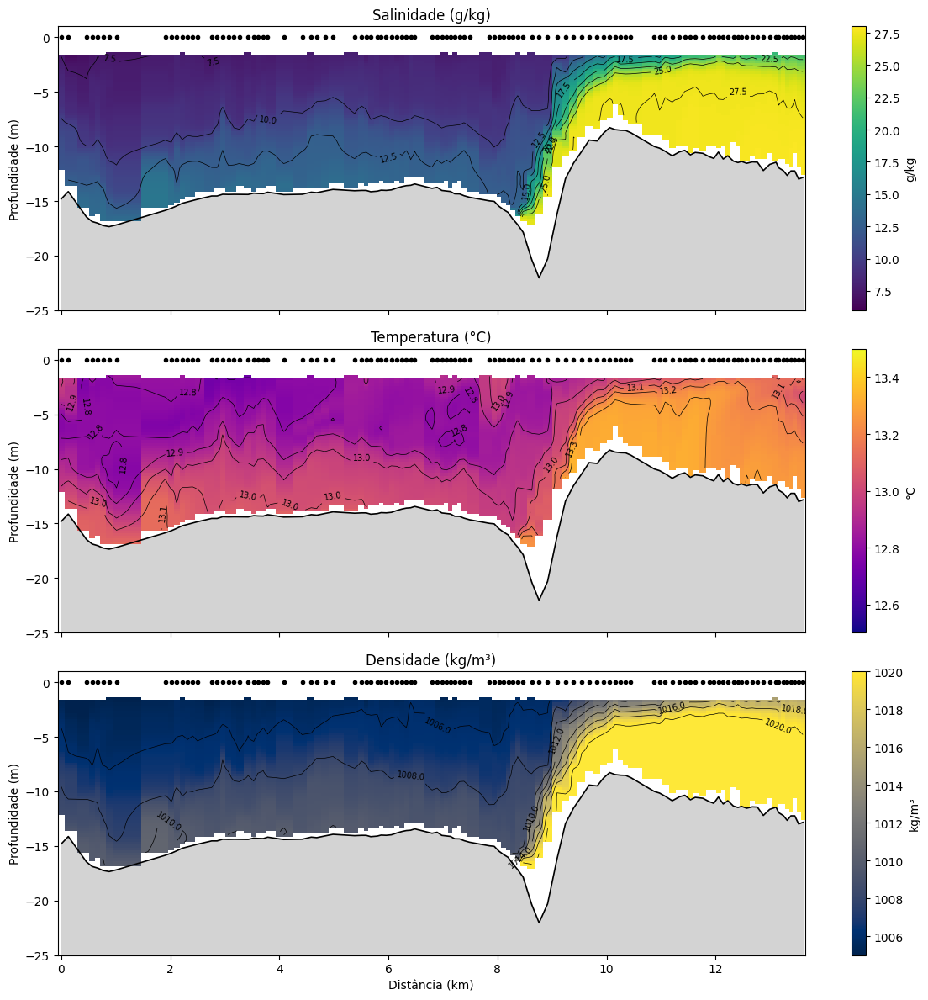

In [90]:
plot_secao_2d_multivariaveis(
    z=z,
    vars_dict={
        'Salinidade (g/kg)': sal,
        'Temperatura (°C)': temp,
        'Densidade (kg/m³)': rho
    },
    x=dist,
    z_fundo=depth_drift,
    cmap_dict={
        'Salinidade (g/kg)': 'viridis',
        'Temperatura (°C)': 'plasma',
        'Densidade (kg/m³)': 'cividis'
    },
    vminmax_dict={
        'Salinidade (g/kg)': (6, 28),
        'Temperatura (°C)': (12.5, 13.5),
        'Densidade (kg/m³)': (1005, 1020)
    },
    salvar_fig=True,
    caminho_fig='../figuras/',
    nome_fig='secao_drift_sal_temp_rho'
)


In [92]:
# === Organiza os dados por cast ===
x_casts = np.unique(mtx_tj_calc[:, 0])
z = []
N2 = []
S2 = []
Ri = []
Az = []

for xval in x_casts:
    idx = mtx_tj_calc[:, 0] == xval
    profs = mtx_tj_calc[idx, 1]
    
    # Verifica se há dados suficientes
    if len(profs) < 2:
        continue
    
    z.append(profs)
    N2.append(np.log10(mtx_tj_calc[idx, 2]))
    S2.append(np.log10(mtx_tj_calc[idx, 3]))
    Ri.append(np.log10(mtx_tj_calc[idx, 4] / 0.25))
    Az.append(np.log10(mtx_tj_calc[idx, 6]))

# Atualiza vetor de distância e fundo
dist = x_casts
depth_drift = [np.max(p) for p in z]  # ou outro vetor de profundidade do fundo, se disponível



/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_5299/3747659130.py:18: RuntimeWarning: invalid value encountered in log10
  N2.append(np.log10(mtx_tj_calc[idx, 2]))
/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_5299/3747659130.py:20: RuntimeWarning: invalid value encountered in log10
  Ri.append(np.log10(mtx_tj_calc[idx, 4] / 0.25))
/var/folders/gk/8j_35bvx62ngh8g4pz4f8ykr0000gn/T/ipykernel_5299/3747659130.py:21: RuntimeWarning: invalid value encountered in log10
  Az.append(np.log10(mtx_tj_calc[idx, 6]))


In [93]:
x_casts = np.unique(mtx_tj_calc[:, 0])
z = []
N2 = []
S2 = []
Ri = []
Az = []

for xval in x_casts:
    idx = mtx_tj_calc[:, 0] == xval
    profs = mtx_tj_calc[idx, 1]

    if len(profs) < 2:
        continue

    z.append(profs)

    # === Mascarando valores não positivos ===
    def safe_log10(arr):
        arr = np.where(arr > 0, arr, np.nan)
        return np.log10(arr)

    N2.append(safe_log10(mtx_tj_calc[idx, 2]))
    S2.append(safe_log10(mtx_tj_calc[idx, 3]))
    Ri.append(safe_log10(mtx_tj_calc[idx, 4] / 0.25))
    Az.append(safe_log10(mtx_tj_calc[idx, 6]))

# Atualiza vetor de distância e fundo
dist = x_casts
depth_drift = [np.nanmax(p) for p in z]


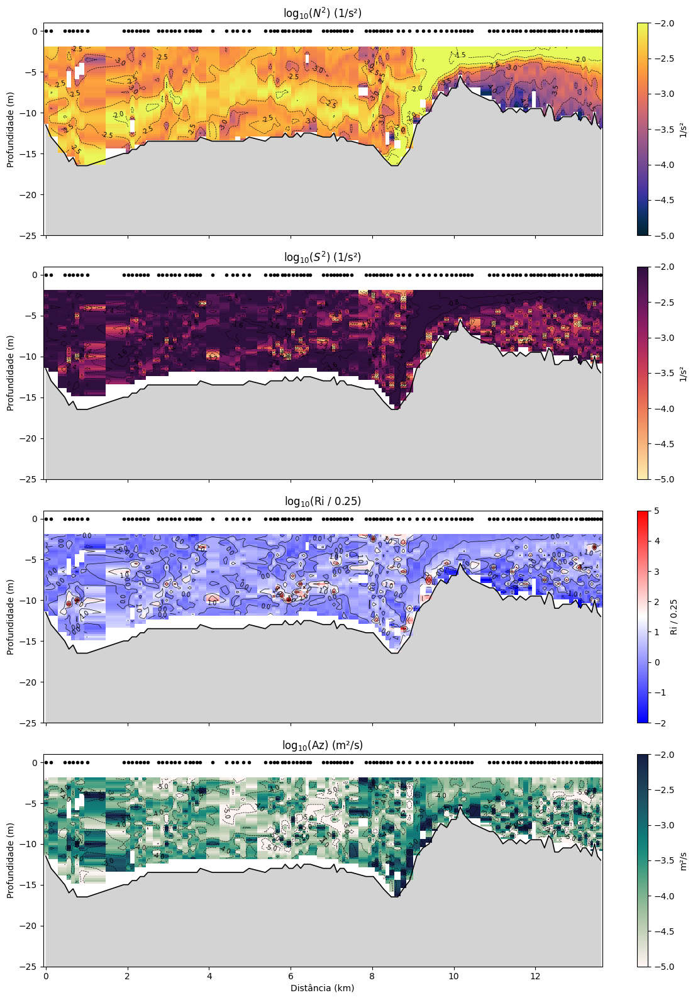

In [94]:
plot_secao_2d_multivariaveis(
    z=z,
    vars_dict={
        'log$_{10}$($N^2$) (1/s²)': N2,
        'log$_{10}$($S^2$) (1/s²)': S2,
        'log$_{10}$(Ri / 0.25)': Ri,
        'log$_{10}$(Az) (m²/s)': Az
    },
    x=dist,
    z_fundo=depth_drift,
    cmap_dict={
        'log$_{10}$($N^2$) (1/s²)': cmocean.cm.thermal,
        'log$_{10}$($S^2$) (1/s²)': cmocean.cm.matter,
        'log$_{10}$(Ri / 0.25)': 'bwr',
        'log$_{10}$(Az) (m²/s)': cmocean.cm.tempo
    },
    vminmax_dict={
        'log$_{10}$($N^2$) (1/s²)': (-5, -2),
        'log$_{10}$($S^2$) (1/s²)': (-5, -2),
        'log$_{10}$(Ri / 0.25)': (-2, 5),
        'log$_{10}$(Az) (m²/s)': (-5, -2)
    },
    salvar_fig=True,
    caminho_fig='../figuras/',
    nome_fig='secao_logvars_drift'
)


In [96]:
def safe_log10_clip(arr, lim=1e-10):
    """Evita log10 de zero ou valores negativos"""
    arr = np.clip(arr, lim, None)  # substitui valores <= lim por lim
    return np.log10(arr)

x_casts = np.unique(mtx_tj_calc[:, 0])
z = []
N2 = []
S2 = []
Ri = []
Az = []

for xval in x_casts:
    idx = mtx_tj_calc[:, 0] == xval
    profs = mtx_tj_calc[idx, 1]

    if len(profs) < 2:
        continue

    z.append(profs)

    N2.append(safe_log10_clip(mtx_tj_calc[idx, 2]))
    S2.append(safe_log10_clip(mtx_tj_calc[idx, 3]))
    Ri.append(safe_log10_clip(mtx_tj_calc[idx, 4] / 0.25))
    Az.append(safe_log10_clip(mtx_tj_calc[idx, 6]))

dist = x_casts
depth_drift = [np.nanmax(p) for p in z]


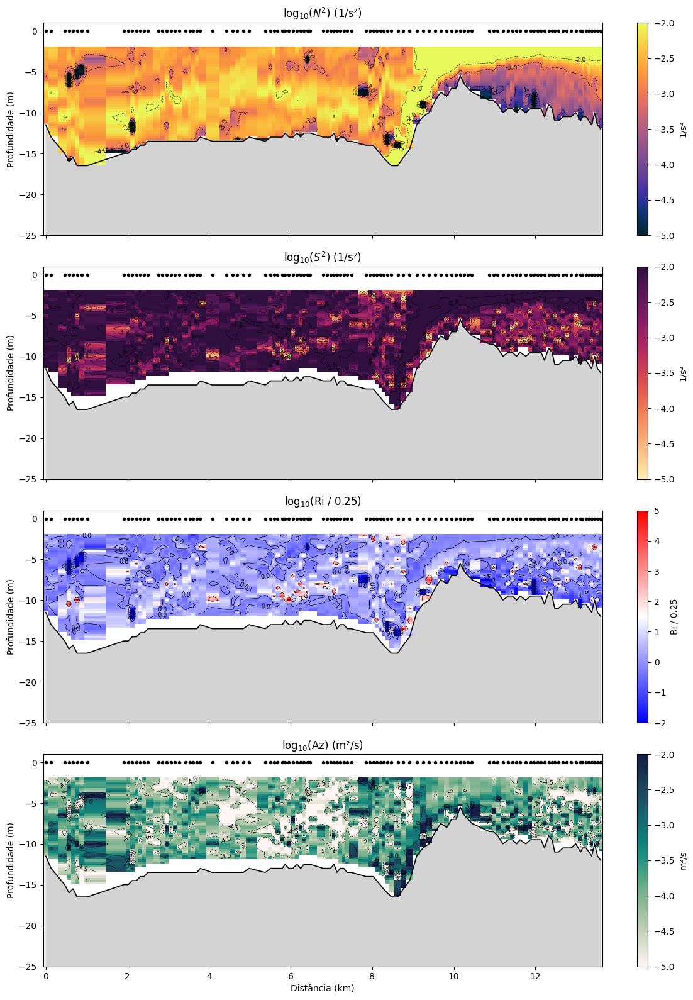

In [97]:
plot_secao_2d_multivariaveis(
    z=z,
    vars_dict={
        'log$_{10}$($N^2$) (1/s²)': N2,
        'log$_{10}$($S^2$) (1/s²)': S2,
        'log$_{10}$(Ri / 0.25)': Ri,
        'log$_{10}$(Az) (m²/s)': Az
    },
    x=dist,
    z_fundo=depth_drift,
    cmap_dict={
        'log$_{10}$($N^2$) (1/s²)': cmocean.cm.thermal,
        'log$_{10}$($S^2$) (1/s²)': cmocean.cm.matter,
        'log$_{10}$(Ri / 0.25)': 'bwr',
        'log$_{10}$(Az) (m²/s)': cmocean.cm.tempo
    },
    vminmax_dict={
        'log$_{10}$($N^2$) (1/s²)': (-5, -2),
        'log$_{10}$($S^2$) (1/s²)': (-5, -2),
        'log$_{10}$(Ri / 0.25)': (-2, 5),
        'log$_{10}$(Az) (m²/s)': (-5, -2)
    },
    salvar_fig=True,
    caminho_fig='../figuras/',
    nome_fig='secao_logvars_drift'
)


In [79]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d
import os

def plot_secao_2d_multivariaveis(
    z,
    vars_dict,
    x,
    z_fundo,
    cmap_dict=None,
    vminmax_dict=None,
    salvar_fig=False,
    caminho_fig='./',
    nome_fig='secao_2d_multi'
):
    """
    Plota várias variáveis em seções verticais 2D com fundo real.

    Parâmetros:
    - z: lista de arrays de profundidades (um por cast)
    - vars_dict: dicionário {'Nome da variável (unidade)': lista de arrays da variável}
    - x: vetor de distâncias ao longo da seção
    - z_fundo: vetor com a profundidade do fundo
    - cmap_dict: dicionário de colormaps para cada variável
    - vminmax_dict: dicionário de tuplas (vmin, vmax) para cada variável
    - salvar_fig: bool, se True salva o gráfico como PNG
    - caminho_fig: pasta de saída
    - nome_fig: nome do arquivo de figura (sem extensão)
    """

    nvars = len(vars_dict)
    fig, axs = plt.subplots(nvars, 1, figsize=(12, 4 * nvars), sharex=True)

    if not isinstance(axs, np.ndarray):
        axs = [axs]

    zmax = max([np.nanmax(zi) for zi in z if len(zi) > 1])
    zgrid = np.arange(0.5, zmax + 0.25, 0.25)

    for ax, (nome_var, v) in zip(axs, vars_dict.items()):
        # Interpola a variável
        v_interp = []
        for zi, vi in zip(z, v):
            if len(zi) < 2 or len(vi) < 2:
                continue
            n = min(len(zi), len(vi))
            f = interp1d(zi[:n], vi[:n], bounds_error=False, fill_value=np.nan)
            v_interp.append(f(zgrid))

        v_interp = np.array(v_interp).T  # (profundidade, perfil)
        x_valid = np.array(x[:v_interp.shape[1]])
        fundo_valid = np.array(z_fundo[:v_interp.shape[1]])

        # Grade
        X, Z = np.meshgrid(x_valid, -zgrid)

        # Máscara para fundo
        fundo_valid = -np.abs(fundo_valid)
        mask = Z < fundo_valid[np.newaxis, :]
        v_masked = np.where(mask, np.nan, v_interp)

        # Colormap e limites
        cmap = cmap_dict[nome_var] if cmap_dict and nome_var in cmap_dict else 'viridis'
        vmin, vmax = (None, None)
        if vminmax_dict and nome_var in vminmax_dict:
            vmin, vmax = vminmax_dict[nome_var]

        # Plot principal
        pcm = ax.pcolormesh(X, Z, v_masked, shading='auto', cmap=cmap, vmin=vmin, vmax=vmax)
        ax.plot(x_valid, fundo_valid, color='k', lw=1.2)

        # Preenche abaixo da batimetria com cinza claro suavemente
        ax.fill_between(x_valid, fundo_valid, zmax * 0.1, color='lightgray', zorder=0)

        # Contornos
        cs = ax.contour(X, Z, v_masked, colors='k', linewidths=0.5, levels=8)
        ax.clabel(cs, inline=1, fontsize=7, fmt='%.1f')

        # Título e rótulos
        ax.set_ylabel('Profundidade (m)')
        ax.set_title(nome_var)
        ax.set_ylim(-zmax - 1, 1)

        # Marcas dos casts
        for xi in x_valid:
            ax.plot(xi, 0, 'o', color='black', markersize=3)

        # Barra de cores
        cbar = fig.colorbar(pcm, ax=ax, orientation='vertical')
        cbar.set_label(nome_var.split('(')[-1].strip(')'))

    axs[-1].set_xlabel('Distância (km)')
    plt.tight_layout()

    if salvar_fig:
        if not os.path.exists(caminho_fig):
            os.makedirs(caminho_fig)
        fig.savefig(os.path.join(caminho_fig, nome_fig + '.png'), dpi=300, bbox_inches='tight')

    plt.show()


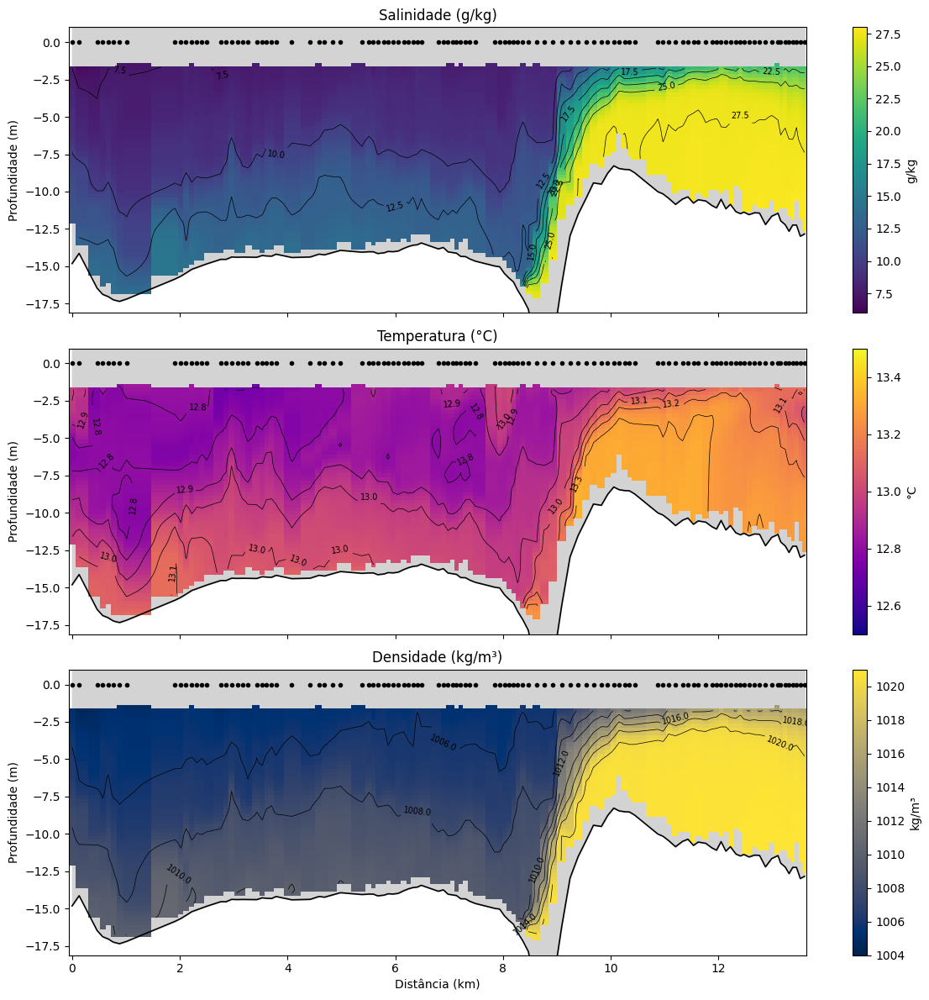

In [80]:
plot_secao_2d_multivariaveis(
    z=z,
    vars_dict={
        'Salinidade (g/kg)': sal,
        'Temperatura (°C)': temp,
        'Densidade (kg/m³)': rho
    },
    x=dist,
    z_fundo=depth_drift,
    cmap_dict={
        'Salinidade (g/kg)': 'viridis',
        'Temperatura (°C)': 'plasma',
        'Densidade (kg/m³)': 'cividis'
    },
    vminmax_dict={
        'Salinidade (g/kg)': (6, 28),
        'Temperatura (°C)': (12.5, 13.5),
        'Densidade (kg/m³)': (1004, 1021)
    },
    salvar_fig=True,
    caminho_fig='../figuras/',
    nome_fig='secao_drift_multi'
)


In [57]:
# Separando as variáveis do mtx_tj
x = mtx_tj[:, 1]          # distância ao longo do canal (em km)
z_raw = mtx_tj[:, 2]      # profundidade
s_raw = mtx_tj[:, 3]      # salinidade

# Organizando por casts
casts = np.unique(x)  # cada cast tem valor único de distância
z = []
sal = []

for xi in casts:
    idx = np.where(x == xi)
    zi = z_raw[idx]
    si = s_raw[idx]

    # Ignorar casts muito rasos ou com todos NaN
    if np.sum(~np.isnan(si)) > 2:
        z.append(zi)
        sal.append(si)

# Redefinindo x com os casts válidos
x_valid = list(casts[i] for i in range(len(z)))

# Fundo correspondente (já em negativo)
z_fundo = -np.interp(x_valid, dist, depth_drift)


## LIXO:

In [ ]:
# Rumos magnéticos dos blocos
rumo1 = 180
rumo2 = 158
rumo3 = 145

declinacao = -16.3  # graus

# Corrigidos para norte verdadeiro
theta1 = np.radians(rumo1 - declinacao)
theta2 = np.radians(rumo2 - declinacao)
theta3 = np.radians(rumo3 - declinacao)
